In [1]:
from HeaderP import *

In [542]:
def log_prior(params):
    m = params[0]
    return -1.5 * np.log(1 + m*m)

def log_marg_prob_scatter(params, S, yn, xn):
    m, b, log_lambda = params
    v = np.array([-m, 1.0])

    # Enforce the log-uniform prior on lambda. 
    if not -5.0 < log_lambda < 5.0:
        return -np.inf

    # Compute \Sigma^2 and \Delta.
    lamd = np.exp(log_lambda)
    Lambda = np.zeros((2,2))
    Lambda[0,0], Lambda[0,1], Lambda[1,0], Lambda[1,1] =  m**2, -m, -m, 1
    Lambda = Lambda * lamd**2/(1+m**2)
    Sigma2 = np.dot(np.dot(S+Lambda, v), v)
    Delta = m * xn + b - yn

    # Compute the log likelihood up to a constant.
    ll = -0.5 * np.sum(Delta**2 / Sigma2 + np.log(Sigma2))
    return ll + log_prior(params)

import emcee

def monoage(feh,r,age,agebin=np.linspace(0,14,8),xlims=[6,12],ylims=[-1.5,0.5]):
    colors = getcolor(range(len(agebin)+1))
    plt.figure(figsize=(20,8))
    for i in range(len(agebin)-1):
        m = (age>agebin[i])&(age<agebin[i+1])
        r_sing, feh_sing = zip(*sorted(zip(r[m], feh[m])))
        r_sing, feh_sing = np.array(r_sing, dtype=float), np.array(feh_sing, dtype=float)
        
        m2 = (r_sing>xlims[0])&(r_sing<xlims[1])
        r_sing = r_sing[m2]
        feh_sing = feh_sing[m2]
        
        r_ave, feh_ave = movingMed_time(r_sing, feh_sing, 1, 0.1)
        #feh_ave = gaussian_filter(feh_ave, 4)
        """if agebin[i]==12.:
            plt.plot(r_sing, feh_sing,'.', color=colors[i], markersize=1)"""
        plt.plot(r_ave, feh_ave, color=colors[i], 
                 label='[%.2f Gyr, %.2f Gyr]'%(agebin[i],agebin[i+1]))
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.35),
          ncol=3)
    plt.grid(color='grey', linestyle='-', linewidth=1)
    plt.xlabel('R [kpc]')
    plt.ylabel('[Fe/H]')
    plt.xlim(xlims)
    plt.ylim(ylims)

def getscatt_bay(feh, r, age, feh_err, r_err, agebin=np.linspace(0,14,8),
             rbin=10, xlims=[6,12],ylims=[-1.5,0.5],feherr=[]):
    
    nwalkers=64
    rbins = np.linspace(xlims[0], xlims[1], rbin)
    scatters = np.zeros((len(agebin)-1, rbin-1))
    scatters_err = np.zeros((len(agebin)-1, rbin-1))
    
    m = (r>xlims[0])&(r<xlims[1])
    feh, r, age = feh[m], r[m], age[m]
    feherr = feh_err[m]
    rerr = r_err[m]
    
    for i in range(len(agebin)-1):
        m = (age>agebin[i])&(age<agebin[i+1])
        r_sing, feh_sing = r[m], feh[m]
        feh_err_sing = feherr[m]
        r_err_sing = rerr[m]
        
        for j in range(rbin-1):
            m = (r_sing>rbins[j])&(r_sing<rbins[j+1])
            if sum(m)<10:
                #print(agebin[i], rbins[j], sum(m))
                print('not enough stars')
                scatters[i,j] = np.nan
            else:
                r_sing_2, feh_sing_2 = r_sing[m], feh_sing[m]
                feh_err_sing_2 = feh_err_sing[m]
                r_err_sing_2 = r_err_sing[m]
        
                S = np.zeros((len(feh_sing_2),2,2))
                for k in range(len(feh_sing_2)):
                    S[k,0,0] = r_err_sing_2[k]**2
                    S[k,1,1] = feh_err_sing_2[k]**2
                print(agebin[i], rbins[j], len(feh_sing_2))
                z = np.polyfit(r_err_sing_2,feh_sing_2,1)
                sampler_scatter = emcee.EnsembleSampler(nwalkers, 3, log_marg_prob_scatter, args=(S, feh_sing_2, r_sing_2))
                p0 = np.array([z[0], z[1], np.log(0.03)])
                p0 = p0 + 1e-4 * np.random.randn(nwalkers, len(p0))
                pos, _, _ = sampler_scatter.run_mcmc(p0, 1000, progress=True)
                sampler_scatter.reset()
                sampler_scatter.run_mcmc(pos, 6000, progress=True)
                samples_scatter = sampler_scatter.flatchain

                """# m
                mcmc = np.percentile(samples_scatter[:, 0], [16, 50, 84])
                q = np.diff(mcmc)
                hi_m[i,0], hi_m[i,1], hi_m[i,2] = mcmc[1], q[0], q[1]

                # b
                mcmc = np.percentile(samples_scatter[:, 1], [16, 50, 84])
                q = np.diff(mcmc)
                hi_b[i,0], hi_b[i,1], hi_b[i,2] = mcmc[1], q[0], q[1]"""

                # dispersion
                mcmc = np.percentile(samples_scatter[:, 2], [16, 50, 84])
                q = np.diff(mcmc)
                scatters[i,j], dishi, dislow = mcmc[1], q[0], q[1]
                scatters_err[i,j] = np.mean(abs(dishi)+abs(dislow))

                
    return (agebin[:-1]+agebin[1:])/2, (rbins[:-1]+rbins[1:])/2, scatters, scatters_err


def getscatt(feh, r, age, agebin=np.linspace(0,14,8),
             rbin=10, xlims=[6,12],ylims=[-1.5,0.5],feherr=[]):
    rbins = np.linspace(xlims[0], xlims[1], rbin)
    scatters = np.zeros((len(agebin)-1, rbin-1))
    
    m = (r>xlims[0])&(r<xlims[1])
    feh, r, age = feh[m], r[m], age[m]
    if len(feherr)>0:
            feherr = feherr[m]
    
    for i in range(len(agebin)-1):
        m = (age>agebin[i])&(age<agebin[i+1])
        r_sing, feh_sing = r[m], feh[m]
        if len(feherr)>0:
            feh_err_sing = feherr[m]
        for j in range(rbin-1):
            m = (r_sing>rbins[j])&(r_sing<rbins[j+1])
            if sum(m)<10:
                #print('not enough stars')
                scatters[i,j] = np.nan
            else:
                r_sing_2, feh_sing_2 = r_sing[m], feh_sing[m]
                p = fitpoints(r_sing_2, feh_sing_2) 
                scatters[i,j] = np.std(feh_sing_2-p(r_sing_2))

                if len(feherr)>0:
                    feh_err_sing_2 = feh_err_sing[m]
                    scatters[i,j] = np.sqrt(scatters[i,j]**2-np.mean(feh_err_sing_2)**2)
                    #print(scatters[i,j])
    return (agebin[:-1]+agebin[1:])/2, (rbins[:-1]+rbins[1:])/2, scatters
    
def monoage_line(feh,r,age,agebin=np.linspace(0,14,8),xlims=[6,12],ylims=[-1.5,0.5],
                feherr=[], plotlegend=True, pltfig=True):
    colors = getcolor(range(len(agebin)+1))
    slopes = np.zeros(len(agebin)-1)
    fehscatter = np.zeros(len(agebin)-1)
    
    if pltfig:
        plt.figure(figsize=(20,8))
    for i in range(len(agebin)-1):
        m = (age>agebin[i])&(age<agebin[i+1])
        if sum(m)==0:
            slopes[i] = np.nan
            fehscatter[i] = np.nan
            continue
        r_sing, feh_sing = zip(*sorted(zip(r[m], feh[m])))
        r_sing, feh_sing = np.array(r_sing, dtype=float), np.array(feh_sing, dtype=float)
        
        m2 = (r_sing>xlims[0])&(r_sing<xlims[1])
        if sum(m2)==0:
            slopes[i] = np.nan
            fehscatter[i] = np.nan
            continue
        p = fitpoints(r_sing[m2], feh_sing[m2]) 
        slopes[i] = p[1]
        fehscatter[i] = np.std(feh_sing[m2]-p(r_sing[m2]))
        if len(feherr)>0:
            fehscatter[i] = np.sqrt(fehscatter[i]**2-np.mean(feherr[m][m2])**2)
            #print(np.std(feh_sing[m2]-p(r_sing[m2])))
        if pltfig:
            plt.plot(r_sing[m2], p(r_sing[m2]), color=colors[i], 
                 label='[%.2f Gyr, %.2f Gyr]'%(agebin[i],agebin[i+1]))
    if pltfig:
        if plotlegend:
            plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.35),
          ncol=3)
        plt.xlabel('R [kpc]')
        plt.ylabel('[Fe/H]')
        plt.xlim(xlims)
        plt.ylim(ylims)
    return (agebin[:-1]+agebin[1:])/2, slopes, fehscatter
    
def getcolor(vrange, cmap=plt.cm.get_cmap('plasma')):
    norm = matplotlib.colors.Normalize(vmin=min(vrange), vmax=max(vrange))
    #print([cmap(norm(i)) for i in vrange])
    return [cmap(norm(i)) for i in vrange]


def avr(age, r, vz, rbin=np.linspace(6,12,4), agebin=np.linspace(0,14,10)):
    colors = getcolor(range(len(rbin)+1))
    avrs = np.zeros((len(rbin)-1, len(agebin)-1))
    for i in range(len(rbin)-1):
        m = (r>rbin[i])&(r<rbin[i+1])
        age_r, r_r, vz_r = age[m], r[m], vz[m]
        for j in range(len(agebin)-1):
            m2 = (age_r>agebin[j])&(age_r<agebin[j+1])
            if sum(m2)<50:
                avrs[i,j]=np.nan
            else:
                vz_r_age = vz_r[m2]
                avrs[i,j] = 1.5*sum(abs(vz_r_age-np.median(vz_r_age)))/sum(m2)
    return (agebin[:-1]+agebin[1:])/2, (rbin[:-1]+rbin[1:])/2, avrs
  

# Maosheng subgiant: https://www.nature.com/articles/s41586-022-04496-5

In [1126]:
from astropy.table import Table
sub = Table.read('subgiant_fullparam_update.fits', format='fits')
sub = sub.to_pandas()
sub_rbir = pd.read_csv('RbirLAMOST.csv')
sub_rbir.columns

sub_rbir = sub_rbir.rename(columns={'          rb': 'Rb', 
                                    '          rb_err': 'Rb_err',
                                   '       specid':'specid'})
sub['SPECID'] = [str(i.decode(encoding="utf-8").split()[0]) for i in sub['SPECID']]
sub_rbir['specid'] = [str(i.split()[0]) for i in sub_rbir['specid']]

sub = pd.merge(sub, 
               sub_rbir[['specid', 'Rb', 'Rb_err']], 
               left_on='SPECID', right_on='specid', how='inner')
sub

,NUM,RA,DEC,SPECID,SNR_G,TEFF,TEFF_ERR,LOGG,LOGG_ERR,FEH,...,R_GUIDING,R_APO,R_PERI,U,V,W,DELTA,specid,Rb,Rb_err
0,2,332.300352,-1.566708,20111024-F5902-01-093,38.060001,5989.644531,41.567348,4.218867,0.092477,-0.524888,...,5.826285,7.821283,5.121624,-2.800932,-51.694530,7.689068,0.374308,20111024-F5902-01-093,11.850,2.547
1,5,330.271298,-0.940016,20111024-F5902-02-169,20.459999,5691.561523,56.098557,3.809866,0.161478,-0.754623,...,5.250849,7.554014,4.503441,32.841484,-73.599098,17.886665,0.368036,20111024-F5902-02-169,4.438,1.969
2,6,330.647473,-1.613945,20111024-F5902-02-218,36.930000,5703.019043,35.453484,3.885453,0.099010,-0.716993,...,7.188559,8.724494,6.888308,65.066223,-23.658245,30.216753,0.364714,20111024-F5902-02-218,7.644,4.725
3,9,331.360469,-0.017034,20111024-F5902-03-047,56.330002,5169.034180,23.653004,3.952794,0.048204,-0.075695,...,5.622092,7.733301,4.704775,34.623859,-67.780670,-24.639688,0.389689,20111024-F5902-03-047,1.881,4.014
4,14,332.271931,0.032772,20111024-F5902-04-094,36.340000,5852.563965,34.030266,3.979938,0.086517,-0.443101,...,6.365765,7.723552,6.247191,47.251446,-44.856701,20.325701,0.363331,20111024-F5902-04-094,9.913,3.232
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200669,247100,301.324719,19.511390,20190608-HD200934N184657B01-15-061,25.160000,6349.384766,63.922832,3.880777,0.139560,-0.265355,...,7.642092,8.853310,6.719159,-0.809863,0.991877,-9.294562,0.629348,20190608-HD200934N184657B01-15-061,11.578,1.934
200670,247101,301.679529,19.844419,20190608-HD200934N184657B01-15-078,60.750000,5362.845703,22.788040,3.832144,0.047025,-0.211407,...,5.917875,8.029772,4.776894,61.975906,-63.150188,-46.427830,0.442143,20190608-HD200934N184657B01-15-078,3.770,1.058
200671,247102,302.360008,19.667063,20190608-HD200934N184657B01-15-112,27.870001,6151.237793,53.837502,4.037323,0.132733,-0.538752,...,7.483530,7.527154,7.470575,33.778160,-11.971305,-0.583835,0.614917,20190608-HD200934N184657B01-15-112,13.692,1.080
200672,247103,302.493578,19.880567,20190608-HD200934N184657B01-15-129,81.669998,5630.796387,16.803864,3.991341,0.036366,0.050142,...,5.698174,7.626591,4.531321,20.930651,-63.846806,14.693364,0.534898,20190608-HD200934N184657B01-15-129,5.429,0.312


In [1127]:
"""from astropy.io import ascii
data = ascii.read("../GaiaDR3/41586_2022_4496_MOESM3_ESM.txt")  
sub = data.to_pandas()

sub['col14'] = np.array(data['col14'].value, dtype=int)

sub = sub.rename(columns={'col1': 'number id', 'col2': 'ra',
                         'col3': 'dec','col4': 'age','col5': 'age_err',
                          'col6': 'feh','col7': 'feh_err','col8': 'Jr',
                          'col9': 'Jphi','col10': 'Jz','col11': 'X',
                          'col12': 'Y','col13': 'Z','col14': 'source_id',
                         'col15': 'specid','col16': 'snr','col17': 'teff',
                         'col18': 'teff_err','col19': 'logg',
                         'col20': 'logg_err','col21': 'k_mag',
                         'col22': 'k_mag_err','col23': 'k_mag_comb',
                         'col24': 'k_mag_comb_err','col25': 'alpha_fe',
                         'col26': 'alpha_fe_err'})

sub['R'] = np.sqrt(sub['X']**2+sub['Y']**2)
sub['feh'] = np.array(sub['feh'], dtype=float)
sub['age'] = np.array(sub['age'], dtype=float)"""

'from astropy.io import ascii\ndata = ascii.read("../GaiaDR3/41586_2022_4496_MOESM3_ESM.txt")  \nsub = data.to_pandas()\n\nsub[\'col14\'] = np.array(data[\'col14\'].value, dtype=int)\n\nsub = sub.rename(columns={\'col1\': \'number id\', \'col2\': \'ra\',\n                         \'col3\': \'dec\',\'col4\': \'age\',\'col5\': \'age_err\',\n                          \'col6\': \'feh\',\'col7\': \'feh_err\',\'col8\': \'Jr\',\n                          \'col9\': \'Jphi\',\'col10\': \'Jz\',\'col11\': \'X\',\n                          \'col12\': \'Y\',\'col13\': \'Z\',\'col14\': \'source_id\',\n                         \'col15\': \'specid\',\'col16\': \'snr\',\'col17\': \'teff\',\n                         \'col18\': \'teff_err\',\'col19\': \'logg\',\n                         \'col20\': \'logg_err\',\'col21\': \'k_mag\',\n                         \'col22\': \'k_mag_err\',\'col23\': \'k_mag_comb\',\n                         \'col24\': \'k_mag_comb_err\',\'col25\': \'alpha_fe\',\n               

In [1128]:
"""kinematic = readfits('../GaiaDR3/gaiadr3.fits')
kinematic['parallax_over_error'] = np.array(kinematic['parallax_over_error'], dtype=float)
kinematic['parallax'] = np.array(kinematic['parallax'], dtype=float)
kinematic['source_id'] = np.array(kinematic['source_id'], dtype=int)
kinematic['parallax_err'] = kinematic['parallax']/kinematic['parallax_over_error']

print(len(sub))
sub = pd.merge(sub, kinematic[['source_id', 'parallax_err']],
              left_on='source_id', right_on='source_id', how='inner')
len(sub)"""

"kinematic = readfits('../GaiaDR3/gaiadr3.fits')\nkinematic['parallax_over_error'] = np.array(kinematic['parallax_over_error'], dtype=float)\nkinematic['parallax'] = np.array(kinematic['parallax'], dtype=float)\nkinematic['source_id'] = np.array(kinematic['source_id'], dtype=int)\nkinematic['parallax_err'] = kinematic['parallax']/kinematic['parallax_over_error']\n\nprint(len(sub))\nsub = pd.merge(sub, kinematic[['source_id', 'parallax_err']],\n              left_on='source_id', right_on='source_id', how='inner')\nlen(sub)"

In [1129]:
len(sub), sub.columns

(200674,
 Index(['NUM', 'RA', 'DEC', 'SPECID', 'SNR_G', 'TEFF', 'TEFF_ERR', 'LOGG',
        'LOGG_ERR', 'FEH', 'FEH_ERR', 'ALPHA_FE', 'ALPHA_FE_ERR', 'VLOS',
        'VLOS_ERR', 'SOURCE_ID', 'PARALLAX', 'PARALLAX_ERROR', 'PARALLAX_ZPT',
        'PMRA', 'PMRA_ERROR', 'PMDEC', 'PMDEC_ERROR', 'RUWE', 'FIDELITY',
        'GAIA_G', 'GAIA_G_ERR', 'GAIA_BP', 'GAIA_BP_ERR', 'GAIA_RP',
        'GAIA_RP_ERR', 'J', 'J_ERR', 'H', 'H_ERR', 'KS', 'KS_ERR', 'RGEO',
        'RGEO_LOW', 'RGEO_HIGH', 'EBV', 'EBV_ERR', 'EXTCOEF_G', 'EXTCOEF_BP',
        'EXTCOEF_RP', 'EXTCOEF_J', 'EXTCOEF_H', 'EXTCOEF_KS', 'MK_GEO',
        'MK_GEO_ERR', 'MK_SPEC', 'MK_SPEC_ERR', 'MK_COMB', 'MK_COMB_ERR',
        'SNR_DPARALLAX', 'LOGDIS', 'LOGDIS_ERR', 'AGE', 'AGE_ERR', 'MASS',
        'MASS_ERR', 'R', 'PHI', 'Z', 'X', 'Y', 'VR', 'VT', 'VZ', 'VX', 'VY',
        'JR', 'JPHI', 'JZ', 'OMEGA_R', 'OMEGA_PHI', 'OMEGA_Z', 'ANGLE_R',
        'ANGLE_PHI', 'ANGLE_Z', 'ECC', 'E', 'ER', 'EZ', 'LX', 'LY', 'LZ',
        'ZMAX', 'R_GU

37459
145205
17996
94143
85174
21305


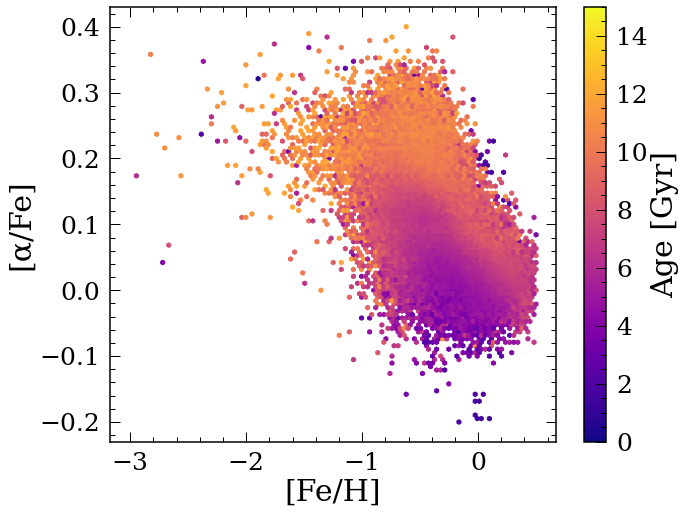

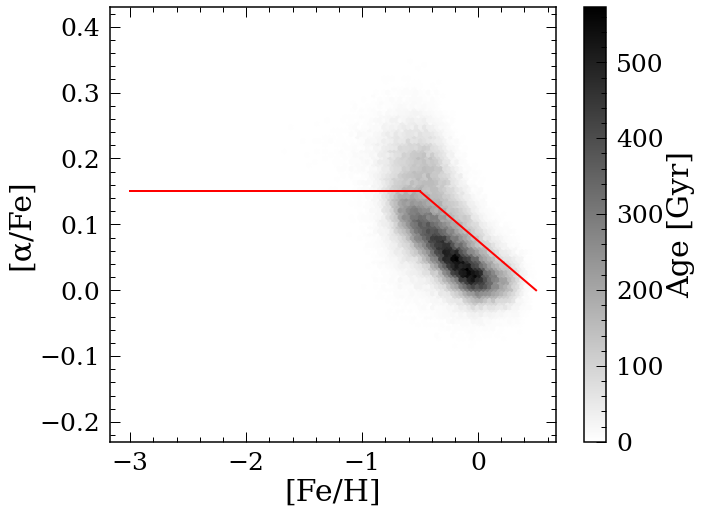

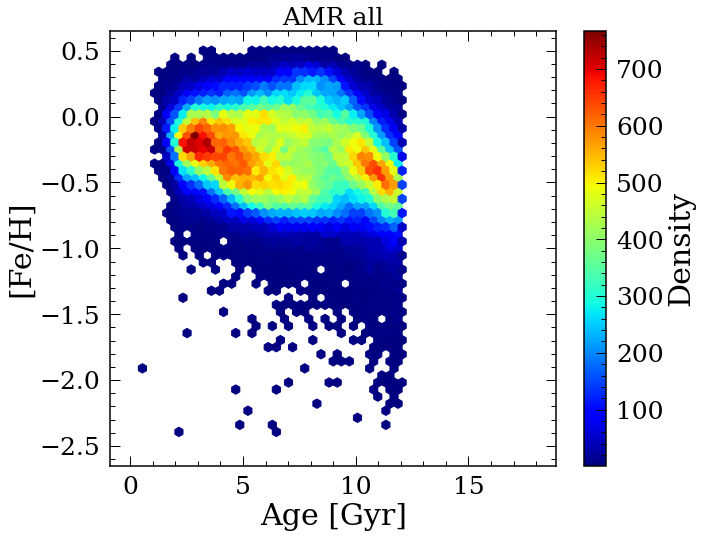

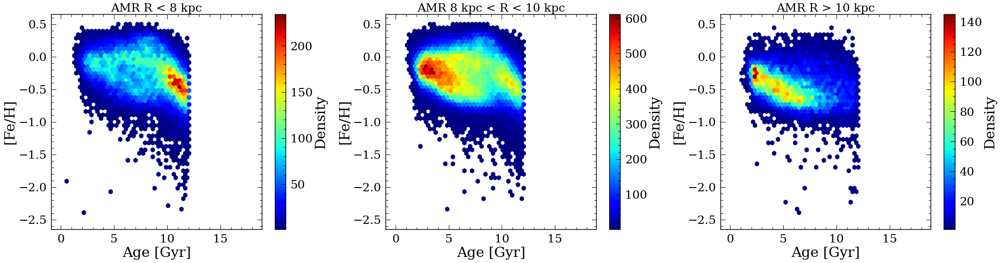

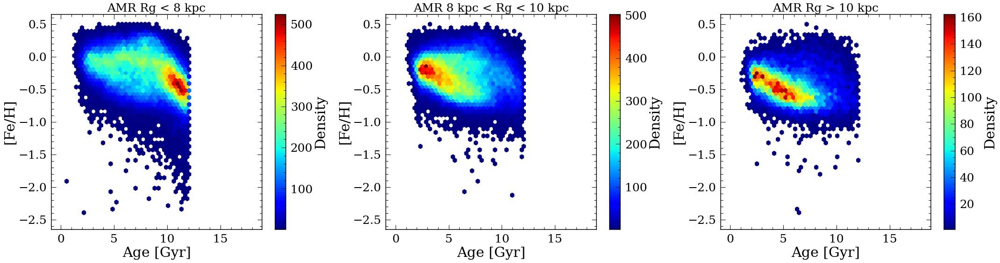

In [1130]:
plt.figure(figsize=(10,8))
plt.hexbin(sub['FEH'], sub['ALPHA_FE'], C=sub['AGE'], extent=(-3,0.5,-0.2,0.4),
          cmap='plasma', vmin=0, vmax=15)
cb = plt.colorbar()
cb.set_label('Age [Gyr]')
plt.xlabel('[Fe/H]')
plt.ylabel('[α/Fe]')


plt.figure(figsize=(10,8))
plt.hexbin(sub['FEH'], sub['ALPHA_FE'], extent=(-3,0.5,-0.2,0.4),
          cmap='binary')

plt.plot([-3,-0.5], [0.15,0.15], 'r-')
plt.plot([-0.5,0.5], [0.15,0], 'r-')
def hilow_disk(feh, alpha):
    hi_low = np.zeros(len(feh))
    
    m = feh<-0.5
    hi_low[m] = alpha[m]>0.15
    
    p = fitpoints([-0.5,0.5], [0.15,0])
    hi_low[~m] = alpha[~m]>p(feh[~m])
    
    return hi_low

sub['hi_low'] = hilow_disk(sub['FEH'].values, sub['ALPHA_FE'].values)
#sub_low = sub.loc[sub['hi_low']==1]
#plt.plot(sub_low['feh'], sub_low['alpha_fe'], 'r.')

cb = plt.colorbar()
cb.set_label('Age [Gyr]')
plt.xlabel('[Fe/H]')
plt.ylabel('[α/Fe]')


plt.figure(figsize=(10,8))
plt.hexbin(sub['AGE'], sub['FEH'], extent=(0,18,-2.5,0.5), cmap='jet',
        mincnt=1, gridsize=50)
plt.xlabel('Age [Gyr]')
plt.ylabel('[Fe/H]')
plt.title('AMR all', fontsize=25)
cb = plt.colorbar()
cb.set_label('Density')




plt.figure(figsize=(30,8))
m = sub['R']<8
plt.subplot(1,3,1)
plt.hexbin(sub['AGE'][m], sub['FEH'][m], extent=(0,18,-2.5,0.5), cmap='jet',
        mincnt=1, gridsize=50)
plt.title('AMR R < 8 kpc', fontsize=25)
plt.xlabel('Age [Gyr]')
plt.ylabel('[Fe/H]')
cb = plt.colorbar()
cb.set_label('Density')
print(sum(m))

m = (sub['R']>8)&(sub['R']<10)
plt.subplot(1,3,2)
plt.hexbin(sub['AGE'][m], sub['FEH'][m], extent=(0,18,-2.5,0.5), cmap='jet',
        mincnt=1, gridsize=50)
plt.title('AMR 8 kpc < R < 10 kpc', fontsize=25)
plt.xlabel('Age [Gyr]')
plt.ylabel('[Fe/H]')
cb = plt.colorbar()
cb.set_label('Density')
print(sum(m))

m = (sub['R']>10)&(sub['R']<15)
plt.subplot(1,3,3)
plt.hexbin(sub['AGE'][m], sub['FEH'][m], extent=(0,18,-2.5,0.5), cmap='jet',
        mincnt=1, gridsize=50)
plt.title('AMR R > 10 kpc', fontsize=25)
plt.xlabel('Age [Gyr]')
plt.ylabel('[Fe/H]')
cb = plt.colorbar()
cb.set_label('Density')
print(sum(m))
plt.tight_layout()





plt.figure(figsize=(30,8))
m = sub['R_GUIDING']<8
plt.subplot(1,3,1)
plt.hexbin(sub['AGE'][m], sub['FEH'][m], extent=(0,18,-2.5,0.5), cmap='jet',
        mincnt=1, gridsize=50)
plt.title('AMR Rg < 8 kpc', fontsize=25)
plt.xlabel('Age [Gyr]')
plt.ylabel('[Fe/H]')
cb = plt.colorbar()
cb.set_label('Density')
print(sum(m))

m = (sub['R_GUIDING']>8)&(sub['R_GUIDING']<10)
plt.subplot(1,3,2)
plt.hexbin(sub['AGE'][m], sub['FEH'][m], extent=(0,18,-2.5,0.5), cmap='jet',
        mincnt=1, gridsize=50)
plt.title('AMR 8 kpc < Rg < 10 kpc', fontsize=25)
plt.xlabel('Age [Gyr]')
plt.ylabel('[Fe/H]')
cb = plt.colorbar()
cb.set_label('Density')
print(sum(m))

m = (sub['R_GUIDING']>10)&(sub['R_GUIDING']<15)
plt.subplot(1,3,3)
plt.hexbin(sub['AGE'][m], sub['FEH'][m], extent=(0,18,-2.5,0.5), cmap='jet',
        mincnt=1, gridsize=50)
plt.title('AMR Rg > 10 kpc', fontsize=25)
plt.xlabel('Age [Gyr]')
plt.ylabel('[Fe/H]')
cb = plt.colorbar()
cb.set_label('Density')
plt.tight_layout()
print(sum(m))

In [1131]:
len(sub)

200674

37459
145205
17996
94143
85174
21305


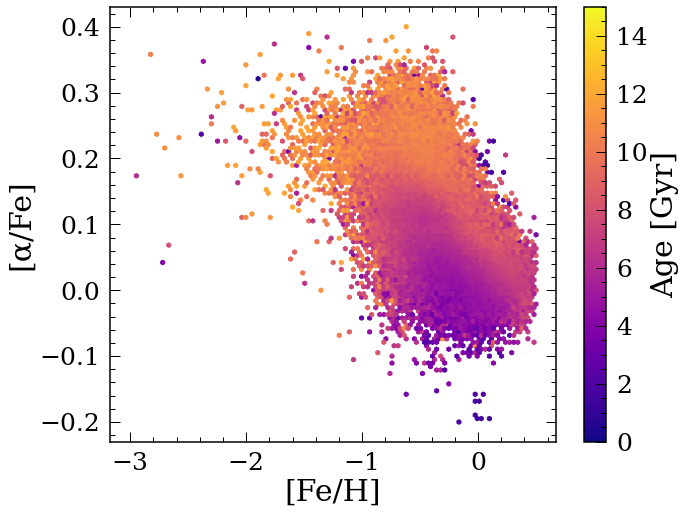

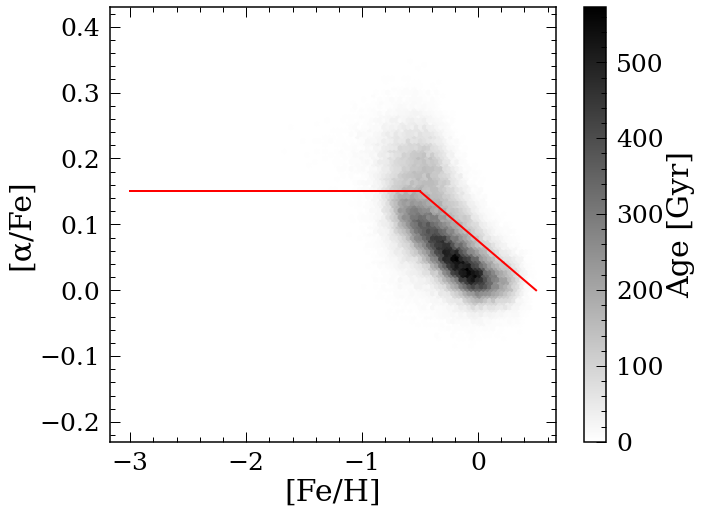

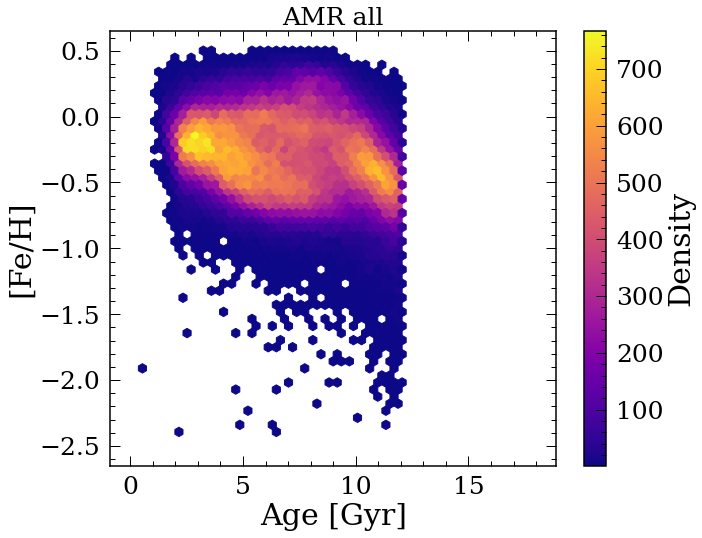

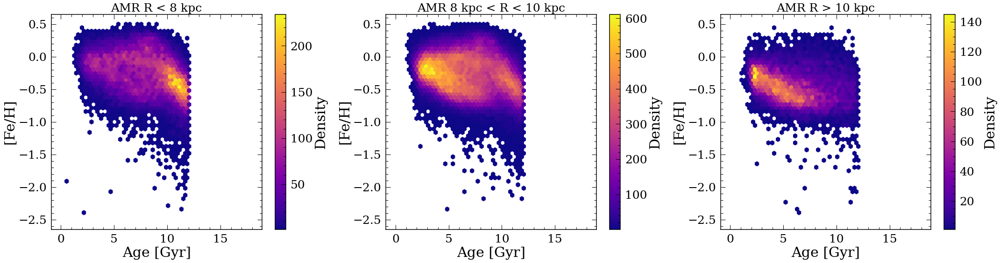

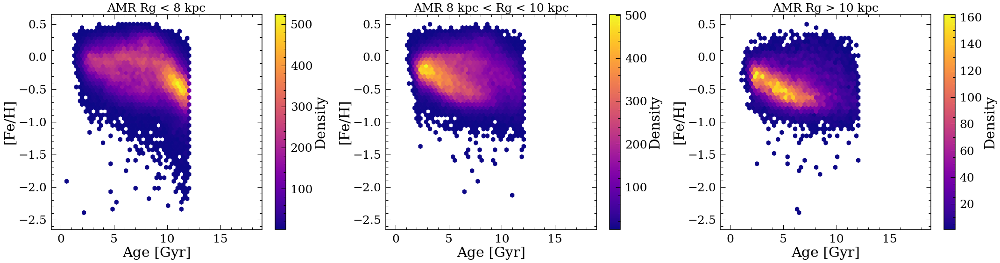

In [1132]:
plt.figure(figsize=(10,8))
plt.hexbin(sub['FEH'], sub['ALPHA_FE'], C=sub['AGE'], extent=(-3,0.5,-0.2,0.4),
          cmap='plasma', vmin=0, vmax=15)
cb = plt.colorbar()
cb.set_label('Age [Gyr]')
plt.xlabel('[Fe/H]')
plt.ylabel('[α/Fe]')


plt.figure(figsize=(10,8))
plt.hexbin(sub['FEH'], sub['ALPHA_FE'], extent=(-3,0.5,-0.2,0.4),
          cmap='binary')

plt.plot([-3,-0.5], [0.15,0.15], 'r-')
plt.plot([-0.5,0.5], [0.15,0], 'r-')
def hilow_disk(feh, alpha):
    hi_low = np.zeros(len(feh))
    
    m = feh<-0.5
    hi_low[m] = alpha[m]>0.15
    
    p = fitpoints([-0.5,0.5], [0.15,0])
    hi_low[~m] = alpha[~m]>p(feh[~m])
    
    return hi_low

sub['hi_low'] = hilow_disk(sub['FEH'].values, sub['ALPHA_FE'].values)
#sub_low = sub.loc[sub['hi_low']==1]
#plt.plot(sub_low['feh'], sub_low['alpha_fe'], 'r.')

cb = plt.colorbar()
cb.set_label('Age [Gyr]')
plt.xlabel('[Fe/H]')
plt.ylabel('[α/Fe]')


plt.figure(figsize=(10,8))
plt.hexbin(sub['AGE'], sub['FEH'], extent=(0,18,-2.5,0.5), cmap='plasma',
        mincnt=1, gridsize=50)
plt.xlabel('Age [Gyr]')
plt.ylabel('[Fe/H]')
plt.title('AMR all', fontsize=25)
cb = plt.colorbar()
cb.set_label('Density')




plt.figure(figsize=(30,8))
m = sub['R']<8
plt.subplot(1,3,1)
plt.hexbin(sub['AGE'][m], sub['FEH'][m], extent=(0,18,-2.5,0.5), cmap='plasma',
        mincnt=1, gridsize=50)
plt.title('AMR R < 8 kpc', fontsize=25)
plt.xlabel('Age [Gyr]')
plt.ylabel('[Fe/H]')
cb = plt.colorbar()
cb.set_label('Density')
print(sum(m))

m = (sub['R']>8)&(sub['R']<10)
plt.subplot(1,3,2)
plt.hexbin(sub['AGE'][m], sub['FEH'][m], extent=(0,18,-2.5,0.5), cmap='plasma',
        mincnt=1, gridsize=50)
plt.title('AMR 8 kpc < R < 10 kpc', fontsize=25)
plt.xlabel('Age [Gyr]')
plt.ylabel('[Fe/H]')
cb = plt.colorbar()
cb.set_label('Density')
print(sum(m))

m = (sub['R']>10)&(sub['R']<15)
plt.subplot(1,3,3)
plt.hexbin(sub['AGE'][m], sub['FEH'][m], extent=(0,18,-2.5,0.5), cmap='plasma',
        mincnt=1, gridsize=50)
plt.title('AMR R > 10 kpc', fontsize=25)
plt.xlabel('Age [Gyr]')
plt.ylabel('[Fe/H]')
cb = plt.colorbar()
cb.set_label('Density')
print(sum(m))
plt.tight_layout()





plt.figure(figsize=(30,8))
m = sub['R_GUIDING']<8
plt.subplot(1,3,1)
plt.hexbin(sub['AGE'][m], sub['FEH'][m], extent=(0,18,-2.5,0.5), cmap='plasma',
        mincnt=1, gridsize=50)
plt.title('AMR Rg < 8 kpc', fontsize=25)
plt.xlabel('Age [Gyr]')
plt.ylabel('[Fe/H]')
cb = plt.colorbar()
cb.set_label('Density')
print(sum(m))

m = (sub['R_GUIDING']>8)&(sub['R_GUIDING']<10)
plt.subplot(1,3,2)
plt.hexbin(sub['AGE'][m], sub['FEH'][m], extent=(0,18,-2.5,0.5), cmap='plasma',
        mincnt=1, gridsize=50)
plt.title('AMR 8 kpc < Rg < 10 kpc', fontsize=25)
plt.xlabel('Age [Gyr]')
plt.ylabel('[Fe/H]')
cb = plt.colorbar()
cb.set_label('Density')
print(sum(m))

m = (sub['R_GUIDING']>10)&(sub['R_GUIDING']<15)
plt.subplot(1,3,3)
plt.hexbin(sub['AGE'][m], sub['FEH'][m], extent=(0,18,-2.5,0.5), cmap='plasma',
        mincnt=1, gridsize=50)
plt.title('AMR Rg > 10 kpc', fontsize=25)
plt.xlabel('Age [Gyr]')
plt.ylabel('[Fe/H]')
cb = plt.colorbar()
cb.set_label('Density')
plt.tight_layout()
print(sum(m))

In [1133]:
sub.columns, len(sub)

(Index(['NUM', 'RA', 'DEC', 'SPECID', 'SNR_G', 'TEFF', 'TEFF_ERR', 'LOGG',
        'LOGG_ERR', 'FEH', 'FEH_ERR', 'ALPHA_FE', 'ALPHA_FE_ERR', 'VLOS',
        'VLOS_ERR', 'SOURCE_ID', 'PARALLAX', 'PARALLAX_ERROR', 'PARALLAX_ZPT',
        'PMRA', 'PMRA_ERROR', 'PMDEC', 'PMDEC_ERROR', 'RUWE', 'FIDELITY',
        'GAIA_G', 'GAIA_G_ERR', 'GAIA_BP', 'GAIA_BP_ERR', 'GAIA_RP',
        'GAIA_RP_ERR', 'J', 'J_ERR', 'H', 'H_ERR', 'KS', 'KS_ERR', 'RGEO',
        'RGEO_LOW', 'RGEO_HIGH', 'EBV', 'EBV_ERR', 'EXTCOEF_G', 'EXTCOEF_BP',
        'EXTCOEF_RP', 'EXTCOEF_J', 'EXTCOEF_H', 'EXTCOEF_KS', 'MK_GEO',
        'MK_GEO_ERR', 'MK_SPEC', 'MK_SPEC_ERR', 'MK_COMB', 'MK_COMB_ERR',
        'SNR_DPARALLAX', 'LOGDIS', 'LOGDIS_ERR', 'AGE', 'AGE_ERR', 'MASS',
        'MASS_ERR', 'R', 'PHI', 'Z', 'X', 'Y', 'VR', 'VT', 'VZ', 'VX', 'VY',
        'JR', 'JPHI', 'JZ', 'OMEGA_R', 'OMEGA_PHI', 'OMEGA_Z', 'ANGLE_R',
        'ANGLE_PHI', 'ANGLE_Z', 'ECC', 'E', 'ER', 'EZ', 'LX', 'LY', 'LZ',
        'ZMAX', 'R_GUIDING', '

In [1134]:
"""plt.hexbin(sub['R'], sub['feh'], C=sub['age'], cmap='plasma',
          extent=(5,15,-3,1), vmin=0, vmax=15)

m = (sub['AGE']>6)&(sub['AGE']<8)
subsub = sub[m]
#m = m&(sub['Jr']<100)
#plt.plot(sub['R'][m], sub['feh'][m], 'k.', alpha=0.2, markersize=1)
#plt.xlim([0,15])
#plt.ylim([-3,1])

plt.hexbin(subsub['R'], subsub['FEH'], cmap='binary', extent=(5,15,-1,0.5))
sub = sub.sort_values(by='R')
r_ave, feh_ave = movingMed_time(subsub['R'], subsub['FEH'], 1, 0.5)
plt.plot(r_ave, feh_ave, 'r-', label='moving median')
plt.legend()
plt.ylabel('[Fe/H]')
plt.xlabel('R [kpc]')
plt.xlim([5,15])
plt.ylim([-1,0.5])

plt.twinx()
plt.hist(sub['R'][m], bins=np.linspace(5,15,100), alpha=0.2, color='b')
plt.ylabel('Histogram', color='b')"""

"plt.hexbin(sub['R'], sub['feh'], C=sub['age'], cmap='plasma',\n          extent=(5,15,-3,1), vmin=0, vmax=15)\n\nm = (sub['AGE']>6)&(sub['AGE']<8)\nsubsub = sub[m]\n#m = m&(sub['Jr']<100)\n#plt.plot(sub['R'][m], sub['feh'][m], 'k.', alpha=0.2, markersize=1)\n#plt.xlim([0,15])\n#plt.ylim([-3,1])\n\nplt.hexbin(subsub['R'], subsub['FEH'], cmap='binary', extent=(5,15,-1,0.5))\nsub = sub.sort_values(by='R')\nr_ave, feh_ave = movingMed_time(subsub['R'], subsub['FEH'], 1, 0.5)\nplt.plot(r_ave, feh_ave, 'r-', label='moving median')\nplt.legend()\nplt.ylabel('[Fe/H]')\nplt.xlabel('R [kpc]')\nplt.xlim([5,15])\nplt.ylim([-1,0.5])\n\nplt.twinx()\nplt.hist(sub['R'][m], bins=np.linspace(5,15,100), alpha=0.2, color='b')\nplt.ylabel('Histogram', color='b')"

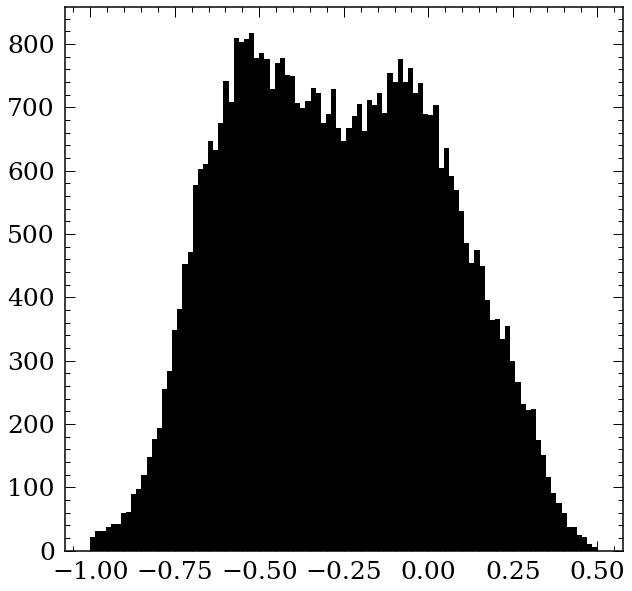

In [1135]:
plt.hist(subsub['FEH'], bins=np.linspace(-1,0.5,100), color='k');

In [1136]:
"""m = subsub['R']<10
plt.plot(subsub['R'][m], subsub['FEH'][m], 'k.', markersize=1)
plt.xlim([5,10])
plt.ylim([-1,0.5])
plt.xlabel('R')
plt.ylabel('[Fe/H]')"""

"m = subsub['R']<10\nplt.plot(subsub['R'][m], subsub['FEH'][m], 'k.', markersize=1)\nplt.xlim([5,10])\nplt.ylim([-1,0.5])\nplt.xlabel('R')\nplt.ylabel('[Fe/H]')"

In [1137]:
m = (abs(sub['Z'])<1)&(sub['AGE_ERR']<np.diff(agebincalc)[0])
m = m&(sub['AGE']>1.5)

m = m&(sub['AGE']>5)
np.mean(sub['AGE_ERR'].values[m]), np.std(sub['AGE_ERR'].values[m])


(0.47683853, 0.21934663)

1998.5 2744.9253391687707
20778


Text(0, 0.5, 'Metallicity Scatter')

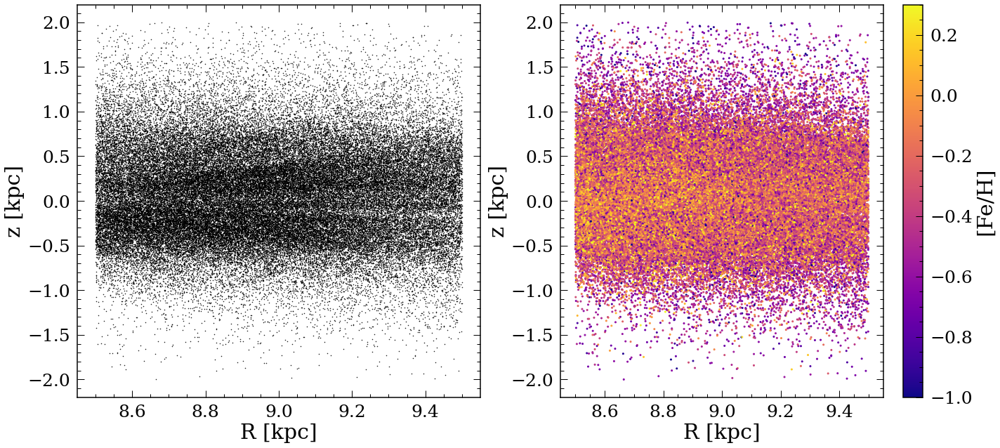

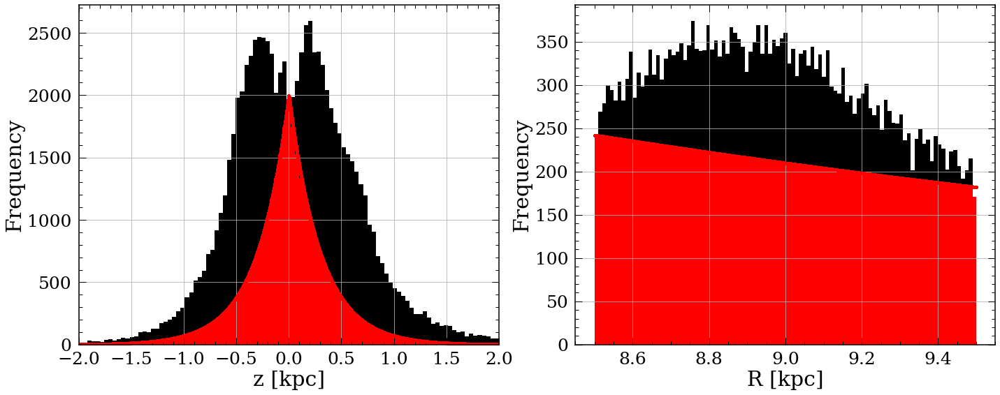

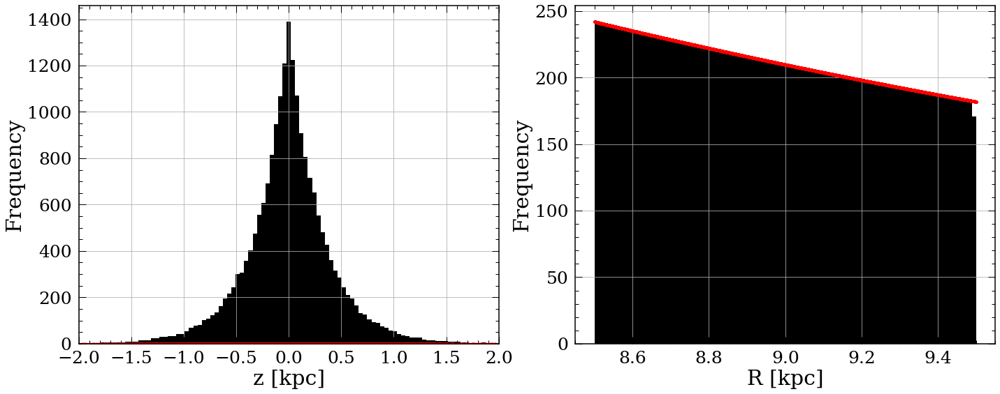

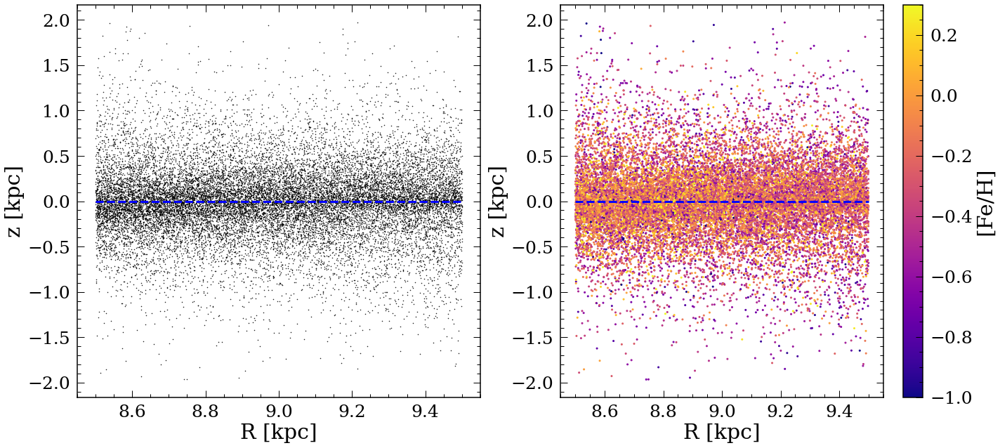

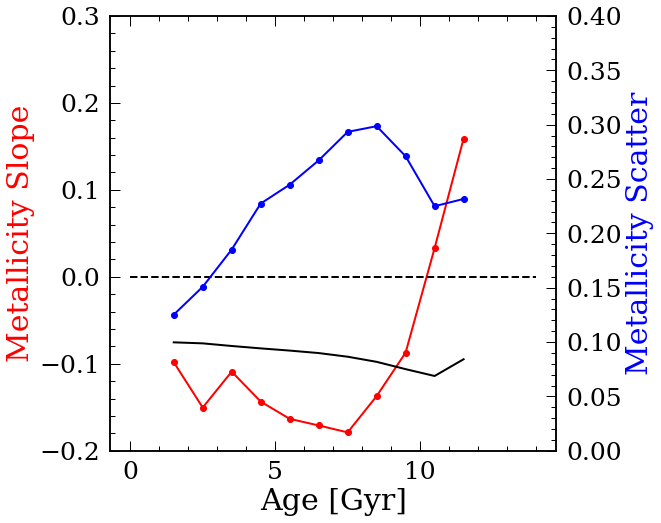

In [1449]:
xrange = [8.5,9.5]

#zsel_scale = 2500
#Rsel_scale = 2500

############## define selection function
def sel_fn(z, mult, scale):
    return mult*np.exp(-abs(z)/scale)
############## define selection function



"""sub = Table.read('subgiant_fullparam_update.fits', format='fits')
sub = sub.to_pandas()"""
sub = sub.loc[abs(sub['ECC'])<0.5].reset_index(drop=True)




sub_check = sub.loc[(sub['R']>xrange[0])&(sub['R']<xrange[1])]
m = (abs(sub_check['Z'])<2)&(sub_check['AGE_ERR']<np.diff(agebincalc)[0])
m = m&(sub_check['AGE']>1.5)

plt.figure(figsize=(20,9))
plt.subplot(1,2,1)
plt.plot(sub_check['R'][m], sub_check['Z'][m], 'k.', markersize=1)
plt.xlabel('R [kpc]')
plt.ylabel('z [kpc]')

plt.subplot(1,2,2)
plt.scatter(sub_check['R'][m], sub_check['Z'][m], 
            c = sub_check['FEH'][m], s=4, cmap='plasma', vmin=-1,
           vmax=0.3)
plt.xlabel('R [kpc]')
plt.ylabel('z [kpc]')
cb = plt.colorbar()
cb.set_label('[Fe/H]')
plt.tight_layout()


##### select stars 
import random
m_sel = np.zeros(len(sub_check))
zbins = np.linspace(-2,2,100)
Rbins = np.linspace(xrange[0], xrange[1], 100)

zsel_scale = sum(abs(sub_check['Z'])<np.diff(zbins)[0])/2

for i in range(len(zbins)-1):
    m_sing = ((sub_check['Z'])>zbins[i])&((sub_check['Z'])<zbins[i+1])
    # number of stars to get
    nubstars = int(sel_fn((zbins[i]+zbins[i+1])/2, zsel_scale, 0.3))
    
    # get all the stars randomly
    randnum = list(range(sum(m_sing)))
    random.shuffle(randnum)
    random_ind = np.zeros(len(randnum))
    random_ind[randnum[:nubstars]] = 1
    
    m_sel[m_sing] = random_ind
m_sel = np.array(m_sel, dtype=bool)

# plot final histogram
plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
(sub_check['Z']).hist(bins=zbins, color='k')
plt.plot((sub_check['Z']), sel_fn(sub_check['Z'], zsel_scale, 0.3), 'r.')
(sub_check['Z'][m_sel]).hist(bins=zbins, color='r')
plt.xlabel('z [kpc]')
plt.ylabel('Frequency')
plt.xlim([-2,2])

plt.subplot(1,2,2)
sub_check = sub_check[m_sel].reset_index(drop=True)
m_sel = np.zeros(len(sub_check))

Rsel_scale = sum((sub_check['R']>Rbins[0])&(sub_check['R']<Rbins[1]))/np.exp(-abs(xrange[0])/3.5)
print(zsel_scale, Rsel_scale)

for i in range(len(Rbins)-1):
    m_sing = (abs(sub_check['R'])>Rbins[i])&(abs(sub_check['R'])<Rbins[i+1])
    # number of stars to get
    nubstars = int(sel_fn((Rbins[i]+Rbins[i+1])/2, Rsel_scale, 3.5))
    
    # get all the stars randomly
    randnum = list(range(sum(m_sing)))
    random.shuffle(randnum)
    random_ind = np.zeros(len(randnum))
    random_ind[randnum[:nubstars]] = 1
    
    m_sel[m_sing] = random_ind
m_sel = np.array(m_sel, dtype=bool)

abs(sub_check['R']).hist(bins=Rbins, color='k')
plt.plot(abs(sub_check['R']), 
         sel_fn(sub_check['R'], Rsel_scale, 3.5), 'r.')
abs(sub_check['R'][m_sel]).hist(bins=Rbins, color='r')
plt.xlabel('R [kpc]')
plt.ylabel('Frequency')
plt.tight_layout()




### final final histogram
plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
(sub_check['Z'][m_sel]).hist(bins=zbins, color='k')
plt.plot((sub_check['Z'][m_sel]), 
         sel_fn(sub_check['Z'][m_sel], 
                sum(abs(sub_check['Z'][m_sel])<zbins[1])/2, 0.3), 'r.')
plt.xlabel('z [kpc]')
plt.ylabel('Frequency')
plt.xlim([-2,2])

plt.subplot(1,2,2)
abs(sub_check['R'][m_sel]).hist(bins=Rbins, color='k')
plt.plot(abs(sub_check['R'][m_sel]), 
         sel_fn(sub_check['R'][m_sel], Rsel_scale, 3.5), 'r.')
plt.xlabel('R [kpc]')
plt.ylabel('Frequency')
plt.tight_layout()
print(sum(m_sel))



#### plot R-z 
plt.figure(figsize=(20,9))
plt.subplot(1,2,1)
plt.plot(sub_check['R'][m_sel], sub_check['Z'][m_sel], 'k.', markersize=1)
plt.xlabel('R [kpc]')
plt.ylabel('z [kpc]')
plt.plot(xrange, [0, 0], 'b--', linewidth=3)

plt.subplot(1,2,2)
plt.scatter(sub_check['R'][m_sel], sub_check['Z'][m_sel], 
            c = sub_check['FEH'][m_sel], s=4, cmap='plasma', vmin=-1,
           vmax=0.3)
plt.plot(xrange, [0, 0], 'b--', linewidth=3)
plt.xlabel('R [kpc]')
plt.ylabel('z [kpc]')
cb = plt.colorbar()
cb.set_label('[Fe/H]')
plt.tight_layout()



#### get slope for selected sample
agebincalc = np.linspace(0,16,17)
ages, slopes, fehscatter = monoage_line(sub_check['FEH'].values[m_sel], 
                                        sub_check['R'].values[m_sel], 
                                        sub_check['AGE'].values[m_sel],
                                        agebin=agebincalc,
                                        xlims=xrange,
                                       feherr=sub_check['FEH_ERR'].values[m_sel],
                                       plotlegend=False,pltfig=False)


(sub_check[m_sel].reset_index(drop=True)).to_csv('Xiang_fitline.csv',index=False)

plt.figure(figsize=(8,8))
plt.plot(ages, slopes, 'r-o')
plt.plot(ages, slopes_rbir, 'k-',zorder=5)
plt.xlabel('Age [Gyr]')
plt.ylabel('Metallicity Slope', color='r',zorder=5)
plt.plot([0,14],[0,0], 'k--',zorder=5)
plt.ylim([-0.2, 0.3])

plt.twinx()
plt.plot(ages, fehscatter, 'b-o')
plt.ylim([0.,0.4])
plt.ylabel('Metallicity Scatter', color='b',zorder=5)



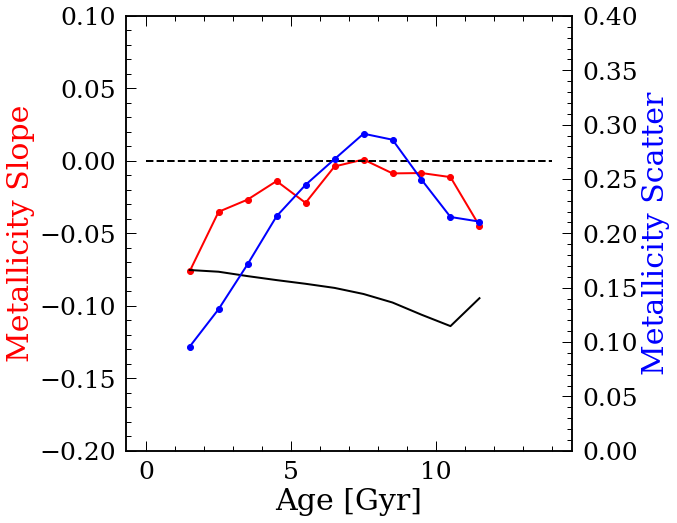

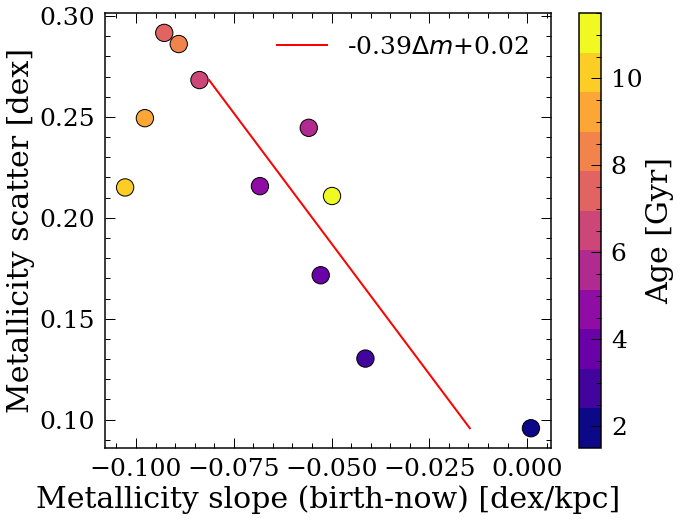

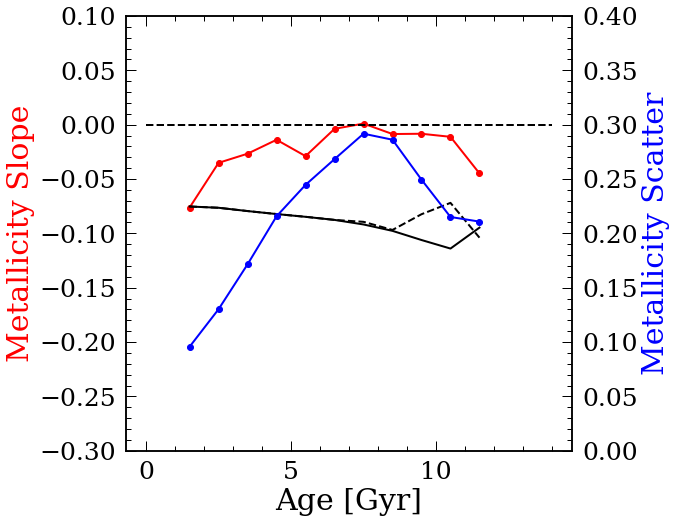

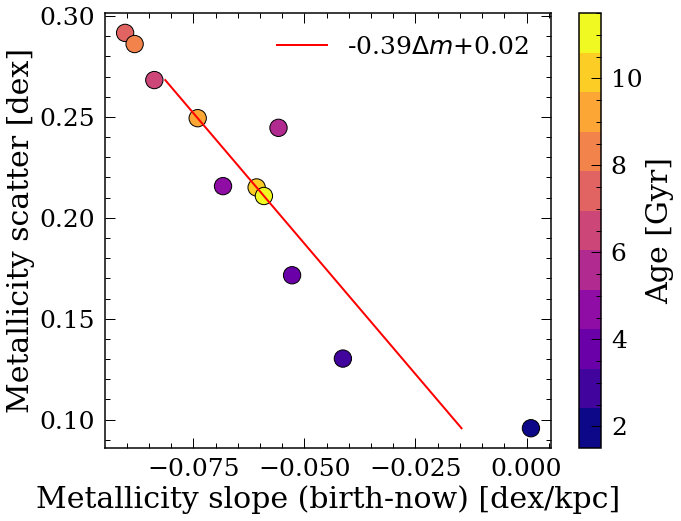

In [1395]:
import warnings
warnings.filterwarnings('ignore')
#sub = sub.loc[sub['AGE_ERR']/sub['AGE']<0.2].reset_index(drop=True)

agebincalc = np.linspace(0,16,17)
m = (abs(sub['Z'])<1)&(sub['AGE_ERR']<np.diff(agebincalc)[0])
m = m&(sub['AGE']>1.5)


xrange = [7.5, 8.5]

ages, slopes, fehscatter = monoage_line(sub['FEH'].values[m], 
                                        sub['R'].values[m], 
                                        sub['AGE'].values[m],
                                        agebin=agebincalc,
                                        xlims=xrange,
                                       feherr=sub['FEH_ERR'].values[m],
                                       plotlegend=False,pltfig=False)

ages, slopes_rbir, fehscatter_rbir = monoage_line(sub['FEH'].values[m], 
                                        sub['Rb'].values[m], 
                                        sub['AGE'].values[m],
                                        agebin=agebincalc,
                                        xlims=[0,15],
                                       feherr=sub['FEH_ERR'].values[m],
                                       plotlegend=False,pltfig=False)



plt.figure(figsize=(8,8))
plt.plot(ages, slopes, 'r-o')
plt.plot(ages, slopes_rbir, 'k-',zorder=5)
plt.xlabel('Age [Gyr]')
plt.ylabel('Metallicity Slope', color='r',zorder=5)
plt.plot([0,14],[0,0], 'k--',zorder=5)
plt.ylim([-0.2, 0.1])

plt.twinx()
plt.plot(ages, fehscatter, 'b-o')
plt.ylim([0.,0.4])
plt.ylabel('Metallicity Scatter', color='b',zorder=5)


df = pd.DataFrame(np.array((ages, slopes, fehscatter, slopes_rbir, fehscatter_rbir)).T,
            columns=['age', 'slopes', 'fehscatter', 'slopes_rbir', 
                     'fehscatter_rbir'])




df = df.dropna(subset=['slopes', 'slopes_rbir', 'fehscatter']).reset_index(drop=True)

df['slopes_rbir'] = df['slopes_rbir']-offsetfac
m2 = (df['age']<7)


plt.figure(figsize=(10,8))
plt.scatter(df['slopes_rbir']-df['slopes'], df['fehscatter'], 
           c=df['age'], s=300, edgecolor='k', 
            cmap=plt.get_cmap('plasma', len(df)))
p = fitpoints(df['fehscatter'][m2], (df['slopes_rbir']-df['slopes'])[m2])
plt.xlabel('Metallicity slope (birth-now) [dex/kpc]')
plt.ylabel('Metallicity scatter [dex]')
plt.plot(p((df['fehscatter']))[m2],
         (df['fehscatter'])[m2], 'r-', 
         label="%.2f$Δm$+%.2f"%(p[1],p[0]))

slope_rbir_infer = np.zeros(len(df))
slope_rbir_infer[~m2] = p((df['fehscatter'][~m2]))+df['slopes'][~m2]
slope_rbir_infer[m2] = df['slopes_rbir'][m2]

df['slope_rbir_infer'] = slope_rbir_infer

cb = plt.colorbar()
cb.set_label('Age [Gyr]')
plt.legend()





plt.figure(figsize=(8,8))
plt.plot(ages, slopes, 'r-o')
plt.plot(ages, slopes_rbir, 'k-',zorder=5)
plt.plot(df['age'], df['slope_rbir_infer'], 'k--',zorder=5)
plt.xlabel('Age [Gyr]')
plt.ylabel('Metallicity Slope', color='r',zorder=5)
plt.plot([0,14],[0,0], 'k--',zorder=5)
plt.ylim([-0.3, 0.1])

plt.twinx()
plt.plot(ages, fehscatter, 'b-o')
plt.ylim([0.,0.4])
plt.ylabel('Metallicity Scatter', color='b',zorder=5)




plt.figure(figsize=(10,8))
plt.scatter(df['slope_rbir_infer']-df['slopes'], df['fehscatter'], 
           c=df['age'], s=300, edgecolor='k', 
            cmap=plt.get_cmap('plasma', len(df)))
m2 = (df['age']<agefit)

p = fitpoints(df['fehscatter'][m2], (df['slope_rbir_infer']-df['slopes'])[m2])

plt.xlabel('Metallicity slope (birth-now) [dex/kpc]')
plt.ylabel('Metallicity scatter [dex]')
plt.plot(p((df['fehscatter']))[m2],
         (df['fehscatter'])[m2], 'r-', 
         label="%.2f$Δm$+%.2f"%(p[1],p[0]))

#df['slope_rbir_infer'] = p((df['fehscatter']))+df['slopes']

cb = plt.colorbar()
cb.set_label('Age [Gyr]')
plt.legend()


### with error

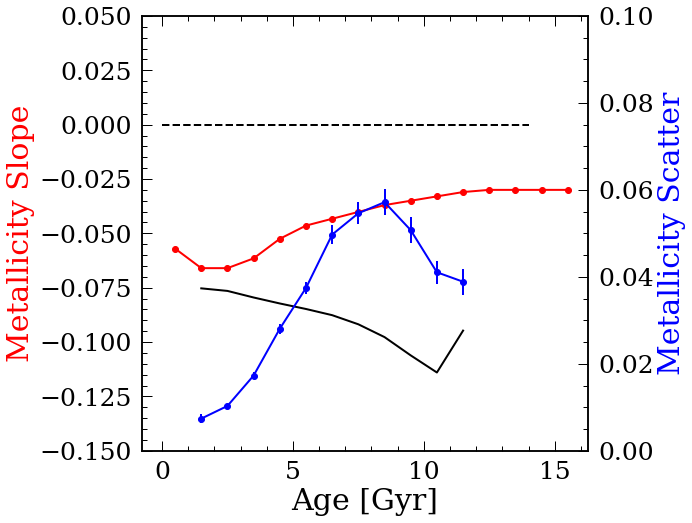

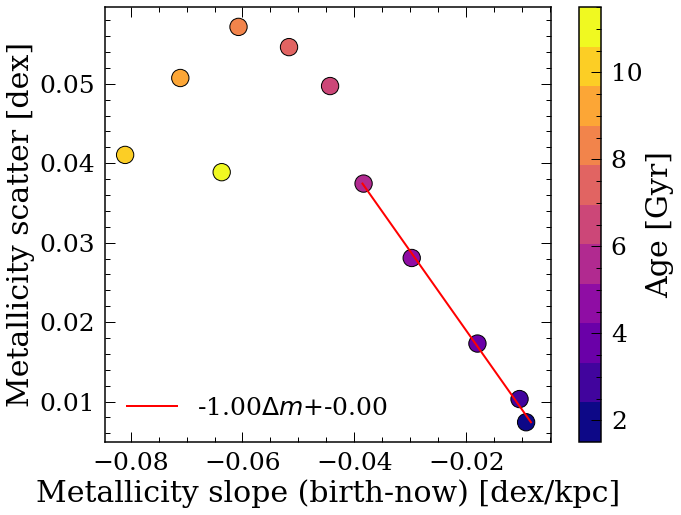

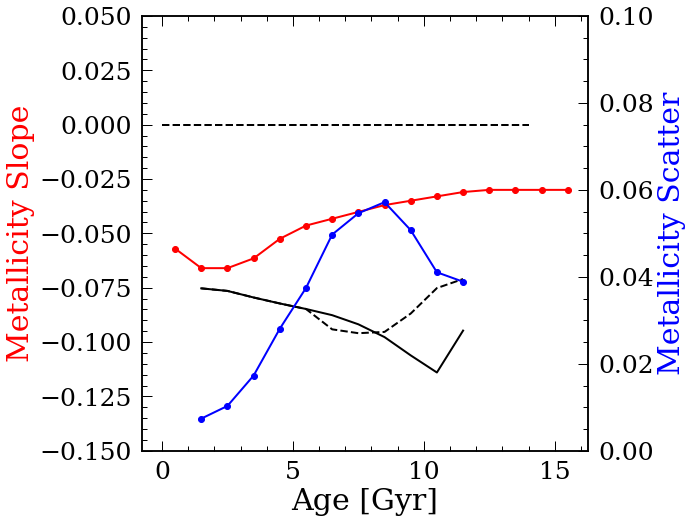

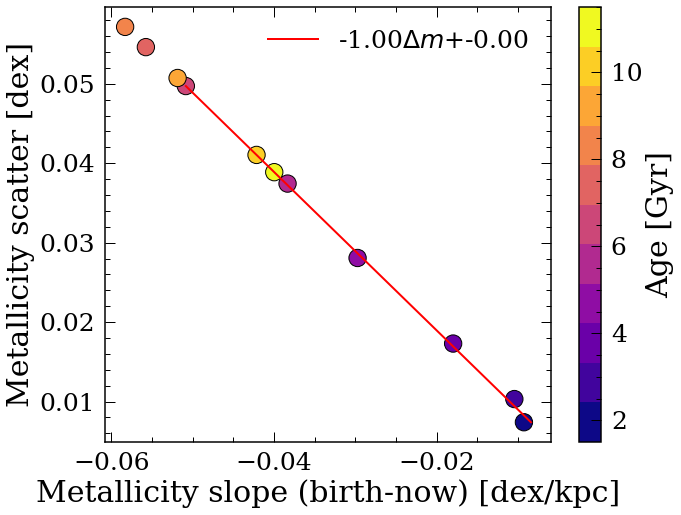

In [1478]:


df = pd.read_csv('Xiang_selslope.csv')
ages, slopes, fehscatter = df['age'].values,df['slopes'].values,df['fehscatter'].values
slopes_err, fehscatter_err = df['slopes_err'], df['fehscatter_err']

age_and = [0.5, 1.5, 3, 5, 8.5, 12, 16]
slopes_and = [-0.057, -0.066, -0.066, -0.048, -0.037, -0.03, -0.03]

slopes_fit = interp1d(age_and, slopes_and)
slopes = slopes_fit(ages)
slopes_err = np.zeros(len(ages))

offsetfac = 0.0
plt.figure(figsize=(8,8))
plt.errorbar(ages, slopes, yerr=slopes_err, fmt='r-o')
plt.plot(ages, slopes_rbir-offsetfac, 'k-',zorder=5)
plt.xlabel('Age [Gyr]')
plt.ylabel('Metallicity Slope', color='r',zorder=5)
plt.plot([0,14],[0,0], 'k--',zorder=5)
plt.ylim([-0.15, 0.05])

plt.twinx()
plt.errorbar(ages, fehscatter, yerr=fehscatter_err, fmt='b-o')
plt.ylim([0.,0.1])
plt.ylabel('Metallicity Scatter', color='b',zorder=5)


df = pd.DataFrame(np.array((ages, slopes, fehscatter, slopes_rbir, fehscatter_rbir)).T,
            columns=['age', 'slopes', 'fehscatter', 'slopes_rbir', 
                     'fehscatter_rbir'])




df = df.dropna(subset=['slopes', 'slopes_rbir', 'fehscatter']).reset_index(drop=True)

df['slopes_rbir'] = df['slopes_rbir']-offsetfac
m2 = (df['age']<6)

plt.figure(figsize=(10,8))
plt.scatter(df['slopes_rbir']-df['slopes'], df['fehscatter'], 
           c=df['age'], s=300, edgecolor='k', 
            cmap=plt.get_cmap('plasma', len(df)))
p = fitpoints(df['fehscatter'][m2], (df['slopes_rbir']-df['slopes'])[m2])
plt.xlabel('Metallicity slope (birth-now) [dex/kpc]')
plt.ylabel('Metallicity scatter [dex]')
plt.plot(p((df['fehscatter']))[m2],
         (df['fehscatter'])[m2], 'r-', 
         label="%.2f$Δm$+%.2f"%(p[1],p[0]))

slope_rbir_infer = np.zeros(len(df))
slope_rbir_infer[~m2] = p((df['fehscatter'][~m2]))+df['slopes'][~m2]
slope_rbir_infer[m2] = df['slopes_rbir'][m2]

df['slope_rbir_infer'] = slope_rbir_infer

cb = plt.colorbar()
cb.set_label('Age [Gyr]')
plt.legend()





plt.figure(figsize=(8,8))
plt.plot(ages, slopes, 'r-o')
plt.plot(ages, slopes_rbir, 'k-',zorder=5)
plt.plot(df['age'], df['slope_rbir_infer'], 'k--',zorder=5)
plt.xlabel('Age [Gyr]')
plt.ylabel('Metallicity Slope', color='r',zorder=5)
plt.plot([0,14],[0,0], 'k--',zorder=5)
plt.ylim([-0.15, 0.05])

plt.twinx()
plt.plot(ages, fehscatter, 'b-o')
plt.ylim([0.,0.1])
plt.ylabel('Metallicity Scatter', color='b',zorder=5)




plt.figure(figsize=(10,8))
plt.scatter(df['slope_rbir_infer']-df['slopes'], df['fehscatter'], 
           c=df['age'], s=300, edgecolor='k', 
            cmap=plt.get_cmap('plasma', len(df)))
m2 = (df['age']<agefit)

p = fitpoints(df['fehscatter'][m2], (df['slope_rbir_infer']-df['slopes'])[m2])

plt.xlabel('Metallicity slope (birth-now) [dex/kpc]')
plt.ylabel('Metallicity scatter [dex]')
plt.plot(p((df['fehscatter']))[m2],
         (df['fehscatter'])[m2], 'r-', 
         label="%.2f$Δm$+%.2f"%(p[1],p[0]))

#df['slope_rbir_infer'] = p((df['fehscatter']))+df['slopes']

cb = plt.colorbar()
cb.set_label('Age [Gyr]')
plt.legend()

### Kordopatis sample

In [1222]:
"""ages, slopes_rbir, fehscatter_rbir = monoage_line(sub['FEH'].values[m], 
                                        sub['Rb'].values[m], 
                                        sub['AGE'].values[m],
                                        agebin=np.linspace(0,14,15),
                                        xlims=[0,15],
                                       feherr=sub['FEH_ERR'].values[m],
                                       plotlegend=False)

df = pd.read_csv('Kordopatis.csv')
ages, slopes, fehscatter = df['age'].values,df['slopes'].values,df['fehscatter'].values

offsetfac = 0.0
plt.figure(figsize=(8,8))
plt.plot(ages, slopes, 'r-o')
plt.plot(ages, slopes_rbir-offsetfac, 'k-',zorder=5)
plt.xlabel('Age [Gyr]')
plt.ylabel('Metallicity Slope', color='r',zorder=5)
plt.plot([0,14],[0,0], 'k--',zorder=5)
plt.ylim([-0.2, 0.05])

plt.twinx()
plt.plot(ages, fehscatter, 'b-o')
plt.ylim([0.,0.1])
plt.ylabel('Metallicity Scatter', color='b',zorder=5)


df = pd.DataFrame(np.array((ages, slopes, fehscatter, slopes_rbir, fehscatter_rbir)).T,
            columns=['age', 'slopes', 'fehscatter', 'slopes_rbir', 
                     'fehscatter_rbir'])




df = df.dropna(subset=['slopes', 'slopes_rbir', 'fehscatter']).reset_index(drop=True)

df['slopes_rbir'] = df['slopes_rbir']-offsetfac
m2 = (df['age']<4)


plt.figure(figsize=(10,8))
plt.scatter(df['slopes_rbir']-df['slopes'], df['fehscatter'], 
           c=df['age'], s=300, edgecolor='k', 
            cmap=plt.get_cmap('plasma', len(df)))
p = fitpoints(df['fehscatter'][m2], (df['slopes_rbir']-df['slopes'])[m2])
plt.xlabel('Metallicity slope (birth-now) [dex/kpc]')
plt.ylabel('Metallicity scatter [dex]')
plt.plot(p((df['fehscatter']))[m2],
         (df['fehscatter'])[m2], 'r-', 
         label="%.2f$Δm$+%.2f"%(p[1],p[0]))

df['slope_rbir_infer'] = p((df['fehscatter']))+df['slopes']

cb = plt.colorbar()
cb.set_label('Age [Gyr]')
plt.legend()





plt.figure(figsize=(8,8))
plt.plot(ages, slopes, 'r-o')
plt.plot(ages, slopes_rbir-offsetfac, 'k-',zorder=5)
plt.plot(ages, p(fehscatter)+slopes, 'k--',zorder=5)
plt.xlabel('Age [Gyr]')
plt.ylabel('Metallicity Slope', color='r',zorder=5)
plt.plot([0,14],[0,0], 'k--',zorder=5)
plt.ylim([-0.3, 0.1])

plt.twinx()
plt.plot(ages, fehscatter, 'b-o')
plt.ylim([0.,0.05])
plt.ylabel('Metallicity Scatter', color='b',zorder=5)




plt.figure(figsize=(10,8))
plt.scatter(df['slope_rbir_infer']-df['slopes'], df['fehscatter'], 
           c=df['age'], s=300, edgecolor='k', 
            cmap=plt.get_cmap('plasma', len(df)))
m2 = (df['age']<agefit)

p = fitpoints(df['fehscatter'][m2], (df['slope_rbir_infer']-df['slopes'])[m2])

plt.xlabel('Metallicity slope (birth-now) [dex/kpc]')
plt.ylabel('Metallicity scatter [dex]')
plt.plot(p((df['fehscatter']))[m2],
         (df['fehscatter'])[m2], 'r-', 
         label="%.2f$Δm$+%.2f"%(p[1],p[0]))

#df['slope_rbir_infer'] = p((df['fehscatter']))+df['slopes']

cb = plt.colorbar()
cb.set_label('Age [Gyr]')
plt.legend()"""

'ages, slopes_rbir, fehscatter_rbir = monoage_line(sub[\'FEH\'].values[m], \n                                        sub[\'Rb\'].values[m], \n                                        sub[\'AGE\'].values[m],\n                                        agebin=np.linspace(0,14,15),\n                                        xlims=[0,15],\n                                       feherr=sub[\'FEH_ERR\'].values[m],\n                                       plotlegend=False)\n\ndf = pd.read_csv(\'Kordopatis.csv\')\nages, slopes, fehscatter = df[\'age\'].values,df[\'slopes\'].values,df[\'fehscatter\'].values\n\noffsetfac = 0.0\nplt.figure(figsize=(8,8))\nplt.plot(ages, slopes, \'r-o\')\nplt.plot(ages, slopes_rbir-offsetfac, \'k-\',zorder=5)\nplt.xlabel(\'Age [Gyr]\')\nplt.ylabel(\'Metallicity Slope\', color=\'r\',zorder=5)\nplt.plot([0,14],[0,0], \'k--\',zorder=5)\nplt.ylim([-0.2, 0.05])\n\nplt.twinx()\nplt.plot(ages, fehscatter, \'b-o\')\nplt.ylim([0.,0.1])\nplt.ylabel(\'Metallicity Scatter\', color=\

In [1154]:
#p(fehscatter)+slopes

# use inferred slope to get Rbir


In [1464]:
# get Fe/H in solar neiborhood
agebins = np.linspace(0,16,17)
fehave = np.zeros(len(agebins)-1)
fehave_age = np.zeros(len(agebins)-1)
for i in range(len(agebins)-1):
    sub_sing = sub.loc[(sub['AGE']>agebins[i])&(sub['AGE']<agebins[i+1])]
    sub_sing = sub_sing.loc[abs(sub_sing['Rb']-8.2)<0.5]
    fehave[i] = np.median(sub_sing['FEH'].dropna())
fehave_age = (agebins[1:]+agebins[:-1])/2
    
    
fehevl = pd.read_table('feh_t_sol.txt', delim_whitespace=True,
                      names=['0','1'])
fehave_age, fehave = fehevl['0'].values, fehevl['1'].values


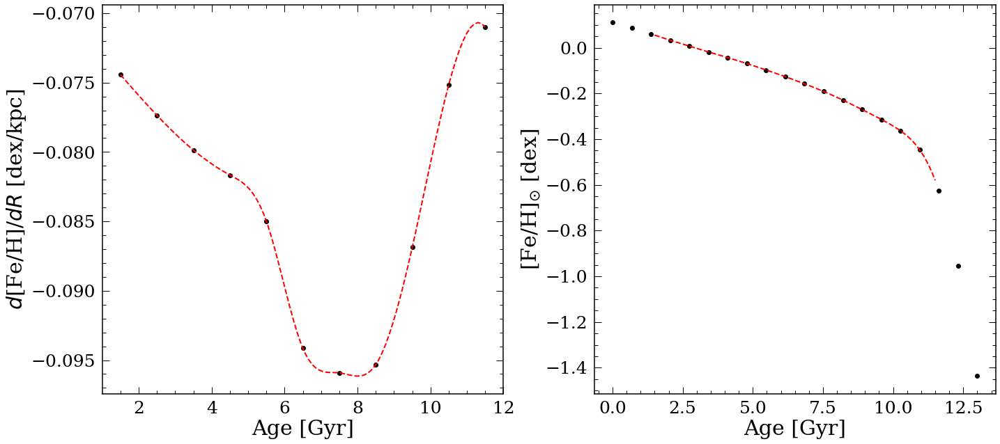

In [1465]:
from scipy.interpolate import interp1d

mfit = (df['slope_rbir_infer']==df['slope_rbir_infer'])
slope_inf = interp1d(df['age'][mfit], df['slope_rbir_infer'][mfit], 
                     kind='cubic')

plt.figure(figsize=(20,9))
plt.subplot(1,2,1)
plt.plot(df['age'][mfit], df['slope_rbir_infer'][mfit], 'ko')
plt.plot(np.linspace(1.5,11.5,100), slope_inf(np.linspace(1.5,11.5,100)), 'r--')
plt.xlabel('Age [Gyr]')
plt.ylabel('$d$[Fe/H]/$dR$ [dex/kpc]')

mfit = (fehave==fehave)
ave_inf = interp1d(fehave_age[mfit], 
                   fehave[mfit], kind='cubic')
plt.subplot(1,2,2)
plt.plot(fehave_age, fehave, 'ko')
plt.plot(np.linspace(1.5,11.5,100), ave_inf(np.linspace(1.5,11.5,100)), 'r--')
plt.xlabel('Age [Gyr]')
plt.ylabel('[Fe/H]$_{\odot}$ [dex]')

plt.tight_layout()

In [1466]:
def getRb(age, feh, func_m, func_b):
    Rb = np.zeros(len(age))
    for i in trange(len(age)):
        m = func_m(age[i])
        b = func_b(age[i])
        y = m*8.2
        b = b-y
        
        Rb[i] = (feh[i]-b)/m
    return Rb
        

    

In [1475]:
sub_tryRb = sub.loc[(sub['AGE']>1.5)&(sub['AGE']<11.5)].reset_index(drop=True)
#sub_tryRb = sub_tryRb.loc[abs(sub_tryRb['R']-8.2)<0.2].reset_index(drop=True)
sub_tryRb['Rb_new'] = getRb(sub_tryRb['AGE'].values, sub_tryRb['FEH'].values, slope_inf, ave_inf)


100%|██████████| 190336/190336 [00:09<00:00, 19430.30it/s]


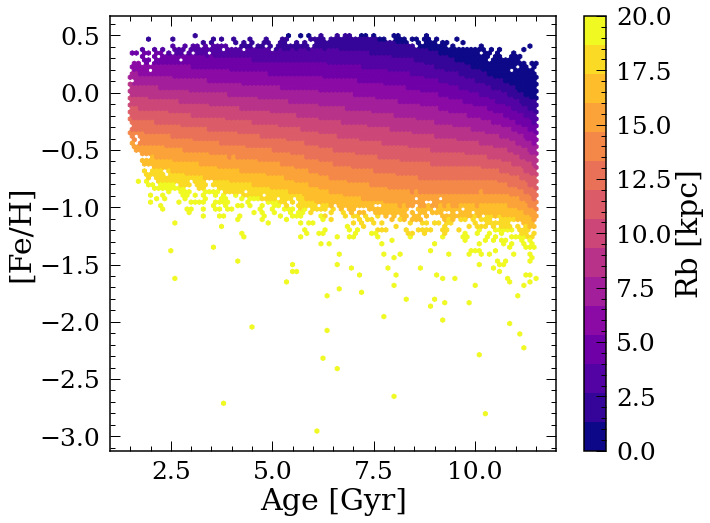

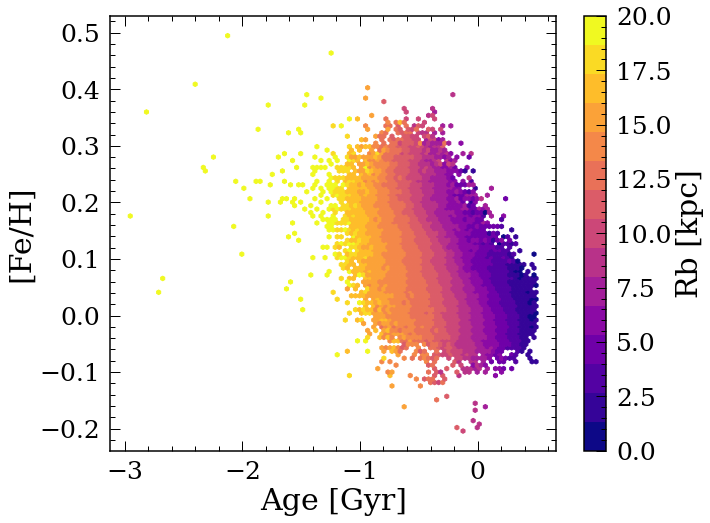

In [1476]:
plt.figure(figsize=(10,8))
plt.hexbin(sub_tryRb['AGE'], sub_tryRb['FEH'], C=sub_tryRb['Rb_new'], 
          vmin=0, vmax=20, cmap=plt.get_cmap('plasma',15))
plt.xlabel('Age [Gyr]')
plt.ylabel('[Fe/H]')
cb = plt.colorbar()
cb.set_label('Rb [kpc]')


plt.figure(figsize=(10,8))
plt.hexbin(sub_tryRb['FEH'], sub_tryRb['ALPHA_FE'], C=sub_tryRb['Rb_new'], 
          vmin=0, vmax=20, cmap=plt.get_cmap('plasma',15))
plt.xlabel('Age [Gyr]')
plt.ylabel('[Fe/H]')
cb = plt.colorbar()
cb.set_label('Rb [kpc]')



0.0009006304413089162


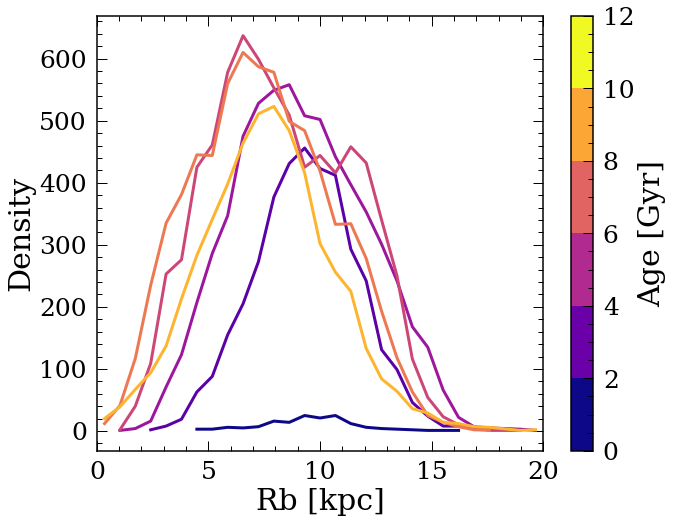

In [1474]:
agebin_Rb = np.linspace(0,12,7)
agebin_colors = getcolor(agebin_Rb)
plt.figure(figsize=(10,8))
#plt.hist(sub_tryRb['Rb'], color='k', alpha=0.2, bins=np.linspace(0,20,100))
for i in range(len(agebin_Rb)-1):
    sub_sing = sub_tryRb.loc[(sub_tryRb['AGE']>agebin_Rb[i])&(sub_tryRb['AGE']<agebin_Rb[i+1])]
    fre, edg = np.histogram(sub_sing['Rb_new'], bins=np.linspace(0,20,30), density=False)
    
    m = (fre!=0)
    plt.plot((edg[1:]+edg[:-1])[m]/2, fre[m], color=agebin_colors[i], linewidth=3)
    
    """plt.vlines(np.mean(sub_sing['Rb_new']), ymin=0, ymax=800, color=agebin_colors[i],
              linewidth=3)"""
#plt.vlines(8.2, ymin=0, ymax=900, color='k')
plt.scatter(100,0,c=5,vmin=min(agebin_Rb),vmax=max(agebin_Rb),
           cmap=plt.get_cmap('plasma', len(agebin_Rb)-1))
plt.xlim([0,20])
plt.xlabel('Rb [kpc]')
plt.ylabel('Density')
cb = plt.colorbar()
cb.set_label('Age [Gyr]')

print(sum(sub_tryRb['Rb_new']<0)/len(sub_tryRb['Rb_new']))


In [1413]:

sub_tryRb = sub_tryRb.loc[abs(sub_tryRb['Z'])<1].reset_index(drop=True)
ages, rs, avrs_z = avr( sub_tryRb['Rb_new'].values, sub_tryRb['AGE'].values,
                       sub_tryRb['VZ'].values, 
                     rbin=np.linspace(2,12,7), agebin=np.linspace(2,20,15))

ages, rs, avrs_phi = avr(sub_tryRb['Rb_new'].values, sub_tryRb['AGE'].values,
                         sub_tryRb['VT'].values, 
                     rbin=np.linspace(2,12,7), agebin=np.linspace(2,20,15))

ages, rs, avrs_r = avr(sub_tryRb['Rb_new'].values, sub_tryRb['AGE'].values,
                       sub_tryRb['VR'].values, 
                     rbin=np.linspace(2,12,7), agebin=np.linspace(2,20,15))


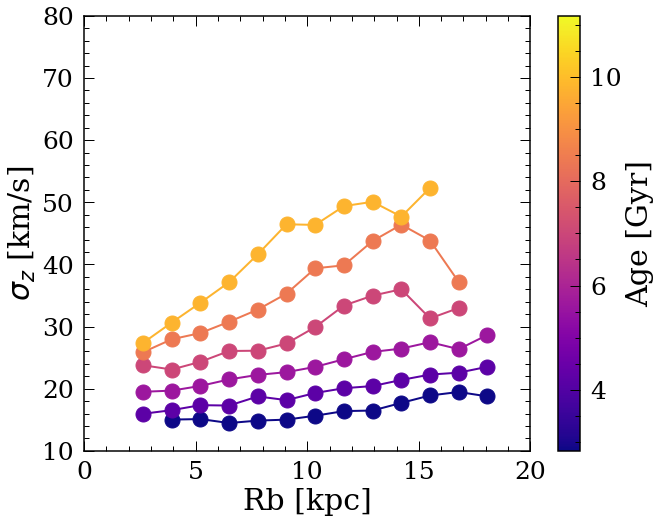

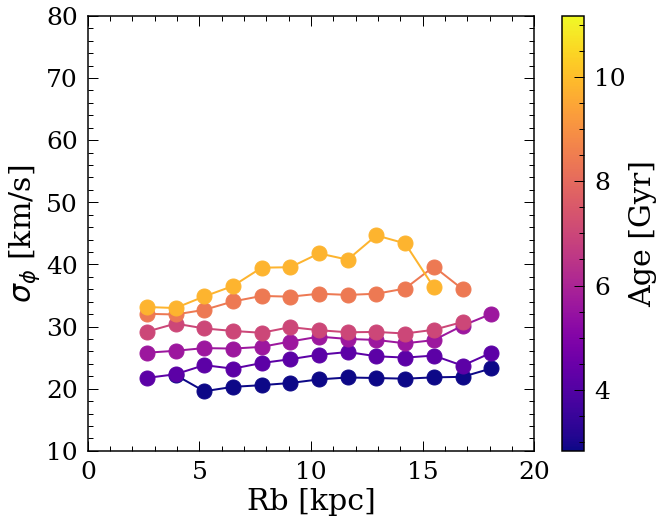

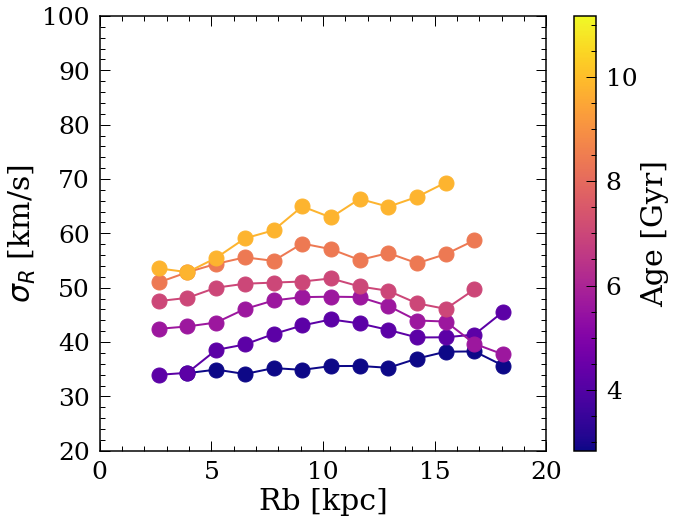

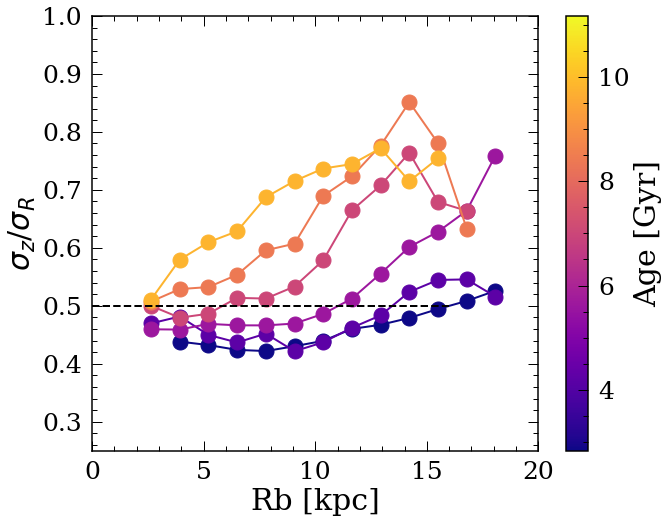

In [1414]:

colors = getcolor(np.linspace(2,12,7))

plt.figure(figsize=(10,8))
for i in range(len(rs)):
    plt.plot(ages, avrs_z[i,:], 'o-', color=colors[i], label='Age = %.2f Gyr'%rs[i],
            markersize=15)
    plt.xlabel('Rb [kpc]')
    plt.ylabel('$σ_z$ [km/s]')
plt.scatter(-100, -100, c=1, vmin=min(rs), vmax=max(rs), cmap='plasma')
plt.ylim([10, 80])
plt.xlim([0,20])
cb = plt.colorbar()
cb.set_label('Age [Gyr]')
#plt.legend()



plt.figure(figsize=(10,8))
for i in range(len(rs)):
    plt.plot(ages, avrs_phi[i,:], 'o-', color=colors[i], label='Age = %.2f Gyr'%rs[i],
            markersize=15)
    plt.xlabel('Rb [kpc]')
    plt.ylabel('$σ_ϕ$ [km/s]')
plt.ylim([10, 80])
plt.xlim([0,20])
plt.scatter(-100, -100, c=1, vmin=min(rs), vmax=max(rs), cmap='plasma')
cb = plt.colorbar()
cb.set_label('Age [Gyr]')
#plt.legend()



plt.figure(figsize=(10,8))
for i in range(len(rs)):
    plt.plot(ages, avrs_r[i,:], 'o-', color=colors[i], label='Age = %.2f Gyr'%rs[i],
            markersize=15)
    plt.xlabel('Rb [kpc]')
    plt.ylabel('$σ_R$ [km/s]')
plt.ylim([20, 100])
plt.xlim([0,20])
plt.scatter(-100, -100, c=1, vmin=min(rs), vmax=max(rs), cmap='plasma')
cb = plt.colorbar()
cb.set_label('Age [Gyr]')
#plt.legend()



plt.figure(figsize=(10,8))
for i in range(len(rs)):
    plt.plot(ages, avrs_z[i,:]/avrs_r[i,:], 'o-', color=colors[i], label='Age = %.2f Gyr'%rs[i],
            markersize=15)
    plt.xlabel('Rb [kpc]')
    plt.ylabel('$σ_z$/$σ_R$')
plt.ylim([0.25, 1])
plt.xlim([0,20])
plt.scatter(-100, -100, c=1, vmin=min(rs), vmax=max(rs), cmap='plasma')
cb = plt.colorbar()
cb.set_label('Age [Gyr]')
#plt.legend()

plt.plot([0,16], [0.5,0.5], 'k--')




(0.0, 5.0)

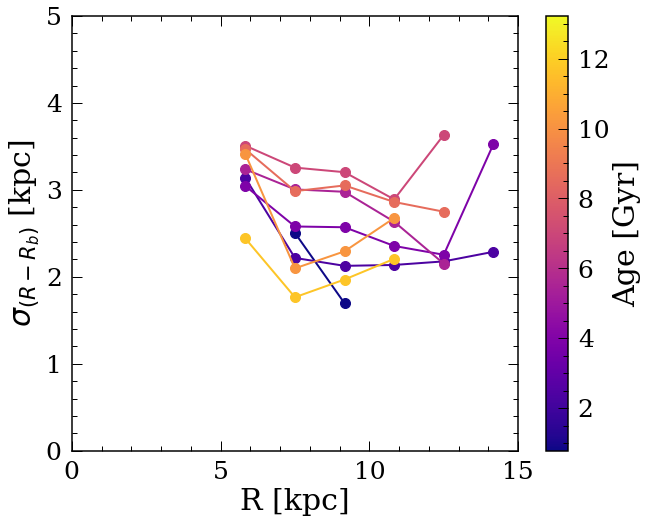

In [1415]:
agebincalc = np.linspace(0,14,10)
m = (abs(sub_tryRb['Z'])<0.5)
m = (abs(sub_tryRb['Z'])<1)&(sub_tryRb['AGE_ERR']<np.diff(agebincalc)[0])
m = m&(sub_tryRb['AGE']>1.5)

ages, rs, sigmaR = getmigration(sub_tryRb['R'].values[m], 
                                        sub_tryRb['Rb'].values[m], 
                                        sub_tryRb['AGE'].values[m],
                                        agebin=agebincalc,
                                        xlims=[0,15],rbin=10)



colors = getcolor(ages)
plt.figure(figsize=(10,8))
for i in range(len(ages)):
    plt.plot(rs, sigmaR[i,:], '-o', color=colors[i], markersize=10)
plt.scatter(-10,-10,c=0, vmin=min(ages), vmax=max(ages),cmap='plasma')
cb = plt.colorbar()
cb.set_label('Age [Gyr]')
plt.xlabel('R [kpc]')
plt.ylabel('$σ_{(R-R_b)}$ [kpc]')
plt.xlim([0,15])
plt.ylim([0,5])






2085
3076
4081
5371
6545
8100
9654
11194
11563
11797
11908
12136
12368
11817
11070
9801
8185
5913
4190


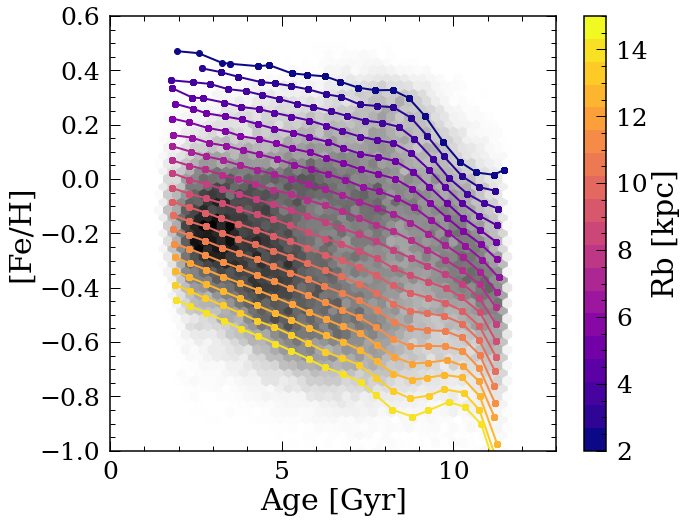

In [1426]:
Rbbin = np.linspace(2,15,20)
color_amr = getcolor(range(len(Rbbin)))

plt.figure(figsize=(10,8))
plt.hexbin(sub_tryRb['AGE'], sub_tryRb['FEH'], cmap='binary',
          extent=(0,13,-1,0.6), gridsize=50, mincnt=1)
for i in range(len(Rbbin)-1):

    m = (sub_tryRb['Rb_new']>Rbbin[i])&(sub_tryRb['Rb_new']<Rbbin[i+1])
    """plt.hexbin(sub['AGE'][m], sub['FEH'][m], extent=(0,18,-2.5,0.5), cmap='jet',
            mincnt=1, gridsize=50)"""
    age_amr_all, feh_amr_all = sub_tryRb['AGE'].values[m], sub_tryRb['FEH'].values[m]
    age_amr_all, feh_amr_all = zip(*sorted(zip(age_amr_all, feh_amr_all)))
    age_amr_all, feh_amr_all = np.array(age_amr_all), np.array(feh_amr_all)
    age_amr, feh_amr = movingMed_time(age_amr_all, feh_amr_all,
                                     0.5,0.5)
    plt.plot(age_amr, feh_amr, '-o', color=color_amr[i])
    plt.xlim([0,13])
    plt.ylim([-1,0.6])
    print(sum(m))
    #plt.title('%.2f kpc < Rb < %.2f kpc'%(Rbbin[i], Rbbin[i+1]), fontsize=25)
plt.scatter(-100,-100, c=0, vmin=min(Rbbin), vmax=max(Rbbin), 
            cmap=plt.get_cmap('plasma', len(Rbbin)-1))
plt.xlabel('Age [Gyr]')
plt.ylabel('[Fe/H]')
cb = plt.colorbar()
cb.set_label('Rb [kpc]')
    




(0.03, 0.06)

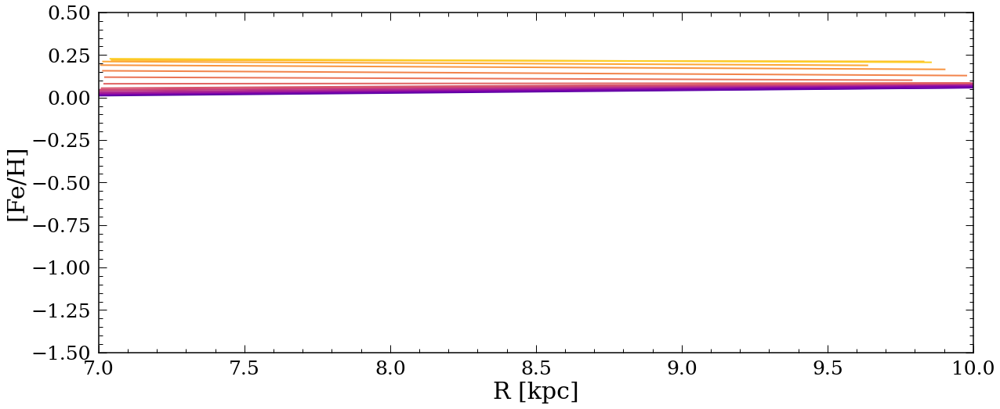

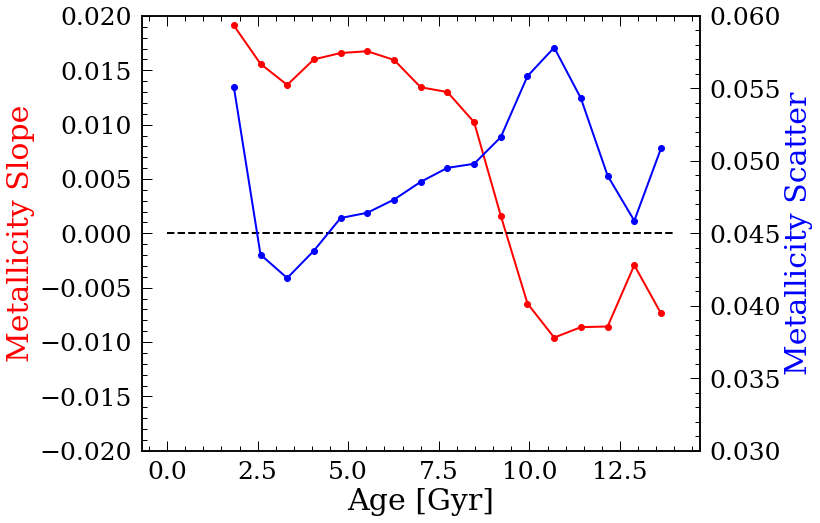

In [640]:
import warnings
warnings.filterwarnings('ignore')
#sub = sub.loc[sub['AGE_ERR']/sub['AGE']<0.2].reset_index(drop=True)

sub = sub.dropna(subset=['ALPHA_FE'])
m = (abs(sub['Z'])<1)&(sub['AGE_ERR']<np.diff(agebincalc)[0])
m = m&(sub['AGE']>1.5)
agebincalc = np.linspace(0,14,20)

ages, slopes, fehscatter = monoage_line(sub['ALPHA_FE'].values[m], 
                                        sub['R'].values[m], 
                                        sub['AGE'].values[m],
                                        agebin=agebincalc,
                                        xlims=[7,10],
                                       plotlegend=False)

plt.figure(figsize=(10,8))
plt.plot(ages, slopes, 'r-o')
plt.xlabel('Age [Gyr]')
plt.ylabel('Metallicity Slope', color='r')
plt.plot([0,14],[0,0], 'k--')
plt.ylim([-0.02, 0.02])

plt.twinx()
plt.plot(ages, fehscatter, 'b-o')
plt.ylabel('Metallicity Scatter', color='b')
plt.ylim([0.03, 0.06])



244434


array([[<AxesSubplot:title={'center':'VZ'}>,
        <AxesSubplot:title={'center':'VT'}>],
       [<AxesSubplot:title={'center':'VR'}>, <AxesSubplot:>]],
      dtype=object)

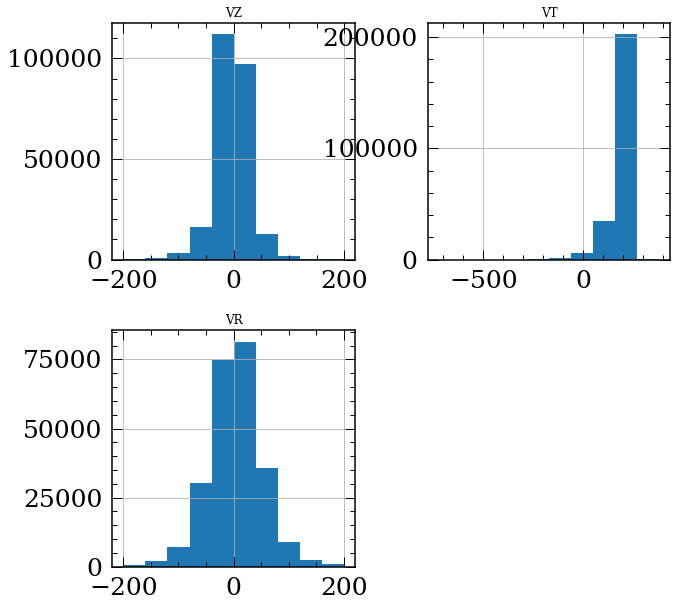

In [641]:
from astropy.table import Table
sub = Table.read('subgiant_fullparam_update.fits', format='fits')
sub = sub.to_pandas()
agebincalc = np.linspace(0,16,10)
#sub = sub.loc[sub['AGE_ERR']/sub['AGE']<0.2].reset_index(drop=True)
m = (sub['AGE']>1.5)&(sub['AGE_ERR']<np.diff(agebincalc)[0])
sub = sub.loc[abs(sub['VZ'])<200]
sub = sub.loc[abs(sub['VR'])<200]
sub = sub.loc[abs(sub['VT'])<1000].reset_index(drop=True)
print(len(sub))
sub[['VZ','VT','VR']].hist()

In [270]:
sub['Rmean'] = (sub['R_PERI']+sub['R_APO'])/2
sub = sub.loc[abs(sub['Z'])<1].reset_index(drop=True)
ages, rs, avrs_z = avr(sub['AGE'].values, sub['R'].values, sub['VZ'].values, 
                     rbin=np.linspace(6,10,5), agebin=agebincalc)

ages, rs, avrs_phi = avr(sub['AGE'].values, sub['R'].values, sub['VT'].values, 
                     rbin=np.linspace(6,10,5), agebin=agebincalc)

ages, rs, avrs_r = avr(sub['AGE'].values, sub['R'].values, sub['VR'].values, 
                     rbin=np.linspace(6,10,5), agebin=agebincalc)

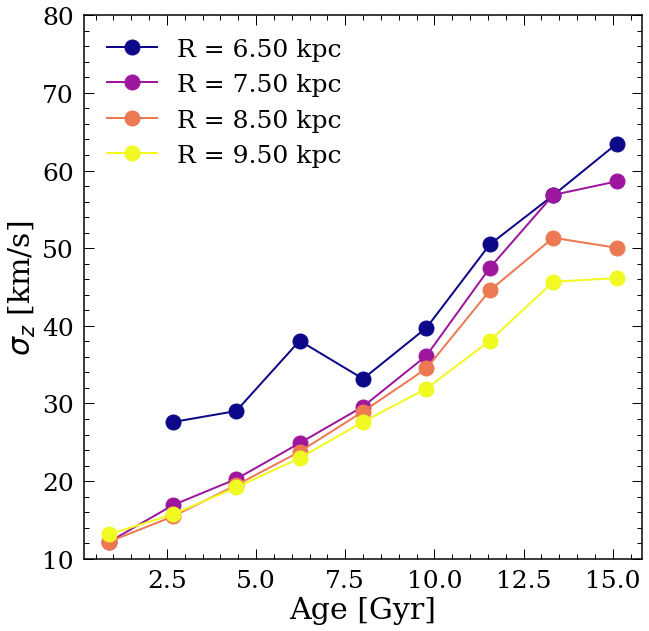

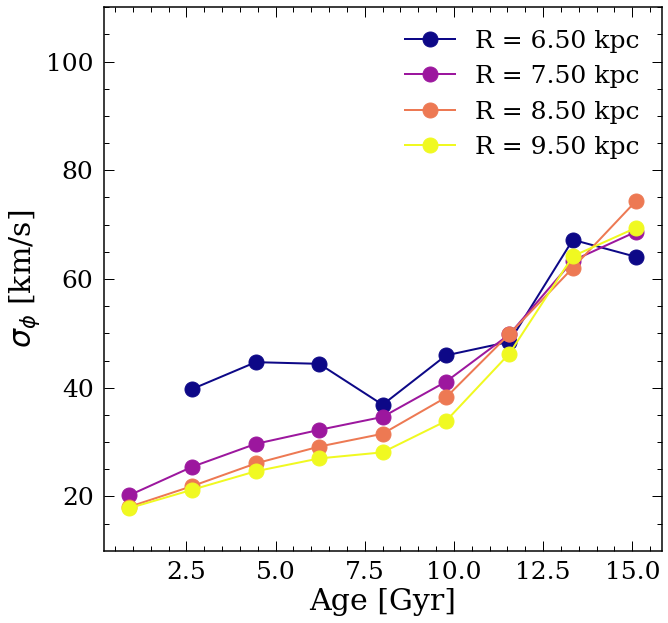

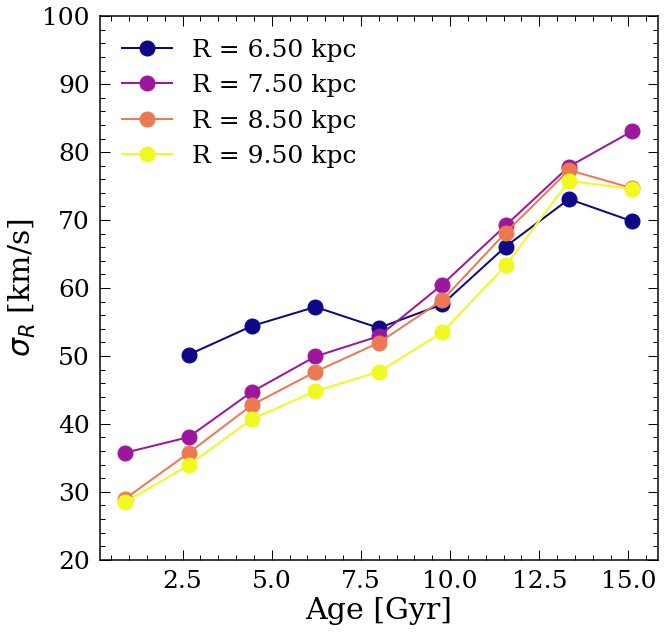

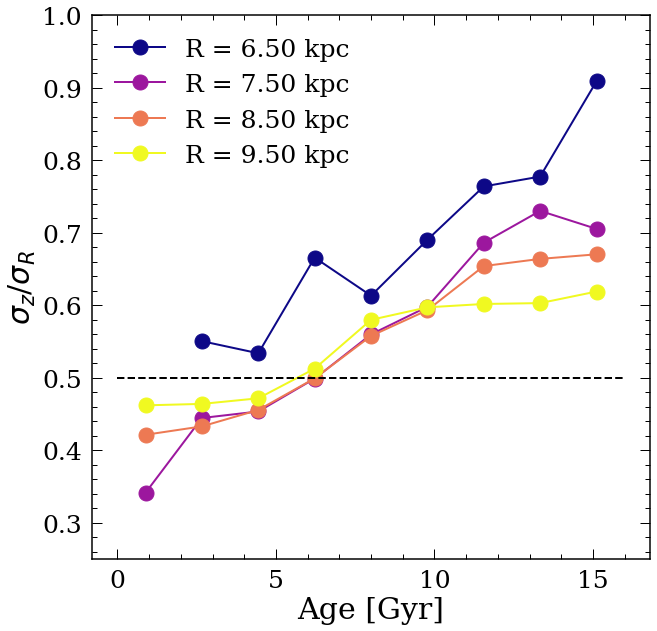

In [274]:

colors = getcolor(rs)

plt.figure()
for i in range(len(rs)):
    plt.plot(ages, avrs_z[i,:], 'o-', color=colors[i], label='R = %.2f kpc'%rs[i],
            markersize=15)
    plt.xlabel('Age [Gyr]')
    plt.ylabel('$σ_z$ [km/s]')
plt.ylim([10, 80])
plt.legend()



plt.figure()
for i in range(len(rs)):
    plt.plot(ages, avrs_phi[i,:], 'o-', color=colors[i], label='R = %.2f kpc'%rs[i],
            markersize=15)
    plt.xlabel('Age [Gyr]')
    plt.ylabel('$σ_ϕ$ [km/s]')
plt.ylim([10, 110])
plt.legend()



plt.figure()
for i in range(len(rs)):
    plt.plot(ages, avrs_r[i,:], 'o-', color=colors[i], label='R = %.2f kpc'%rs[i],
            markersize=15)
    plt.xlabel('Age [Gyr]')
    plt.ylabel('$σ_R$ [km/s]')
plt.ylim([20, 100])
plt.legend()



plt.figure()
for i in range(len(rs)):
    plt.plot(ages, avrs_z[i,:]/avrs_r[i,:], 'o-', color=colors[i], label='R = %.2f kpc'%rs[i],
            markersize=15)
    plt.xlabel('Age [Gyr]')
    plt.ylabel('$σ_z$/$σ_R$')
plt.legend()
plt.ylim([0.25, 1])

plt.plot([0,16], [0.5,0.5], 'k--')




In [275]:
#sub['Rmean'] = (sub['R_PERI']+sub['R_APO'])/2

ages, rs, avrs_z = avr(sub['AGE'].values, sub['R_GUIDING'].values, sub['VZ'].values, 
                     rbin=np.linspace(6,10,5), agebin=agebincalc)

ages, rs, avrs_phi = avr(sub['AGE'].values, sub['R_GUIDING'].values, sub['VT'].values, 
                     rbin=np.linspace(6,10,5), agebin=agebincalc)

ages, rs, avrs_r = avr(sub['AGE'].values, sub['R_GUIDING'].values, sub['VR'].values, 
                     rbin=np.linspace(6,10,5), agebin=agebincalc)

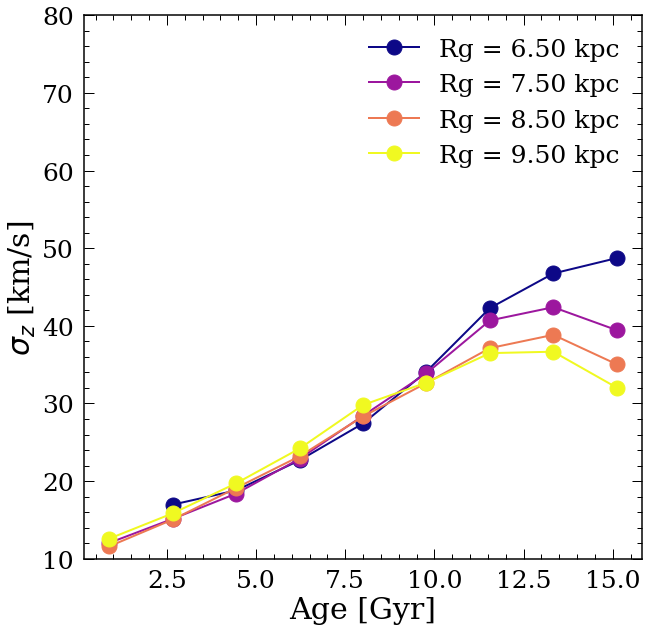

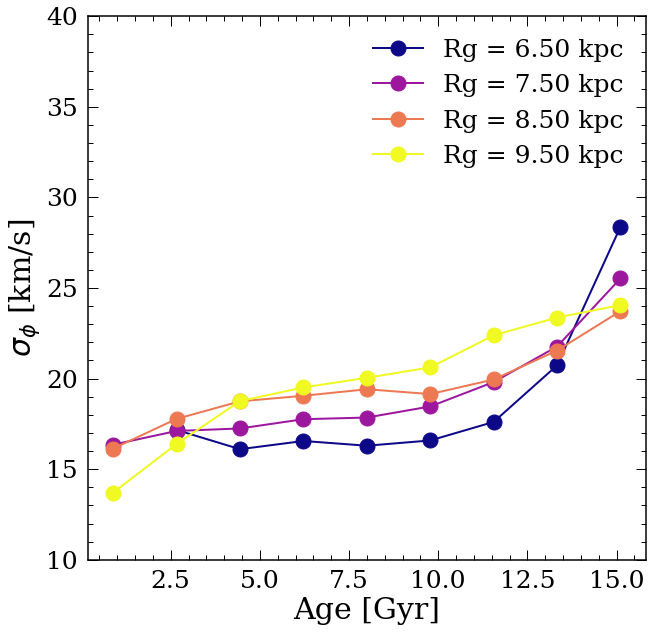

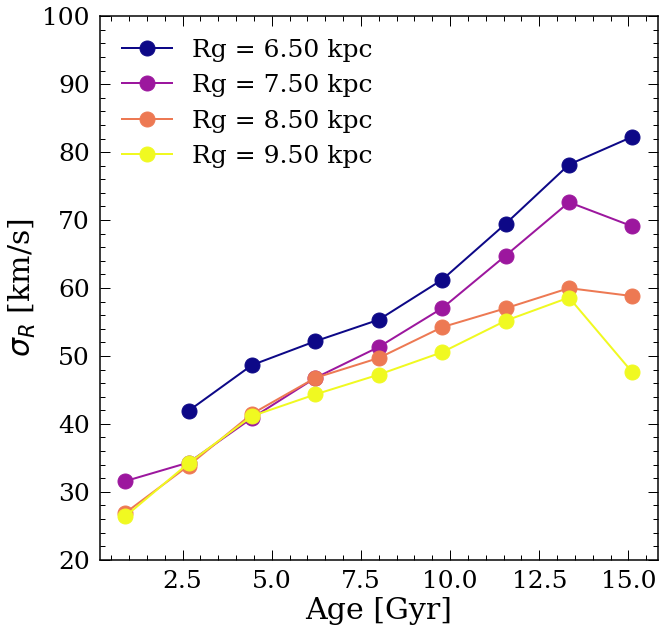

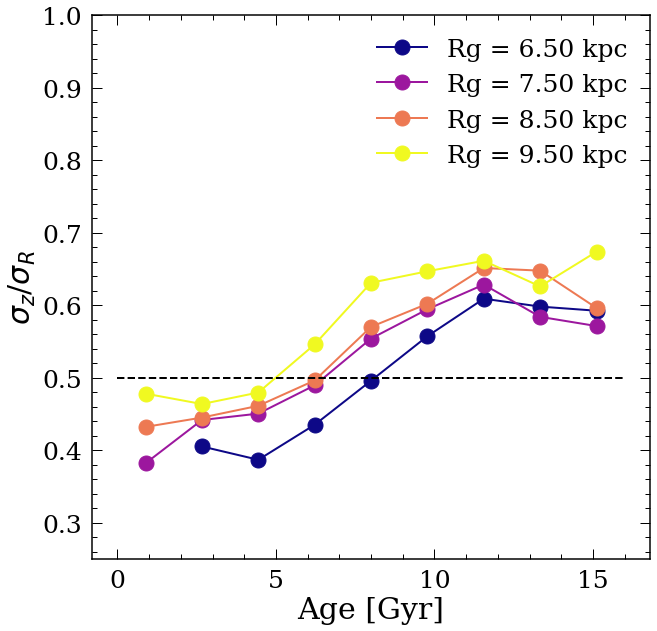

In [277]:

colors = getcolor(rs)

plt.figure()
for i in range(len(rs)):
    plt.plot(ages, avrs_z[i,:], 'o-', color=colors[i], label='Rg = %.2f kpc'%rs[i],
            markersize=15)
    plt.xlabel('Age [Gyr]')
    plt.ylabel('$σ_z$ [km/s]')
plt.ylim([10, 80])
plt.legend()



plt.figure()
for i in range(len(rs)):
    plt.plot(ages, avrs_phi[i,:], 'o-', color=colors[i], label='Rg = %.2f kpc'%rs[i],
            markersize=15)
    plt.xlabel('Age [Gyr]')
    plt.ylabel('$σ_ϕ$ [km/s]')
plt.ylim([10, 40])
plt.legend()



plt.figure()
for i in range(len(rs)):
    plt.plot(ages, avrs_r[i,:], 'o-', color=colors[i], label='Rg = %.2f kpc'%rs[i],
            markersize=15)
    plt.xlabel('Age [Gyr]')
    plt.ylabel('$σ_R$ [km/s]')
plt.ylim([20, 100])
plt.legend()



plt.figure()
for i in range(len(rs)):
    plt.plot(ages, avrs_z[i,:]/avrs_r[i,:], 'o-', color=colors[i], label='Rg = %.2f kpc'%rs[i],
            markersize=15)
    plt.xlabel('Age [Gyr]')
    plt.ylabel('$σ_z$/$σ_R$')
plt.legend()
plt.ylim([0.25, 1])

plt.plot([0,16], [0.5,0.5], 'k--')





In [643]:
m = (abs(sub['Z'])<1)
ages, rs, scatters = getscatt(sub['FEH'].values[m], 
                                        sub['R'].values[m], 
                                        sub['AGE'].values[m],
                                        agebin=np.linspace(0,14,10),
                                        xlims=[0,15],rbin=10,
                                       feherr=sub['FEH_ERR'].values[m])

In [107]:
#sub['parallax'] = 1/(abs(sub['R'].values-8.2))

In [268]:
np.mean(sub['AGE_ERR']), np.std(sub['AGE_ERR'])

(0.7056581974029541, 0.5709038376808167)

In [108]:
# get distance error
sub['R_err'] = (sub['PARALLAX'])**-2*(sub['PARALLAX_ERROR'])

In [109]:
m = (abs(sub['Z'])<1)
ages, rs, scatters, scatters_err = getscatt_bay(sub['FEH'].values[m], 
                                        sub['R'].values[m], 
                                        sub['AGE'].values[m],
                                        sub['FEH_ERR'].values[m], 
                                        sub['R_err'].values[m], 
                                        agebin=np.linspace(0,14,10),
                                        xlims=[0,15],rbin=10,
                                       feherr=sub['FEH_ERR'].values[m])

0.0 6.666666666666667 16


100%|██████████| 6000/6000 [00:11<00:00, 519.14it/s]


0.0 8.333333333333334 62


100%|██████████| 6000/6000 [00:12<00:00, 469.20it/s]


1.5555555555555556 5.0 22


100%|██████████| 6000/6000 [00:11<00:00, 510.74it/s]


1.5555555555555556 6.666666666666667 3154


100%|██████████| 6000/6000 [01:14<00:00, 80.49it/s]


1.5555555555555556 8.333333333333334 11439


100%|██████████| 6000/6000 [04:10<00:00, 23.95it/s]


1.5555555555555556 10.0 2348


100%|██████████| 6000/6000 [00:58<00:00, 102.71it/s]


1.5555555555555556 11.666666666666668 101


100%|██████████| 6000/6000 [00:13<00:00, 459.89it/s]


3.111111111111111 5.0 18


100%|██████████| 6000/6000 [00:10<00:00, 565.15it/s]


3.111111111111111 6.666666666666667 6774


100%|██████████| 6000/6000 [02:36<00:00, 38.39it/s]


3.111111111111111 8.333333333333334 20187


100%|██████████| 6000/6000 [07:06<00:00, 14.08it/s]


3.111111111111111 10.0 2112


100%|██████████| 6000/6000 [00:54<00:00, 110.54it/s]


3.111111111111111 11.666666666666668 17


100%|██████████| 6000/6000 [00:11<00:00, 521.23it/s]


4.666666666666667 5.0 26


100%|██████████| 6000/6000 [00:11<00:00, 506.69it/s]


4.666666666666667 6.666666666666667 8651


100%|██████████| 6000/6000 [03:15<00:00, 30.70it/s]


4.666666666666667 8.333333333333334 21516


100%|██████████| 6000/6000 [07:39<00:00, 13.04it/s]


4.666666666666667 10.0 1748


100%|██████████| 6000/6000 [00:46<00:00, 129.98it/s]


4.666666666666667 11.666666666666668 14


100%|██████████| 6000/6000 [00:10<00:00, 561.59it/s]


6.222222222222222 5.0 33


100%|██████████| 6000/6000 [00:11<00:00, 519.94it/s]


6.222222222222222 6.666666666666667 9909


100%|██████████| 6000/6000 [03:44<00:00, 26.69it/s]


6.222222222222222 8.333333333333334 18986


100%|██████████| 6000/6000 [06:58<00:00, 14.33it/s]


6.222222222222222 10.0 1084


100%|██████████| 6000/6000 [00:33<00:00, 179.74it/s]


6.222222222222222 11.666666666666668 14


100%|██████████| 6000/6000 [00:10<00:00, 560.81it/s]


7.777777777777778 5.0 33


100%|██████████| 6000/6000 [00:12<00:00, 495.32it/s]


7.777777777777778 6.666666666666667 9651


100%|██████████| 6000/6000 [03:42<00:00, 27.03it/s]


7.777777777777778 8.333333333333334 14455


100%|██████████| 6000/6000 [05:17<00:00, 18.89it/s]


7.777777777777778 10.0 498


100%|██████████| 6000/6000 [00:21<00:00, 279.23it/s]


9.333333333333334 5.0 20


100%|██████████| 6000/6000 [00:10<00:00, 546.63it/s]


9.333333333333334 6.666666666666667 9592


100%|██████████| 6000/6000 [03:40<00:00, 27.22it/s]


9.333333333333334 8.333333333333334 10602


100%|██████████| 6000/6000 [04:01<00:00, 24.87it/s]


9.333333333333334 10.0 264


100%|██████████| 6000/6000 [00:16<00:00, 356.74it/s]


10.88888888888889 5.0 36


100%|██████████| 6000/6000 [00:11<00:00, 531.85it/s]


10.88888888888889 6.666666666666667 7388


100%|██████████| 6000/6000 [02:51<00:00, 34.96it/s]


10.88888888888889 8.333333333333334 7625


100%|██████████| 6000/6000 [03:04<00:00, 32.46it/s]


10.88888888888889 10.0 140


100%|██████████| 6000/6000 [00:15<00:00, 392.07it/s]


12.444444444444445 5.0 38


100%|██████████| 6000/6000 [00:13<00:00, 453.66it/s]


12.444444444444445 6.666666666666667 2952


100%|██████████| 6000/6000 [01:12<00:00, 82.49it/s]


12.444444444444445 8.333333333333334 3418


100%|██████████| 6000/6000 [01:20<00:00, 74.84it/s]


12.444444444444445 10.0 106


100%|██████████| 6000/6000 [00:13<00:00, 456.14it/s]


In [278]:
print(len(ages), len(rs))
print(np.shape(scatters), scatters[4,2], ages[4], rs[2])
for i in range(len(ages)):
    for j in range(len(rs)):
        scatters[i,j] = np.power(10, scatters[i,j])
        scatters_err[i,j] = (np.power(10, scatters[i,j]+scatters_err[i,j])-np.power(10, scatters[i,j]-scatters_err[i,j]))/2

9 4
(9, 9) nan 8.0 8.5


In [115]:
"""plt.figure(figsize=(10,8))
for i in range(len(ages)):
    for j in range(len(rs)):
        plt.scatter(ages[i], rs[j], c=scatters[i,j], cmap='plasma', 
           vmin=0.1, vmax=0.5,  s=300)

plt.xlabel('Age [Gyr]')
plt.ylabel('R [kpc]')
cb = plt.colorbar()
cb.set_label('Metellicity Scatter')"""

"plt.figure(figsize=(10,8))\nfor i in range(len(ages)):\n    for j in range(len(rs)):\n        plt.scatter(ages[i], rs[j], c=scatters[i,j], cmap='plasma', \n           vmin=0.1, vmax=0.5,  s=300)\n\nplt.xlabel('Age [Gyr]')\nplt.ylabel('R [kpc]')\ncb = plt.colorbar()\ncb.set_label('Metellicity Scatter')"

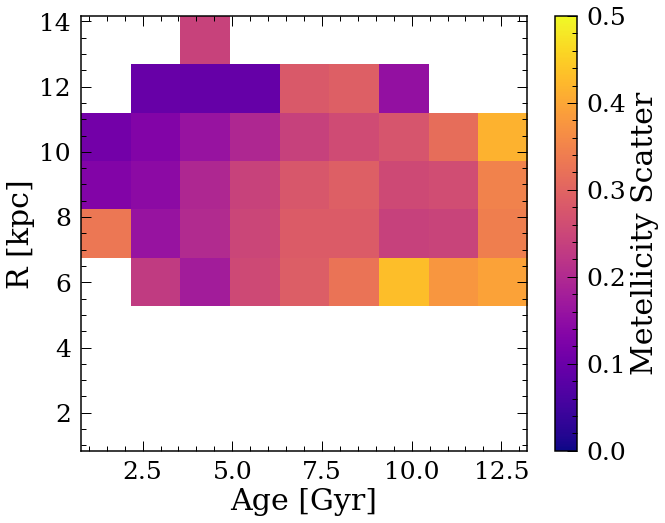

In [645]:
plt.figure(figsize=(10,8))
plt.imshow(scatters[:,::-1].T, cmap='plasma', 
           extent=(ages[0], ages[-1], rs[0], rs[-1]), vmin=0,
          vmax=0.5,aspect='auto')
plt.xlabel('Age [Gyr]')
plt.ylabel('R [kpc]')
cb = plt.colorbar()
cb.set_label('Metellicity Scatter')

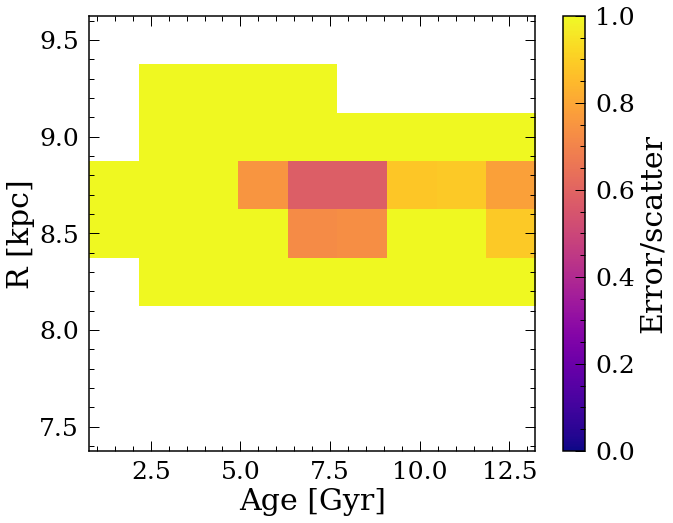

In [200]:
"""plt.figure(figsize=(10,8))
mask = (scatters_err[:,::-1].T<scatters[:,::-1].T)
plt.imshow(scatters_err[:,::-1].T/scatters[:,::-1].T, cmap='plasma', 
           extent=(ages[0], ages[-1], rs[0], rs[-1]), vmin=0,
           vmax=1,aspect='auto')
plt.xlabel('Age [Gyr]')
plt.ylabel('R [kpc]')
cb = plt.colorbar()
cb.set_label('Error/scatter')"""

In [651]:
rs, ages

(array([ 0.83333333,  2.5       ,  4.16666667,  5.83333333,  7.5       ,
         9.16666667, 10.83333333, 12.5       , 14.16666667]),
 array([ 0.77777778,  2.33333333,  3.88888889,  5.44444444,  7.        ,
         8.55555556, 10.11111111, 11.66666667, 13.22222222]))

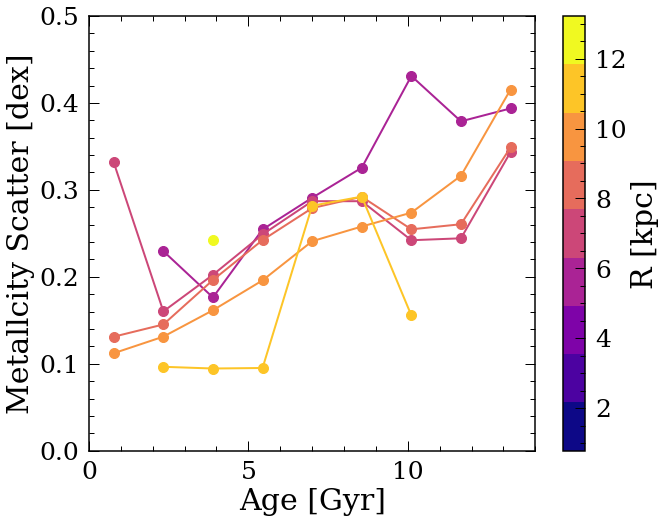

In [656]:
colors = getcolor(ages)
plt.figure(figsize=(10,8))
for i in range(len(rs)):
    plt.plot(ages, scatters[:,i], '-o', color=colors[i], markersize=10)
plt.scatter(-10,-10,c=0, vmin=min(ages), vmax=max(ages),
            cmap=plt.get_cmap('plasma', len(rs)))
cb = plt.colorbar()
cb.set_label('R [kpc]')
plt.xlabel('Age [Gyr]')
plt.ylabel('Metallcity Scatter [dex]')
plt.xlim([0,14])
plt.ylim([0,0.5])
plt.show()



In [532]:
"""plt.hexbin(sub['age'], sub['R'], C=sub['feh_err'], extent=(0,14,0,15),
          gridsize=10, cmap='plasma',mincnt=10)"""

"plt.hexbin(sub['age'], sub['R'], C=sub['feh_err'], extent=(0,14,0,15),\n          gridsize=10, cmap='plasma',mincnt=10)"

In [114]:
"""import warnings
warnings.filterwarnings('ignore')

m = (sub['hi_low']==0)
monoage(sub['feh'].values[m], sub['R'].values[m], sub['age'].values[m],
        xlims=[5,15])


monoage(sub['feh'].values[m], sub['R'].values[m], sub['age'].values[m],
        xlims=[10,14])

ages, slopes, fehscatter = monoage_line(sub['feh'].values[m], 
                                        sub['R'].values[m], 
                                        sub['age'].values[m],
                                        agebin=np.linspace(0,14,10),
                                        xlims=[10,14],
                                       feherr=sub['feh_err'].values[m])

plt.figure(figsize=(10,8))
plt.plot(ages, slopes, 'r-o')
plt.xlabel('Age [Gyr]')
plt.ylabel('Metallicity Slope', color='r')
plt.plot([0,14],[0,0], 'k--')
plt.ylim([-0.2, 0.1])

plt.twinx()
plt.plot(ages, fehscatter, 'b-o')
plt.ylabel('Metallicity Scatter', color='b')

"""

"import warnings\nwarnings.filterwarnings('ignore')\n\nm = (sub['hi_low']==0)\nmonoage(sub['feh'].values[m], sub['R'].values[m], sub['age'].values[m],\n        xlims=[5,15])\n\n\nmonoage(sub['feh'].values[m], sub['R'].values[m], sub['age'].values[m],\n        xlims=[10,14])\n\nages, slopes, fehscatter = monoage_line(sub['feh'].values[m], \n                                        sub['R'].values[m], \n                                        sub['age'].values[m],\n                                        agebin=np.linspace(0,14,10),\n                                        xlims=[10,14],\n                                       feherr=sub['feh_err'].values[m])\n\nplt.figure(figsize=(10,8))\nplt.plot(ages, slopes, 'r-o')\nplt.xlabel('Age [Gyr]')\nplt.ylabel('Metallicity Slope', color='r')\nplt.plot([0,14],[0,0], 'k--')\nplt.ylim([-0.2, 0.1])\n\nplt.twinx()\nplt.plot(ages, fehscatter, 'b-o')\nplt.ylabel('Metallicity Scatter', color='b')\n\n"

# cross-match with Rbir


In [584]:
from astropy.table import Table
sub = Table.read('subgiant_fullparam_update.fits', format='fits')
sub = sub.to_pandas()
sub_rbir = pd.read_csv('RbirLAMOST.csv')
sub_rbir.columns

Index(['       specid', '          rb', '          rb_err', '       age_s'], dtype='object')

In [585]:
sub_rbir = sub_rbir.rename(columns={'          rb': 'Rb', 
                                    '          rb_err': 'Rb_err',
                                   '       specid':'specid'})
sub['SPECID'] = [str(i.decode(encoding="utf-8").split()[0]) for i in sub['SPECID']]
sub_rbir['specid'] = [str(i.split()[0]) for i in sub_rbir['specid']]

sub = pd.merge(sub, 
               sub_rbir[['specid', 'Rb', 'Rb_err']], 
               left_on='SPECID', right_on='specid', how='inner')
sub

,NUM,RA,DEC,SPECID,SNR_G,TEFF,TEFF_ERR,LOGG,LOGG_ERR,FEH,...,R_GUIDING,R_APO,R_PERI,U,V,W,DELTA,specid,Rb,Rb_err
0,2,332.300352,-1.566708,20111024-F5902-01-093,38.060001,5989.644531,41.567348,4.218867,0.092477,-0.524888,...,5.826285,7.821283,5.121624,-2.800932,-51.694530,7.689068,0.374308,20111024-F5902-01-093,11.850,2.547
1,5,330.271298,-0.940016,20111024-F5902-02-169,20.459999,5691.561523,56.098557,3.809866,0.161478,-0.754623,...,5.250849,7.554014,4.503441,32.841484,-73.599098,17.886665,0.368036,20111024-F5902-02-169,4.438,1.969
2,6,330.647473,-1.613945,20111024-F5902-02-218,36.930000,5703.019043,35.453484,3.885453,0.099010,-0.716993,...,7.188559,8.724494,6.888308,65.066223,-23.658245,30.216753,0.364714,20111024-F5902-02-218,7.644,4.725
3,9,331.360469,-0.017034,20111024-F5902-03-047,56.330002,5169.034180,23.653004,3.952794,0.048204,-0.075695,...,5.622092,7.733301,4.704775,34.623859,-67.780670,-24.639688,0.389689,20111024-F5902-03-047,1.881,4.014
4,14,332.271931,0.032772,20111024-F5902-04-094,36.340000,5852.563965,34.030266,3.979938,0.086517,-0.443101,...,6.365765,7.723552,6.247191,47.251446,-44.856701,20.325701,0.363331,20111024-F5902-04-094,9.913,3.232
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200669,247100,301.324719,19.511390,20190608-HD200934N184657B01-15-061,25.160000,6349.384766,63.922832,3.880777,0.139560,-0.265355,...,7.642092,8.853310,6.719159,-0.809863,0.991877,-9.294562,0.629348,20190608-HD200934N184657B01-15-061,11.578,1.934
200670,247101,301.679529,19.844419,20190608-HD200934N184657B01-15-078,60.750000,5362.845703,22.788040,3.832144,0.047025,-0.211407,...,5.917875,8.029772,4.776894,61.975906,-63.150188,-46.427830,0.442143,20190608-HD200934N184657B01-15-078,3.770,1.058
200671,247102,302.360008,19.667063,20190608-HD200934N184657B01-15-112,27.870001,6151.237793,53.837502,4.037323,0.132733,-0.538752,...,7.483530,7.527154,7.470575,33.778160,-11.971305,-0.583835,0.614917,20190608-HD200934N184657B01-15-112,13.692,1.080
200672,247103,302.493578,19.880567,20190608-HD200934N184657B01-15-129,81.669998,5630.796387,16.803864,3.991341,0.036366,0.050142,...,5.698174,7.626591,4.531321,20.930651,-63.846806,14.693364,0.534898,20190608-HD200934N184657B01-15-129,5.429,0.312


In [586]:
#sub['Rmean'] = (sub['R_PERI']+sub['R_APO'])/2

sub = sub.loc[abs(sub['Z'])<1].reset_index(drop=True)
ages, rs, avrs_z = avr(sub['AGE'].values, sub['Rb'].values, sub['VZ'].values, 
                     rbin=np.linspace(2,15,5), agebin=agebincalc)

ages, rs, avrs_phi = avr(sub['AGE'].values, sub['Rb'].values, sub['VT'].values, 
                     rbin=np.linspace(2,15,5), agebin=agebincalc)

ages, rs, avrs_r = avr(sub['AGE'].values, sub['Rb'].values, sub['VR'].values, 
                     rbin=np.linspace(2,15,5), agebin=agebincalc)

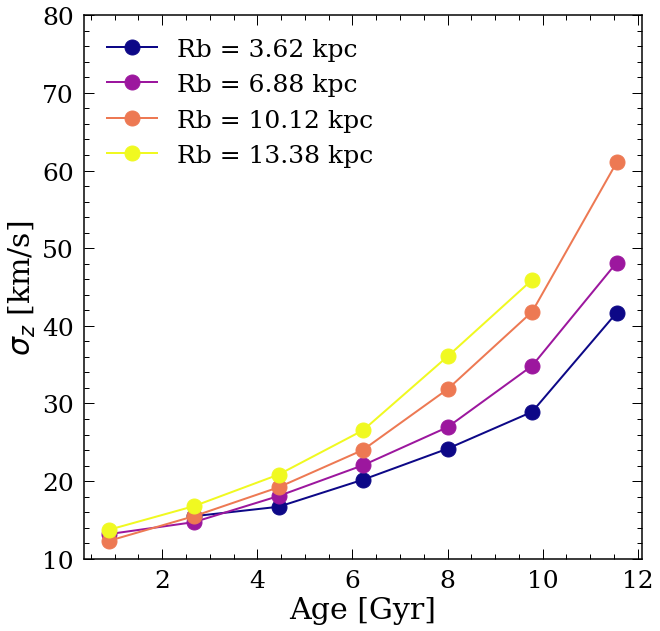

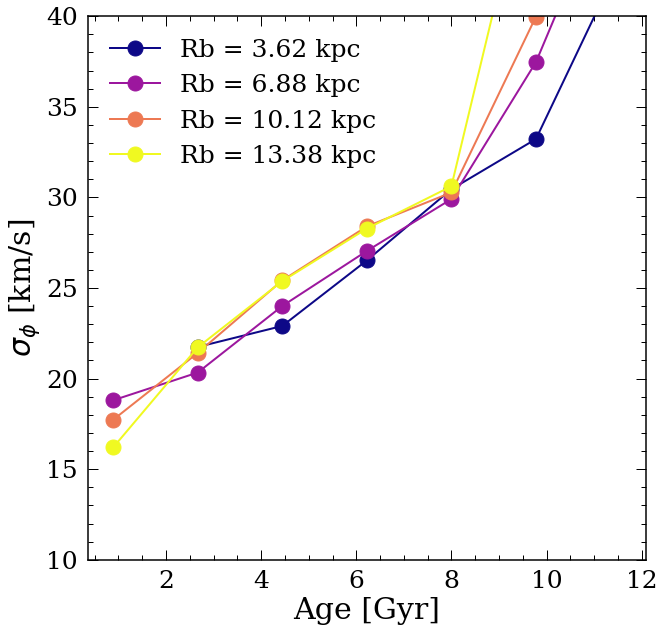

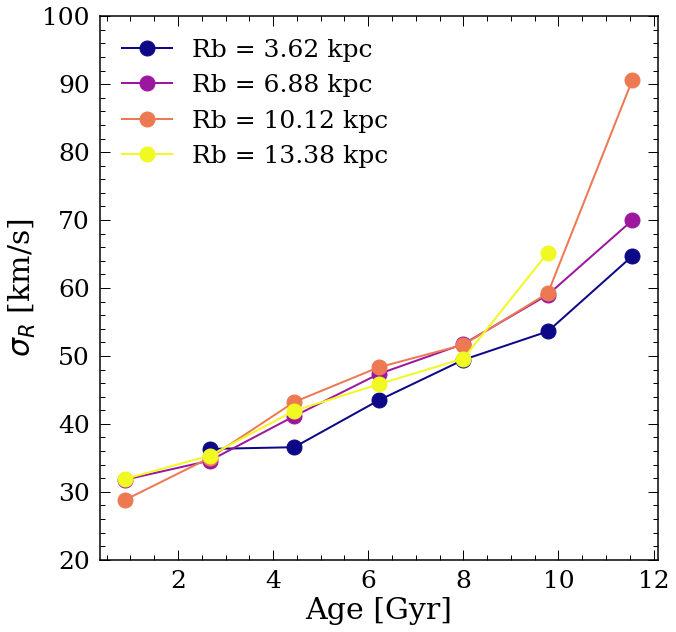

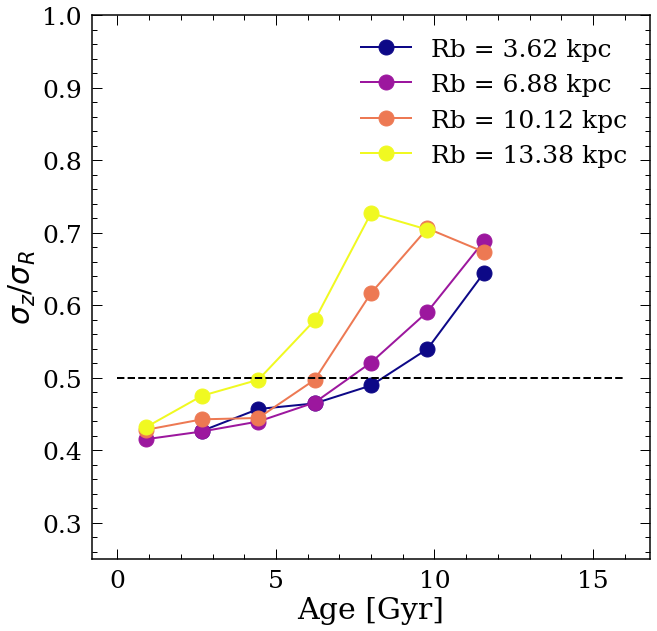

In [354]:

colors = getcolor(rs)

plt.figure()
for i in range(len(rs)):
    plt.plot(ages, avrs_z[i,:], 'o-', color=colors[i], label='Rb = %.2f kpc'%rs[i],
            markersize=15)
    plt.xlabel('Age [Gyr]')
    plt.ylabel('$σ_z$ [km/s]')
plt.ylim([10, 80])
plt.legend()



plt.figure()
for i in range(len(rs)):
    plt.plot(ages, avrs_phi[i,:], 'o-', color=colors[i], label='Rb = %.2f kpc'%rs[i],
            markersize=15)
    plt.xlabel('Age [Gyr]')
    plt.ylabel('$σ_ϕ$ [km/s]')
plt.ylim([10, 40])
plt.legend()



plt.figure()
for i in range(len(rs)):
    plt.plot(ages, avrs_r[i,:], 'o-', color=colors[i], label='Rb = %.2f kpc'%rs[i],
            markersize=15)
    plt.xlabel('Age [Gyr]')
    plt.ylabel('$σ_R$ [km/s]')
plt.ylim([20, 100])
plt.legend()



plt.figure()
for i in range(len(rs)):
    plt.plot(ages, avrs_z[i,:]/avrs_r[i,:], 'o-', color=colors[i], label='Rb = %.2f kpc'%rs[i],
            markersize=15)
    plt.xlabel('Age [Gyr]')
    plt.ylabel('$σ_z$/$σ_R$')
plt.legend()
plt.ylim([0.25, 1])

plt.plot([0,16], [0.5,0.5], 'k--')






In [451]:
#sub['Rmean'] = (sub['R_PERI']+sub['R_APO'])/2

sub = sub.loc[abs(sub['Z'])<1].reset_index(drop=True)
ages, rs, avrs_z = avr(sub['Rb'].values, sub['AGE'].values, sub['VZ'].values, 
                     rbin=agebincalc, agebin=np.linspace(2,15,10))

ages, rs, avrs_phi = avr(sub['Rb'].values, sub['AGE'].values, sub['VT'].values, 
                     rbin=agebincalc, agebin=np.linspace(2,15,10))

ages, rs, avrs_r = avr(sub['Rb'].values, sub['AGE'].values, sub['VR'].values, 
                     rbin=agebincalc, agebin=np.linspace(2,15,10))


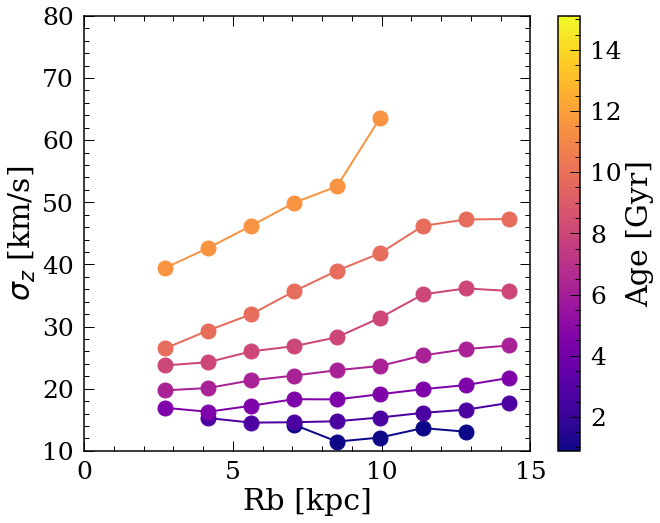

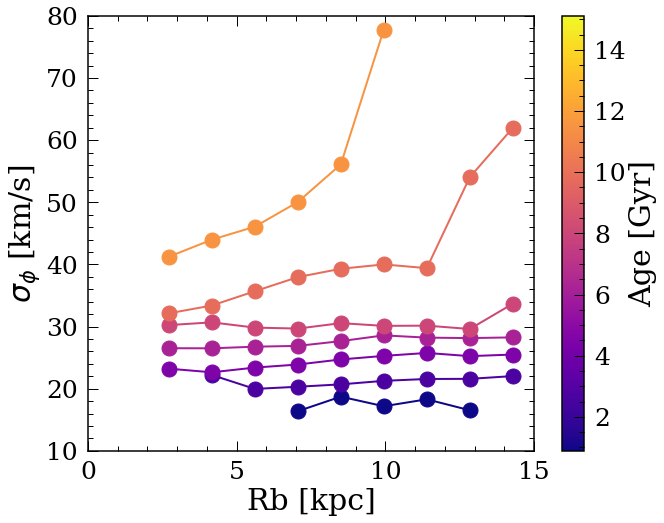

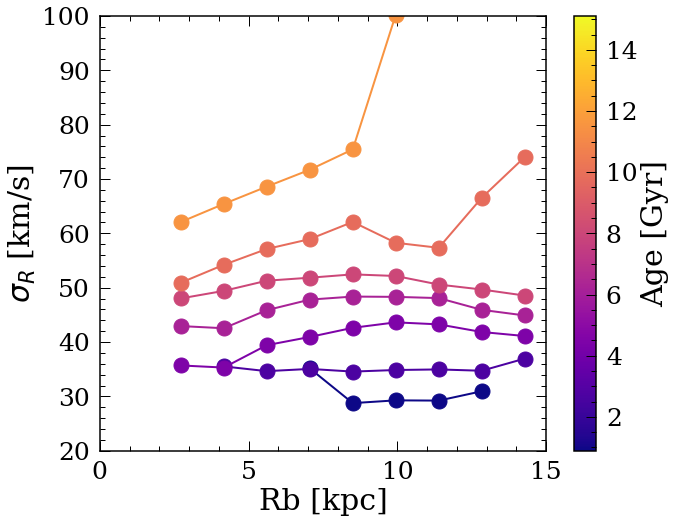

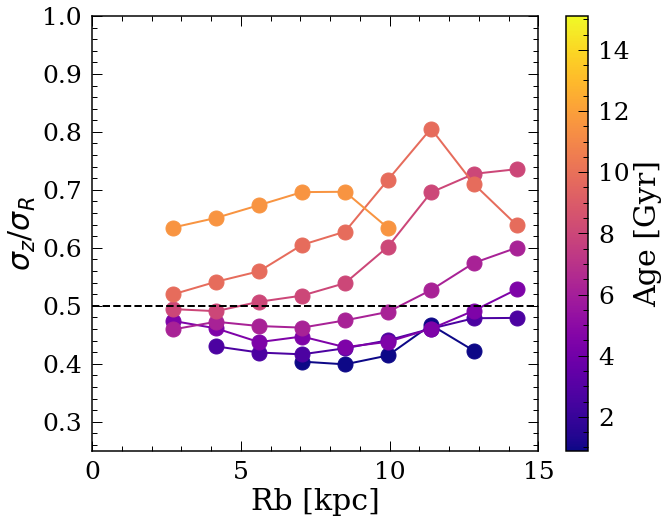

In [453]:

colors = getcolor(rs)

plt.figure(figsize=(10,8))
for i in range(len(rs)):
    plt.plot(ages, avrs_z[i,:], 'o-', color=colors[i], label='Age = %.2f Gyr'%rs[i],
            markersize=15)
    plt.xlabel('Rb [kpc]')
    plt.ylabel('$σ_z$ [km/s]')
plt.scatter(-100, -100, c=1, vmin=min(rs), vmax=max(rs), cmap='plasma')
plt.ylim([10, 80])
plt.xlim([0,15])
cb = plt.colorbar()
cb.set_label('Age [Gyr]')
#plt.legend()



plt.figure(figsize=(10,8))
for i in range(len(rs)):
    plt.plot(ages, avrs_phi[i,:], 'o-', color=colors[i], label='Age = %.2f Gyr'%rs[i],
            markersize=15)
    plt.xlabel('Rb [kpc]')
    plt.ylabel('$σ_ϕ$ [km/s]')
plt.ylim([10, 80])
plt.xlim([0,15])
plt.scatter(-100, -100, c=1, vmin=min(rs), vmax=max(rs), cmap='plasma')
cb = plt.colorbar()
cb.set_label('Age [Gyr]')
#plt.legend()



plt.figure(figsize=(10,8))
for i in range(len(rs)):
    plt.plot(ages, avrs_r[i,:], 'o-', color=colors[i], label='Age = %.2f Gyr'%rs[i],
            markersize=15)
    plt.xlabel('Rb [kpc]')
    plt.ylabel('$σ_R$ [km/s]')
plt.ylim([20, 100])
plt.xlim([0,15])
plt.scatter(-100, -100, c=1, vmin=min(rs), vmax=max(rs), cmap='plasma')
cb = plt.colorbar()
cb.set_label('Age [Gyr]')
#plt.legend()



plt.figure(figsize=(10,8))
for i in range(len(rs)):
    plt.plot(ages, avrs_z[i,:]/avrs_r[i,:], 'o-', color=colors[i], label='Age = %.2f Gyr'%rs[i],
            markersize=15)
    plt.xlabel('Rb [kpc]')
    plt.ylabel('$σ_z$/$σ_R$')
plt.ylim([0.25, 1])
plt.xlim([0,15])
plt.scatter(-100, -100, c=1, vmin=min(rs), vmax=max(rs), cmap='plasma')
cb = plt.colorbar()
cb.set_label('Age [Gyr]')
#plt.legend()

plt.plot([0,16], [0.5,0.5], 'k--')






In [420]:
print(len(sub))
sub = sub.dropna(subset=['FEH_ERR','AGE','Rb']).reset_index(drop=True)
print(len(sub))

m = (abs(sub['Z'])<1)
m = m&(sub['AGE_ERR']<np.diff(np.linspace(0,14,10))[0])
print(sum(m))

ages, rs, scatters = getscatt(sub['FEH'].values[m], 
                                        sub['R'].values[m], 
                                        sub['AGE'].values[m],
                                        agebin=np.linspace(0,14,10),
                                        xlims=[0,15],rbin=10)

173831
173831
171506


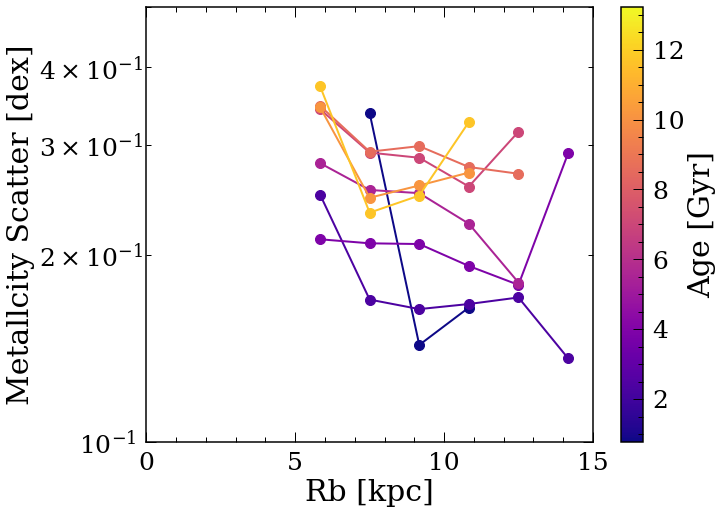

In [423]:
colors = getcolor(ages)
plt.figure(figsize=(10,8))
for i in range(len(ages)):
    plt.plot(rs, scatters[i,:], '-o', color=colors[i], markersize=10)
plt.scatter(-10,-10,c=0, vmin=min(ages), vmax=max(ages),cmap='plasma')
cb = plt.colorbar()
cb.set_label('Age [Gyr]')
plt.xlabel('Rb [kpc]')
plt.ylabel('Metallcity Scatter [dex]')
#plt.xlim([5,15])
#plt.ylim([0,0.5])
plt.xlim([0,15])
plt.ylim([0.1,0.5])
plt.yscale('log')
plt.show()




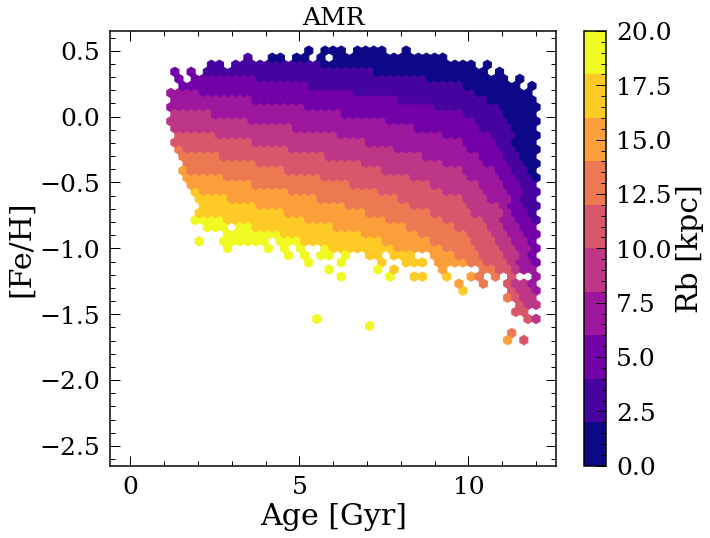

In [440]:


plt.figure(figsize=(10,8))
plt.hexbin(sub['AGE'], sub['FEH'], C=sub['Rb'],
           extent=(0,12,-2.5,0.5), cmap=plt.get_cmap('plasma',10),
        mincnt=1, gridsize=50, vmin=0, vmax=20)
plt.title('AMR', fontsize=25)
plt.xlabel('Age [Gyr]')
plt.ylabel('[Fe/H]')
cb = plt.colorbar()
cb.set_label('Rb [kpc]')


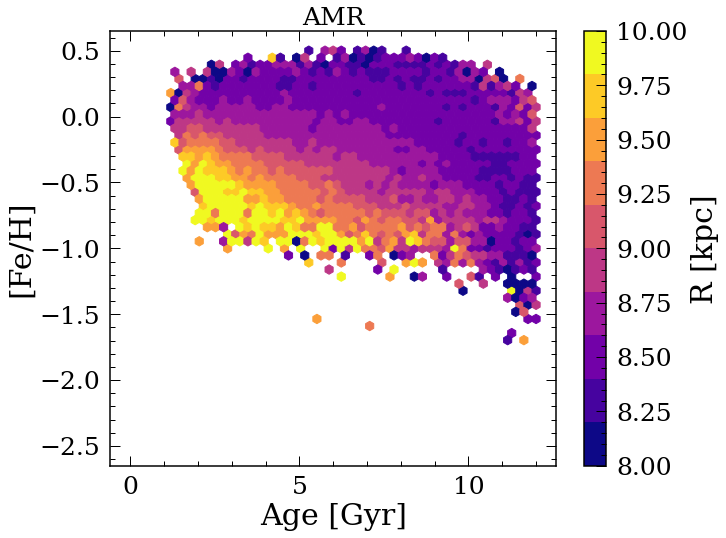

In [450]:


plt.figure(figsize=(10,8))
plt.hexbin(sub['AGE'], sub['FEH'], C=sub['R'],
           extent=(0,12,-2.5,0.5), cmap=plt.get_cmap('plasma',10),
        mincnt=1, gridsize=50, vmin=8, vmax=10)
plt.title('AMR', fontsize=25)
plt.xlabel('Age [Gyr]')
plt.ylabel('[Fe/H]')
cb = plt.colorbar()
cb.set_label('R [kpc]')



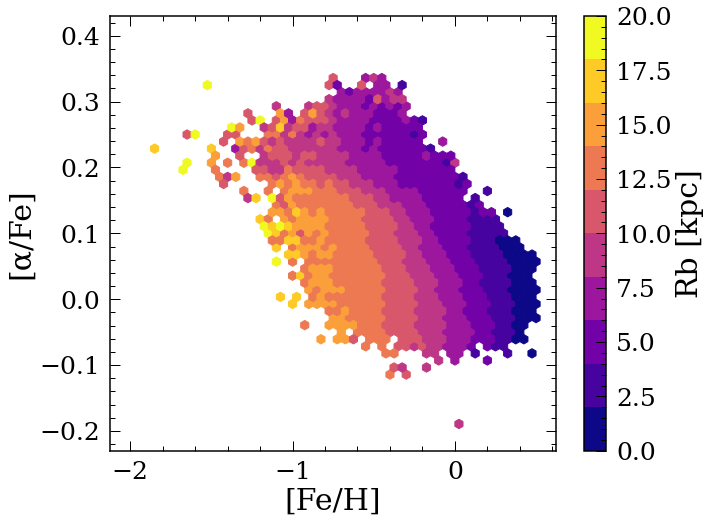

In [457]:


plt.figure(figsize=(10,8))
plt.hexbin(sub['FEH'], sub['ALPHA_FE'], C=sub['Rb'],
           extent=(-2,0.5,-0.2,0.4), cmap=plt.get_cmap('plasma',10),
        mincnt=1, gridsize=50, vmin=0, vmax=20)
#plt.title('AMR', fontsize=25)
plt.xlabel('[Fe/H]')
plt.ylabel('[α/Fe]')
cb = plt.colorbar()
cb.set_label('Rb [kpc]')



792
2797
6074
9037
12132
14792
16618
16710
16490
16570
16860
15592
12509
8498
4755


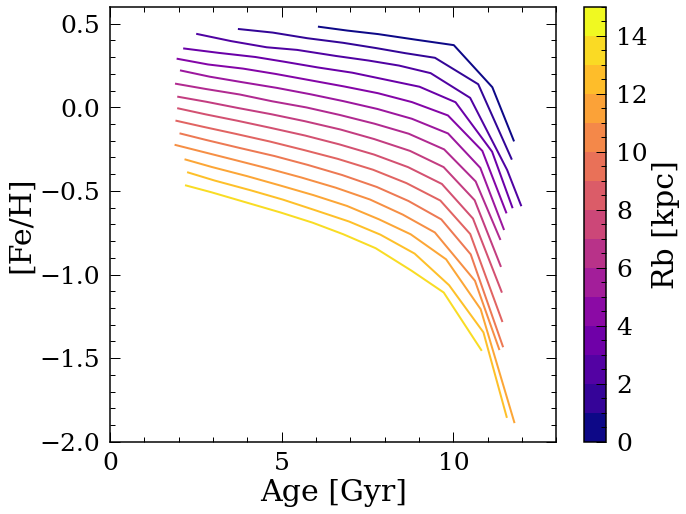

In [593]:
Rbbin = np.linspace(0,15,16)
color_amr = getcolor(Rbbin)

plt.figure(figsize=(10,8))
for i in range(len(Rbbin)-1):

    m = (sub['Rb']>Rbbin[i])&(sub['Rb']<Rbbin[i+1])
    """plt.hexbin(sub['AGE'][m], sub['FEH'][m], extent=(0,18,-2.5,0.5), cmap='jet',
            mincnt=1, gridsize=50)"""
    age_amr_all, feh_amr_all = sub['AGE'].values[m], sub['FEH'].values[m]
    age_amr_all, feh_amr_all = zip(*sorted(zip(age_amr_all, feh_amr_all)))
    age_amr_all, feh_amr_all = np.array(age_amr_all), np.array(feh_amr_all)
    age_amr, feh_amr = movingMed_time(age_amr_all, feh_amr_all,
                                     1,1)
    plt.plot(age_amr, feh_amr, color=color_amr[i])
    plt.xlim([0,13])
    plt.ylim([-2,0.6])
    print(sum(m))
    #plt.title('%.2f kpc < Rb < %.2f kpc'%(Rbbin[i], Rbbin[i+1]), fontsize=25)
plt.scatter(-100,-100, c=0, vmin=min(Rbbin), vmax=max(Rbbin), 
            cmap=plt.get_cmap('plasma', len(Rbbin)-1))
plt.xlabel('Age [Gyr]')
plt.ylabel('[Fe/H]')
cb = plt.colorbar()
cb.set_label('Rb [kpc]')
    



# look at other elements

abundnaces from here https://ui.adsabs.harvard.edu/abs/2019ApJS..245...34X/abstract


In [595]:
sub_abundance = Table.read('apjsab5364-APOGEE/DDPayne_LAMOSTDR5_supplement_scaleAPOGEE.fits', format='fits')
sub_abundance = sub_abundance.to_pandas()

In [596]:
sub_abundance['SPECID'] = [str(i.decode(encoding="utf-8").split()[0]) for i in sub_abundance['SPECID']]

In [597]:
print(len(sub))
sub = pd.merge(sub, sub_abundance, left_on='SPECID', right_on='SPECID',
              how='inner')
print(len(sub))

173831
154098


In [598]:
abunds = [i for i in sub.columns if ('_FE' in i) and ('_ERR' not in i) and ('_GRADCORR' not in i) and ('_FLAG' not in i)]
abunds_err = [i+'_ERR' for i in abunds]
abunds_flag = [i+'_FLAG' for i in abunds]


In [606]:
list(sub_save.columns)

['NUM',
 'RA_x',
 'DEC_x',
 'SPECID',
 'SNR_G_x',
 'TEFF_x',
 'TEFF_ERR_x',
 'LOGG_x',
 'LOGG_ERR_x',
 'FEH_x',
 'FEH_ERR_x',
 'ALPHA_FE',
 'ALPHA_FE_ERR',
 'VLOS',
 'VLOS_ERR',
 'SOURCE_ID',
 'PARALLAX',
 'PARALLAX_ERROR',
 'PARALLAX_ZPT',
 'PMRA',
 'PMRA_ERROR',
 'PMDEC',
 'PMDEC_ERROR',
 'RUWE',
 'FIDELITY',
 'GAIA_G',
 'GAIA_G_ERR',
 'GAIA_BP',
 'GAIA_BP_ERR',
 'GAIA_RP',
 'GAIA_RP_ERR',
 'J',
 'J_ERR',
 'H',
 'H_ERR',
 'KS',
 'KS_ERR',
 'RGEO',
 'RGEO_LOW',
 'RGEO_HIGH',
 'EBV',
 'EBV_ERR',
 'EXTCOEF_G',
 'EXTCOEF_BP',
 'EXTCOEF_RP',
 'EXTCOEF_J',
 'EXTCOEF_H',
 'EXTCOEF_KS',
 'MK_GEO',
 'MK_GEO_ERR',
 'MK_SPEC',
 'MK_SPEC_ERR',
 'MK_COMB',
 'MK_COMB_ERR',
 'SNR_DPARALLAX_x',
 'LOGDIS',
 'LOGDIS_ERR',
 'AGE',
 'AGE_ERR',
 'MASS',
 'MASS_ERR',
 'R',
 'PHI',
 'Z',
 'X',
 'Y',
 'VR',
 'VT',
 'VZ',
 'VX',
 'VY',
 'JR',
 'JPHI',
 'JZ',
 'OMEGA_R',
 'OMEGA_PHI',
 'OMEGA_Z',
 'ANGLE_R',
 'ANGLE_PHI',
 'ANGLE_Z',
 'ECC',
 'E',
 'ER',
 'EZ',
 'LX',
 'LY',
 'LZ',
 'ZMAX',
 'R_GUIDING',
 'R_

In [607]:
"""sub_save = sub.loc[abs(sub['Z'])<1]
sub_save = sub[[i for i in sub.columns if ('_y' not in i) and \
               ('FILENAME' not in i) and ('SNR_U' not in i) and \
               ('DELTA' not in i) and ('_GRADCORR' not in i) and \
                ('SUBCLASS' not in i)]].reset_index(drop=True)
sub_save.to_csv('Xiang_elements.csv', index=False)
#sub.to_pickle('Xiang_elements.pkl')"""

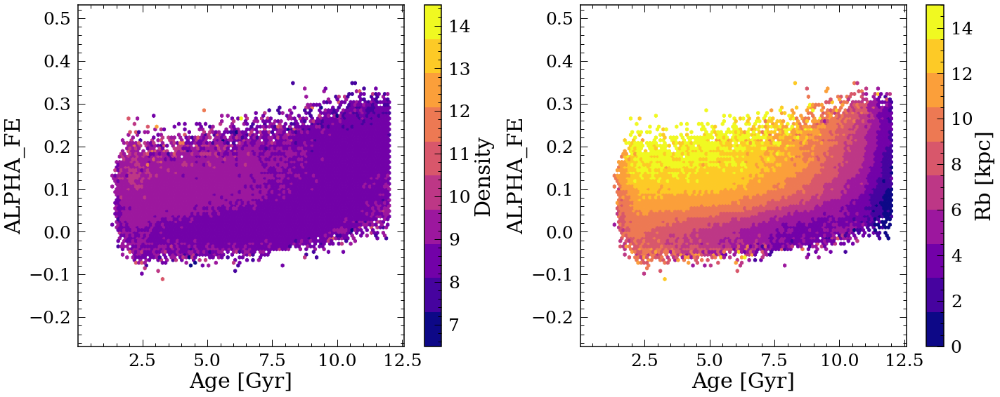

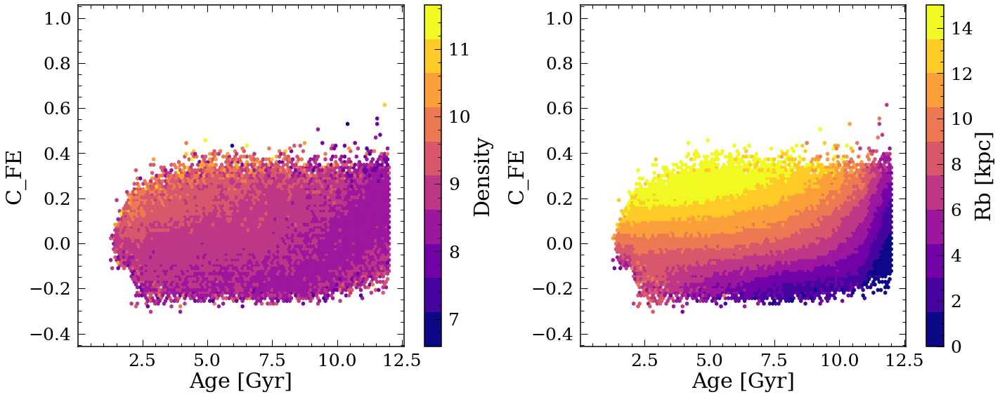

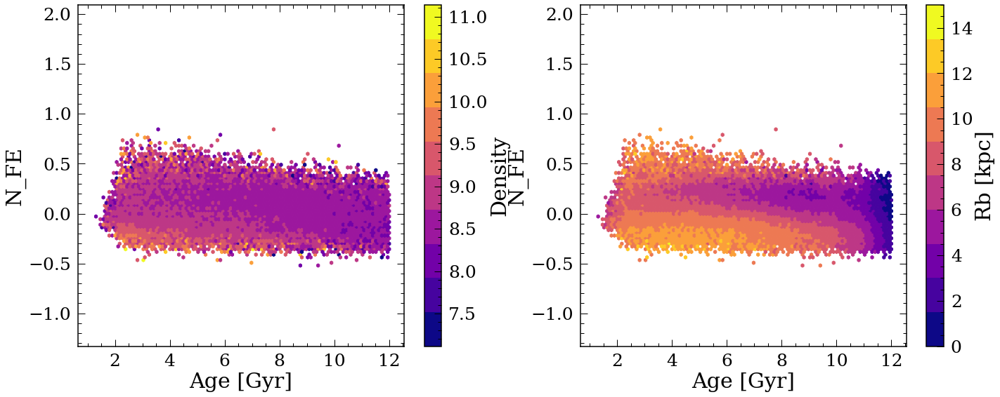

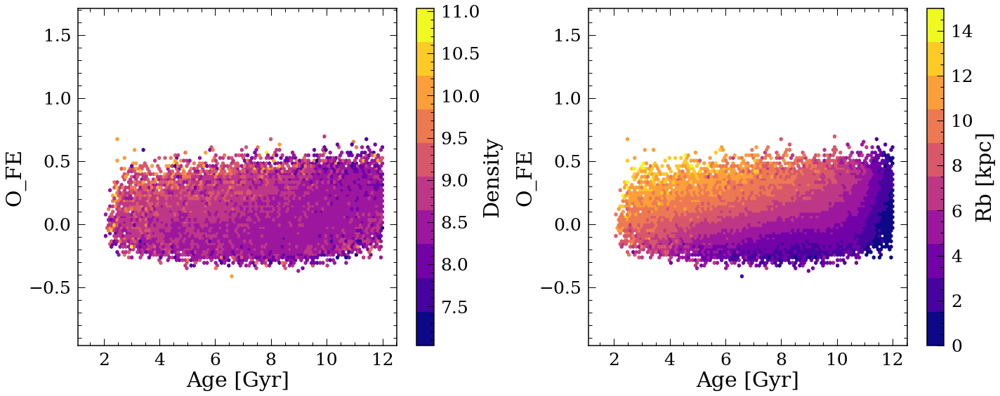

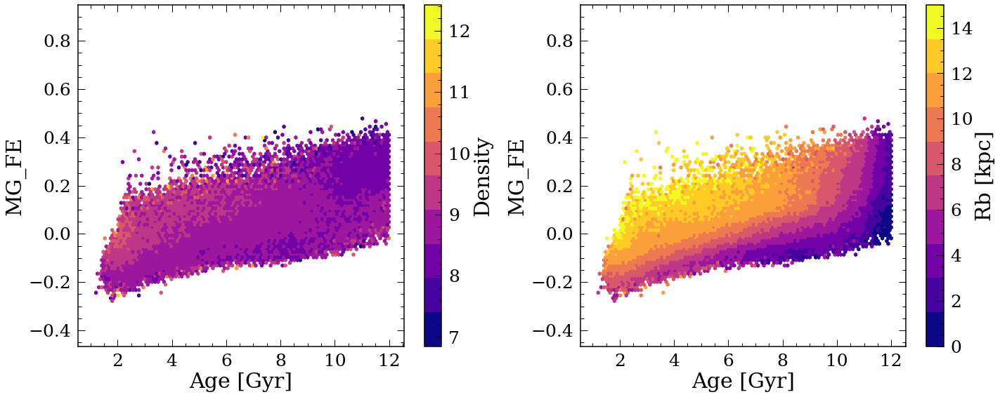

...

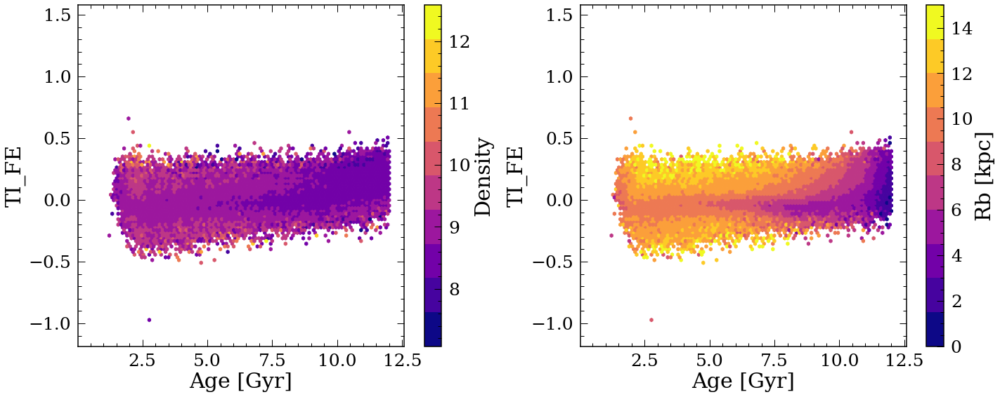

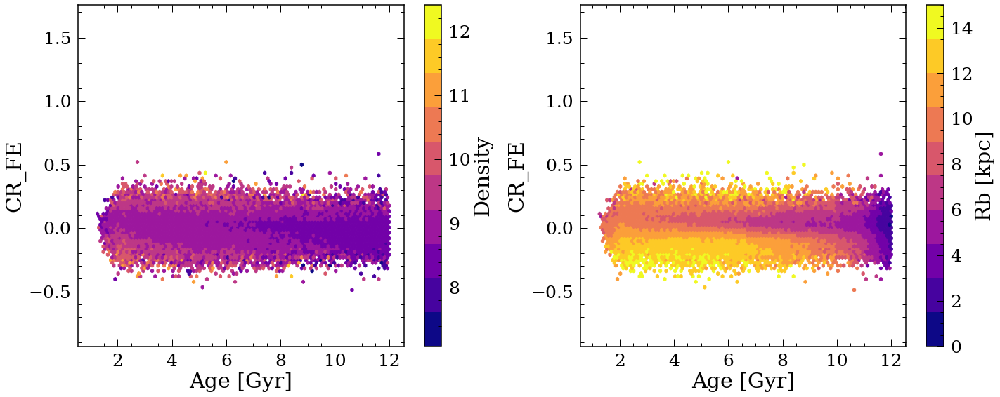

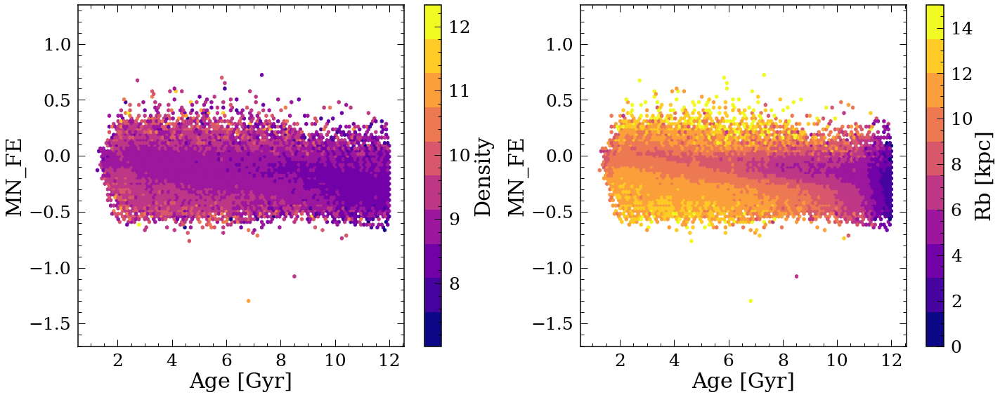

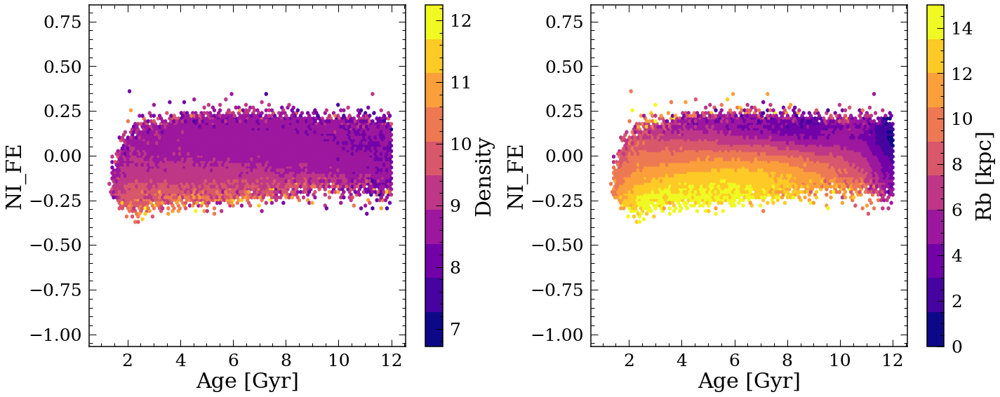

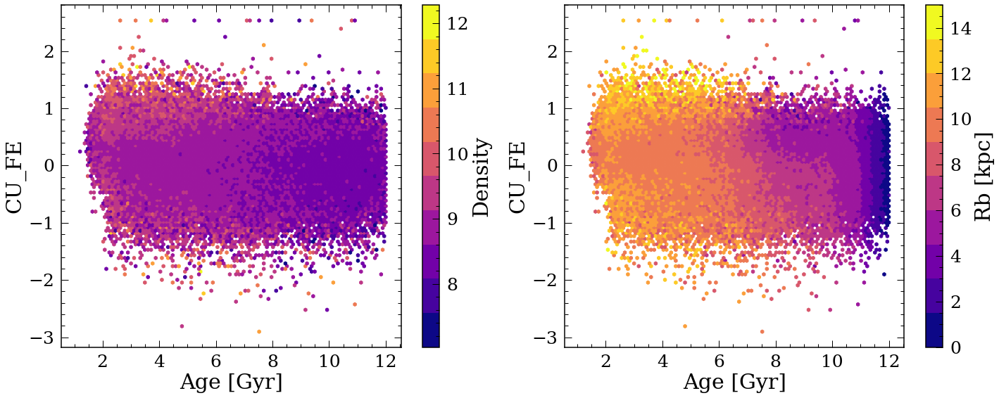

In [580]:

for i in range(len(abunds)):
    if i!=0:
        sub_abund_sing = sub.loc[sub[abunds_flag[i]]==1].reset_index(drop=True)
    else:
        sub_abund_sing = sub.dropna(subset='ALPHA_FE').reset_index(drop=True)
    
    sub_abund_sing = sub_abund_sing.dropna(subset=[abunds_err[i], abunds[i]]).reset_index(drop=True)
    sub_abund_sing = sub_abund_sing.loc[(sub_abund_sing[abunds[i]])<100].reset_index(drop=True)
    
    

    plt.figure(figsize=(20,8))
    plt.subplot(1,2,1)
    """plt.plot(sub_abund_sing['AGE'], sub_abund_sing[abunds[i]], 'k.',
            markersize=1)"""
    """plt.hexbin(sub_abund_sing['AGE'], sub_abund_sing[abunds[i]], 
                cmap=plt.get_cmap('binary'),
            mincnt=1, gridsize=100)"""
    plt.hexbin(sub_abund_sing['AGE'], sub_abund_sing[abunds[i]], 
               C=sub_abund_sing['R'],
                cmap=plt.get_cmap('plasma',10),
            mincnt=1, gridsize=100)
    cb = plt.colorbar()
    cb.set_label('Density')
    plt.xlabel('Age [Gyr]')
    plt.ylabel(abunds[i])


    
    plt.subplot(1,2,2)
    plt.hexbin(sub_abund_sing['AGE'], sub_abund_sing[abunds[i]], 
               C=sub_abund_sing['Rb'],
                cmap=plt.get_cmap('plasma',10),
            mincnt=1, gridsize=100, vmin=0, vmax=15)
    plt.xlabel('Age [Gyr]')
    plt.ylabel(abunds[i])
    cb = plt.colorbar()
    cb.set_label('Rb [kpc]')
    plt.tight_layout()



    

100%|██████████| 13/13 [00:56<00:00,  4.35s/it]


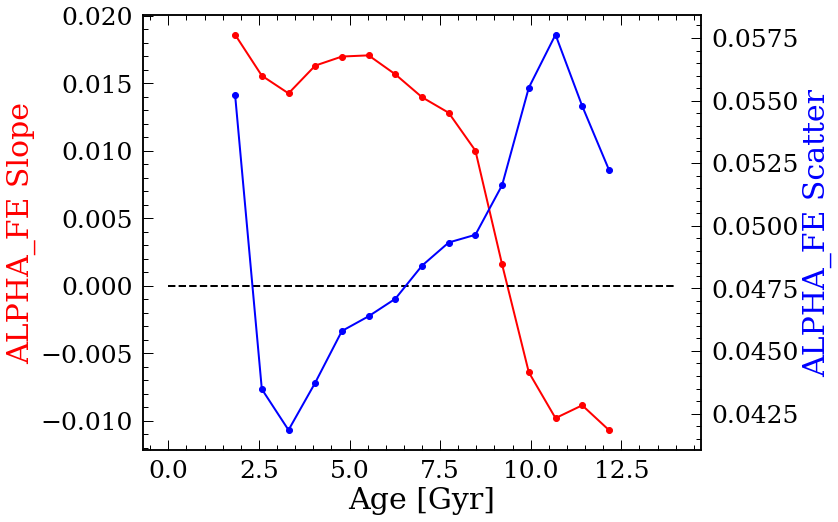

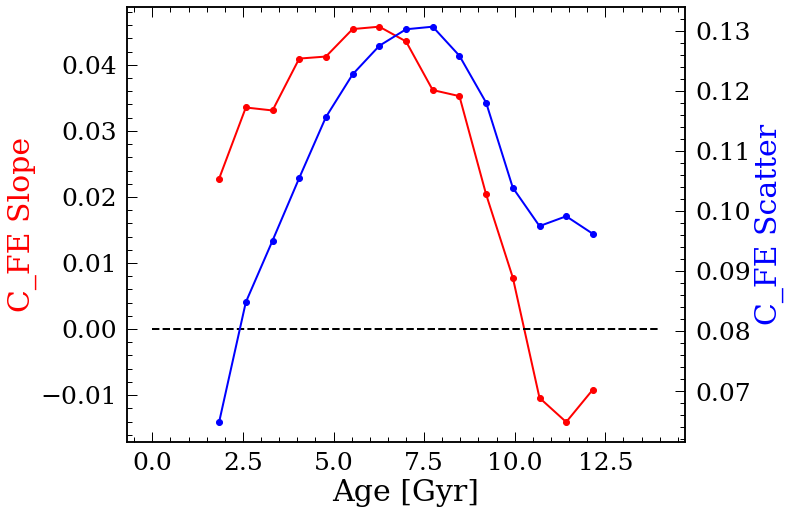

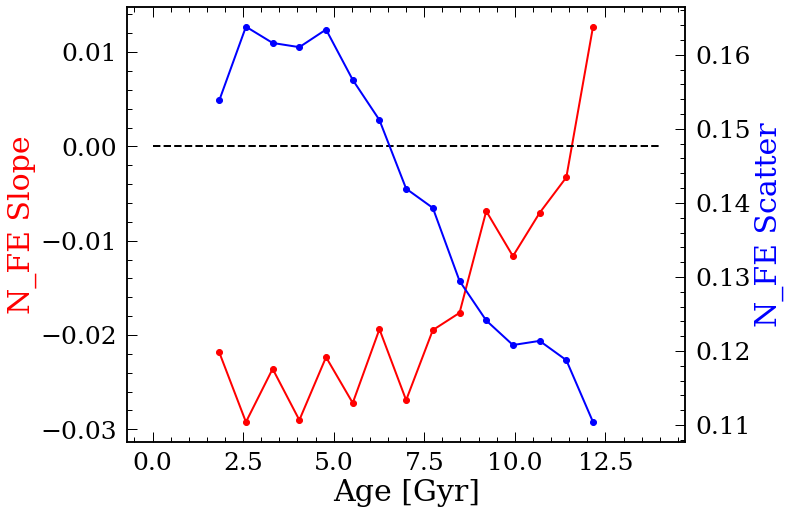

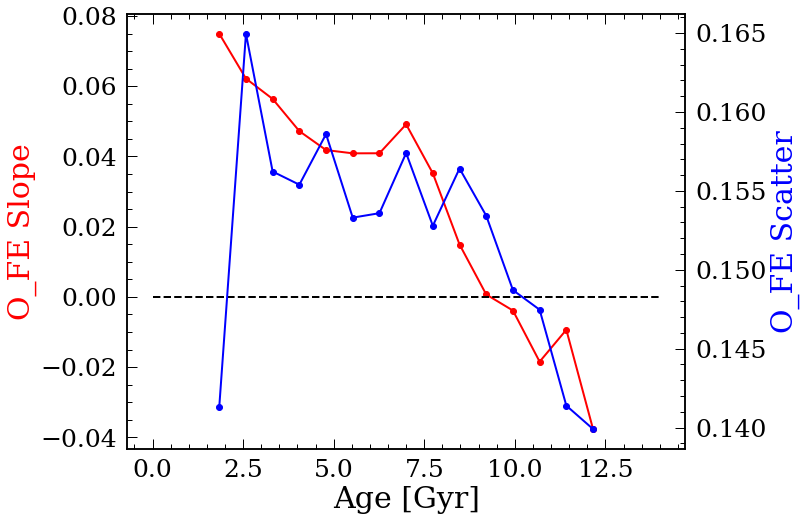

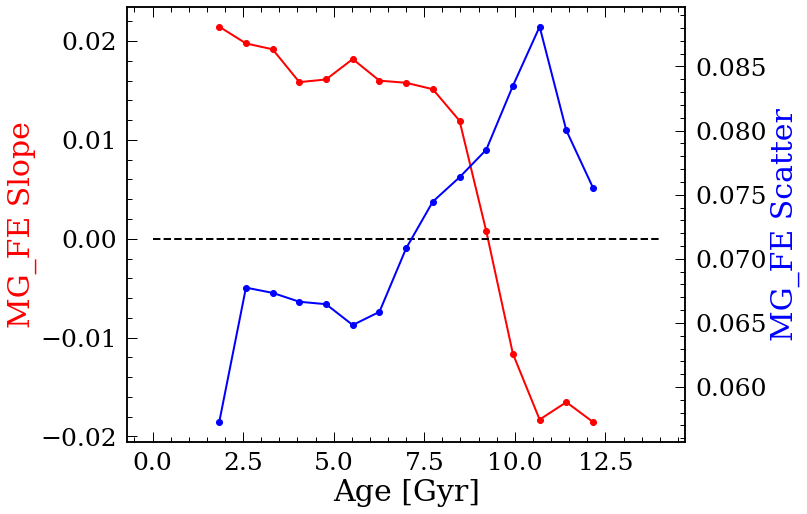

...

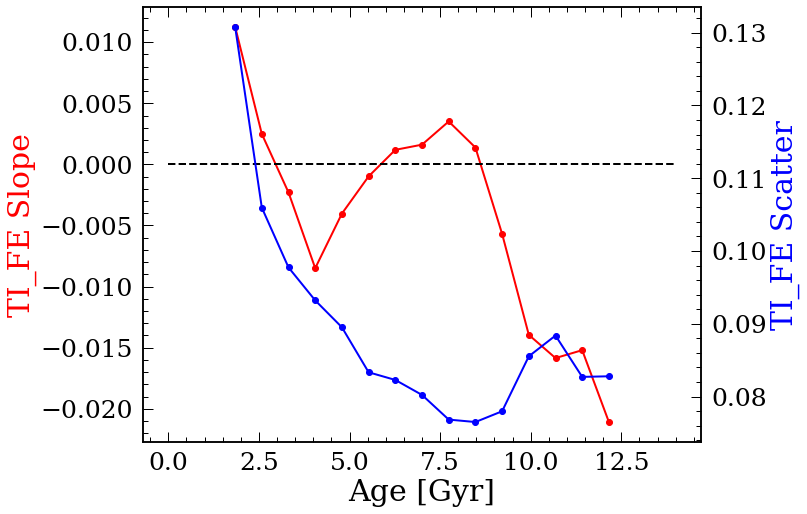

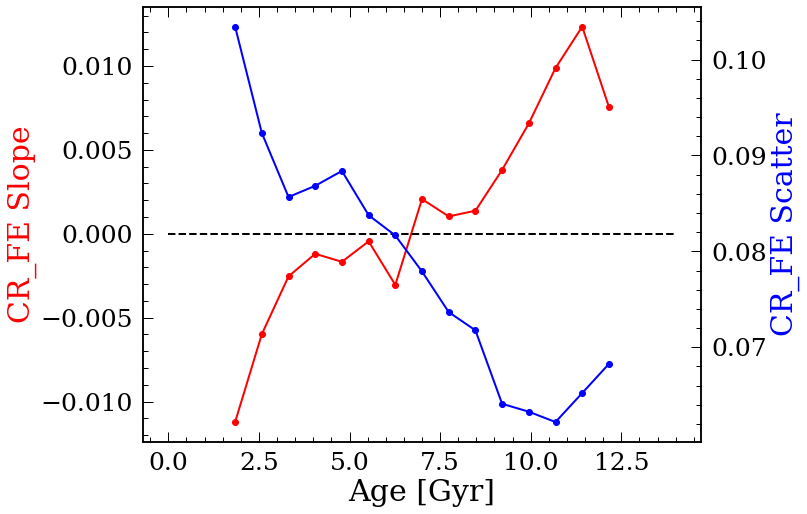

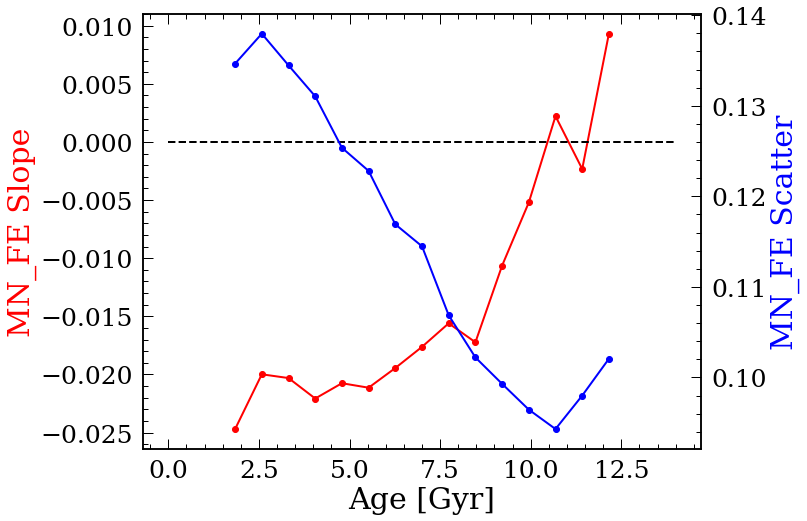

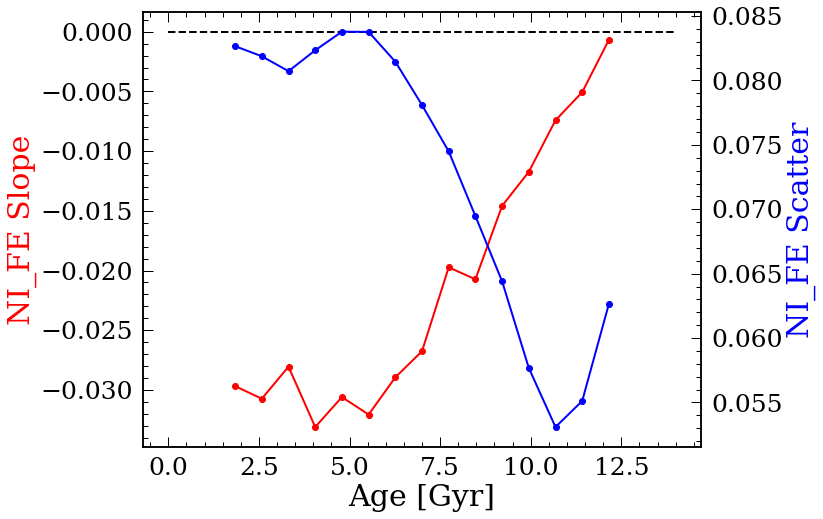

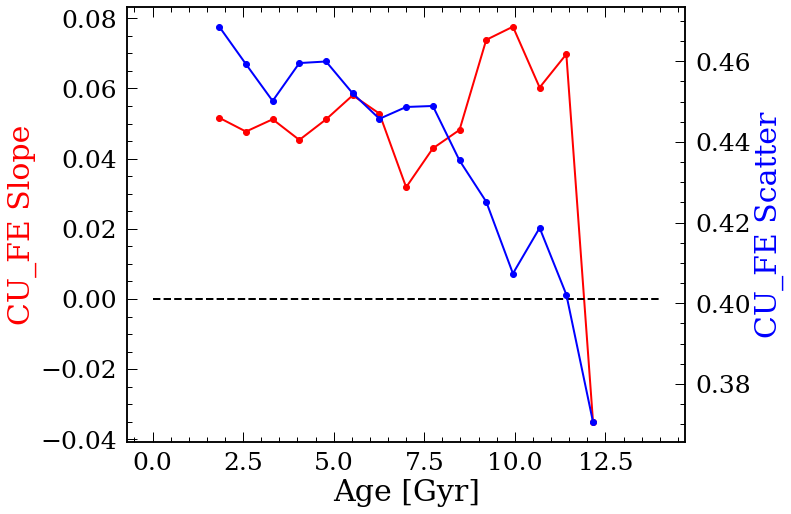

In [599]:
import warnings
warnings.filterwarnings('ignore')
#sub = sub.loc[sub['AGE_ERR']/sub['AGE']<0.2].reset_index(drop=True)

agebincalc = np.linspace(0,14,20)
    
ac = 0
ipc = 0
dc = 0 
ozc = 0
ipcc = 0

for i in trange(len(abunds)):
    if i!=0:
        sub_abund_sing = sub.loc[sub[abunds_flag[i]]==1].reset_index(drop=True)
    else:
        sub_abund_sing = sub.dropna(subset='ALPHA_FE').reset_index(drop=True)
    
    sub_abund_sing = sub_abund_sing.dropna(subset=[abunds_err[i], abunds[i]]).reset_index(drop=True)
    sub_abund_sing = sub_abund_sing.loc[(sub_abund_sing[abunds[i]])<100].reset_index(drop=True)

    m = (abs(sub_abund_sing['Z'])<1)&(sub_abund_sing['AGE_ERR']<np.diff(agebincalc)[0])
    m = m&(sub_abund_sing['AGE']>1.5)


    ages, slopes, fehscatter = monoage_line(sub_abund_sing[abunds[i]].values[m], 
                                            sub_abund_sing['R'].values[m], 
                                            sub_abund_sing['AGE'].values[m],
                                            agebin=agebincalc,
                                            xlims=[7,10],
                                           plotlegend=False,pltfig=False)

    plt.figure(figsize=(10,8))
    plt.plot(ages, slopes, 'r-o')
    plt.xlabel('Age [Gyr]')
    plt.ylabel(abunds[i]+' Slope', color='r')
    plt.plot([0,14],[0,0], 'k--')
    #plt.ylim([-0.02, 0.02])

    plt.twinx()
    plt.plot(ages, fehscatter, 'b-o')
    plt.ylabel(abunds[i]+' Scatter', color='b')
    #plt.ylim([0.03, 0.06])"""
    
    """
    m2 = (fehscatter==fehscatter)
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.3),
          ncol=3)"""



100%|██████████| 13/13 [00:56<00:00,  4.32s/it]


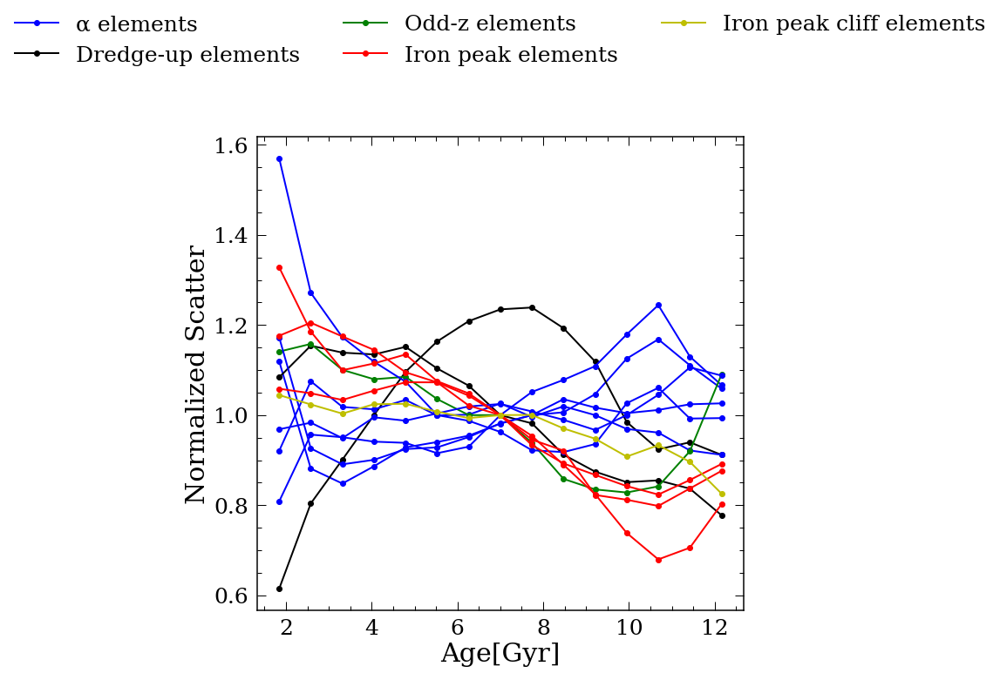

In [581]:
import warnings
warnings.filterwarnings('ignore')
#sub = sub.loc[sub['AGE_ERR']/sub['AGE']<0.2].reset_index(drop=True)

agebincalc = np.linspace(0,14,20)
    
ac = 0
ipc = 0
dc = 0 
ozc = 0
ipcc = 0

for i in trange(len(abunds)):
    if i!=0:
        sub_abund_sing = sub.loc[sub[abunds_flag[i]]==1].reset_index(drop=True)
    else:
        sub_abund_sing = sub.dropna(subset='ALPHA_FE').reset_index(drop=True)
    
    sub_abund_sing = sub_abund_sing.dropna(subset=[abunds_err[i], abunds[i]]).reset_index(drop=True)
    sub_abund_sing = sub_abund_sing.loc[(sub_abund_sing[abunds[i]])<100].reset_index(drop=True)

    m = (abs(sub_abund_sing['Z'])<1)&(sub_abund_sing['AGE_ERR']<np.diff(agebincalc)[0])
    m = m&(sub_abund_sing['AGE']>1.5)


    ages, slopes, fehscatter = monoage_line(sub_abund_sing[abunds[i]].values[m], 
                                            sub_abund_sing['R'].values[m], 
                                            sub_abund_sing['AGE'].values[m],
                                            agebin=agebincalc,
                                            xlims=[7,10],
                                           plotlegend=False,pltfig=False)

    """plt.figure(figsize=(10,8))
    plt.plot(ages, slopes, 'r-o')
    plt.xlabel('Age [Gyr]')
    plt.ylabel(abunds[i]+' Slope', color='r')
    plt.plot([0,14],[0,0], 'k--')
    #plt.ylim([-0.02, 0.02])

    plt.twinx()
    plt.plot(ages, fehscatter, 'b-o')
    plt.ylabel(abunds[i]+' Scatter', color='b')
    #plt.ylim([0.03, 0.06])"""
    
    
    m2 = (fehscatter==fehscatter)
    scatternorm = (fehscatter[m2]-min(fehscatter[m2]))/(max(fehscatter[m2])-min(fehscatter[m2]))
    if abunds[i] in ['ALPHA_FE', 'O_FE', 'MG_FE', 'CA_FE', 'SI_FE', 'TI_FE']:
        pltcol = 'b-o'
        label_e = 'α elements'
    elif abunds[i] in ['MN_FE', 'NI_FE', 'CR_FE']:
        pltcol = 'r-o'
        label_e = 'Iron peak elements'
    elif abunds[i] in ['C_FE', 'N_FE']:
        pltcol = 'k-o'
        label_e = 'Dredge-up elements'
    elif abunds[i]=='AL_FE':
        pltcol = 'g-o'
        label_e = 'Odd-z elements'
    else:
        pltcol = 'y-o'
        label_e = 'Iron peak cliff elements'
    
    
    #plt.plot(ages[m2], scatternorm, pltcol, label=abunds[i])
    if ac==0 and label_e == 'α elements':
        plt.plot(ages[m2], fehscatter[m2]/np.median(fehscatter[m2]), pltcol, label=label_e)
        ac=1
    elif ipc==0 and label_e == 'Iron peak elements':
        plt.plot(ages[m2], fehscatter[m2]/np.median(fehscatter[m2]), pltcol, label=label_e)
        ipc=1
    elif dc==0 and label_e == 'Dredge-up elements':
        plt.plot(ages[m2], fehscatter[m2]/np.median(fehscatter[m2]), pltcol, label=label_e)
        dc=1
    elif ozc==0 and label_e == 'Odd-z elements':
        plt.plot(ages[m2], fehscatter[m2]/np.median(fehscatter[m2]), pltcol, label=label_e)
        ozc=1
    elif ipcc==0 and label_e == 'Iron peak cliff elements':
        plt.plot(ages[m2], fehscatter[m2]/np.median(fehscatter[m2]), pltcol, label=label_e)
        ipcc=1
    else:
        plt.plot(ages[m2], fehscatter[m2]/np.median(fehscatter[m2]), pltcol)
            
        
    plt.ylabel('Normalized Scatter')
    plt.xlabel('Age[Gyr]')
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.3),
          ncol=3)


# Migration strength

In [659]:
def getmigration(r, rbir, age, agebin=np.linspace(0,14,8),
             rbin=10, xlims=[6,12],ylims=[-1.5,0.5]):
    rbins = np.linspace(xlims[0], xlims[1], rbin)
    scatters = np.zeros((len(agebin)-1, rbin-1))
    
    m = (r>xlims[0])&(r<xlims[1])
    r, rbir, age = r[m], rbir[m], age[m]
    
    for i in range(len(agebin)-1):
        m = (age>agebin[i])&(age<agebin[i+1])
        r_sing, rbir_sing = r[m], rbir[m]

        for j in range(rbin-1):
            m = (r_sing>rbins[j])&(r_sing<rbins[j+1])
            if sum(m)<10:
                scatters[i,j] = np.nan
            else:
                r_sing_2, rbir_sing_2 = r_sing[m], rbir_sing[m]
                scatters[i,j] = np.std(rbir_sing_2-r_sing_2)

                
    return (agebin[:-1]+agebin[1:])/2, (rbins[:-1]+rbins[1:])/2, scatters



In [660]:
from astropy.table import Table
sub = Table.read('subgiant_fullparam_update.fits', format='fits')
sub = sub.to_pandas()
sub_rbir = pd.read_csv('RbirLAMOST.csv')
sub_rbir.columns

sub_rbir = sub_rbir.rename(columns={'          rb': 'Rb', 
                                    '          rb_err': 'Rb_err',
                                   '       specid':'specid'})
sub['SPECID'] = [str(i.decode(encoding="utf-8").split()[0]) for i in sub['SPECID']]
sub_rbir['specid'] = [str(i.split()[0]) for i in sub_rbir['specid']]

sub = pd.merge(sub, 
               sub_rbir[['specid', 'Rb', 'Rb_err']], 
               left_on='SPECID', right_on='specid', how='inner')
sub

,NUM,RA,DEC,SPECID,SNR_G,TEFF,TEFF_ERR,LOGG,LOGG_ERR,FEH,...,R_GUIDING,R_APO,R_PERI,U,V,W,DELTA,specid,Rb,Rb_err
0,2,332.300352,-1.566708,20111024-F5902-01-093,38.060001,5989.644531,41.567348,4.218867,0.092477,-0.524888,...,5.826285,7.821283,5.121624,-2.800932,-51.694530,7.689068,0.374308,20111024-F5902-01-093,11.850,2.547
1,5,330.271298,-0.940016,20111024-F5902-02-169,20.459999,5691.561523,56.098557,3.809866,0.161478,-0.754623,...,5.250849,7.554014,4.503441,32.841484,-73.599098,17.886665,0.368036,20111024-F5902-02-169,4.438,1.969
2,6,330.647473,-1.613945,20111024-F5902-02-218,36.930000,5703.019043,35.453484,3.885453,0.099010,-0.716993,...,7.188559,8.724494,6.888308,65.066223,-23.658245,30.216753,0.364714,20111024-F5902-02-218,7.644,4.725
3,9,331.360469,-0.017034,20111024-F5902-03-047,56.330002,5169.034180,23.653004,3.952794,0.048204,-0.075695,...,5.622092,7.733301,4.704775,34.623859,-67.780670,-24.639688,0.389689,20111024-F5902-03-047,1.881,4.014
4,14,332.271931,0.032772,20111024-F5902-04-094,36.340000,5852.563965,34.030266,3.979938,0.086517,-0.443101,...,6.365765,7.723552,6.247191,47.251446,-44.856701,20.325701,0.363331,20111024-F5902-04-094,9.913,3.232
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200669,247100,301.324719,19.511390,20190608-HD200934N184657B01-15-061,25.160000,6349.384766,63.922832,3.880777,0.139560,-0.265355,...,7.642092,8.853310,6.719159,-0.809863,0.991877,-9.294562,0.629348,20190608-HD200934N184657B01-15-061,11.578,1.934
200670,247101,301.679529,19.844419,20190608-HD200934N184657B01-15-078,60.750000,5362.845703,22.788040,3.832144,0.047025,-0.211407,...,5.917875,8.029772,4.776894,61.975906,-63.150188,-46.427830,0.442143,20190608-HD200934N184657B01-15-078,3.770,1.058
200671,247102,302.360008,19.667063,20190608-HD200934N184657B01-15-112,27.870001,6151.237793,53.837502,4.037323,0.132733,-0.538752,...,7.483530,7.527154,7.470575,33.778160,-11.971305,-0.583835,0.614917,20190608-HD200934N184657B01-15-112,13.692,1.080
200672,247103,302.493578,19.880567,20190608-HD200934N184657B01-15-129,81.669998,5630.796387,16.803864,3.991341,0.036366,0.050142,...,5.698174,7.626591,4.531321,20.930651,-63.846806,14.693364,0.534898,20190608-HD200934N184657B01-15-129,5.429,0.312


In [663]:
agebincalc = np.linspace(0,14,10)
m = (abs(sub['Z'])<0.5)
m = (abs(sub['Z'])<1)&(sub['AGE_ERR']<np.diff(agebincalc)[0])
m = m&(sub['AGE']>1.5)

ages, rs, sigmaR = getmigration(sub['R'].values[m], 
                                        sub['Rb'].values[m], 
                                        sub['AGE'].values[m],
                                        agebin=agebincalc,
                                        xlims=[0,15],rbin=10)


In [664]:
sub['R_err'] = (sub['PARALLAX'])**-2*(sub['PARALLAX_ERROR'])
np.mean(sub['R_err']), np.mean(sub['Rb_err']), np.mean(sub['AGE_ERR'].values[m])



(0.30991558155482146, 1.2213226925261669, 0.4525103)

(0.0, 5.0)

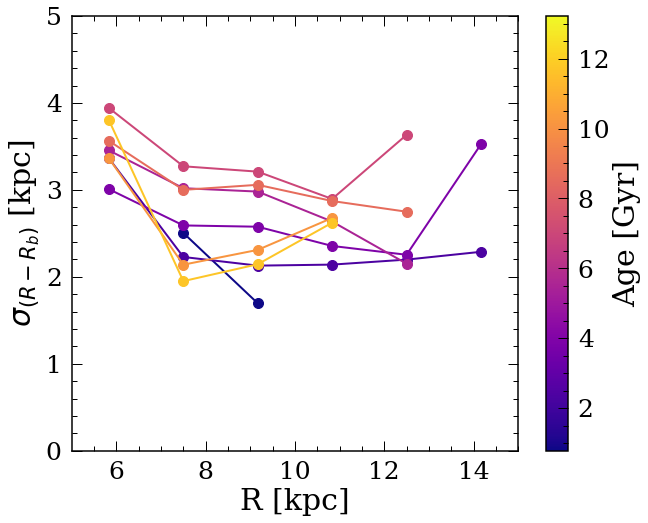

In [668]:
colors = getcolor(ages)
plt.figure(figsize=(10,8))
for i in range(len(ages)):
    plt.plot(rs, sigmaR[i,:], '-o', color=colors[i], markersize=10)
plt.scatter(-10,-10,c=0, vmin=min(ages), vmax=max(ages),cmap='plasma')
cb = plt.colorbar()
cb.set_label('Age [Gyr]')
plt.xlabel('R [kpc]')
plt.ylabel('$σ_{(R-R_b)}$ [kpc]')
plt.xlim([5,15])
plt.ylim([0,5])





In [629]:
"""plt.hexbin(sub['R'], sub['Z'], C=sub['FEH'], 
           extent=(8.5, 9.5, -3,3), cmap='plasma')
plt.xlim([8.5, 9.5])
plt.ylim([-3,3])"""

"plt.hexbin(sub['R'], sub['Z'], C=sub['FEH'], \n           extent=(8.5, 9.5, -3,3), cmap='plasma')\nplt.xlim([8.5, 9.5])\nplt.ylim([-3,3])"

In [658]:
"""m = abs(sub['R']-11)<1
plt.hist(sub['Z'][m])"""

"m = abs(sub['R']-11)<1\nplt.hist(sub['Z'][m])"

https://ui.adsabs.harvard.edu/abs/2012A%26A...548A.127M/abstract

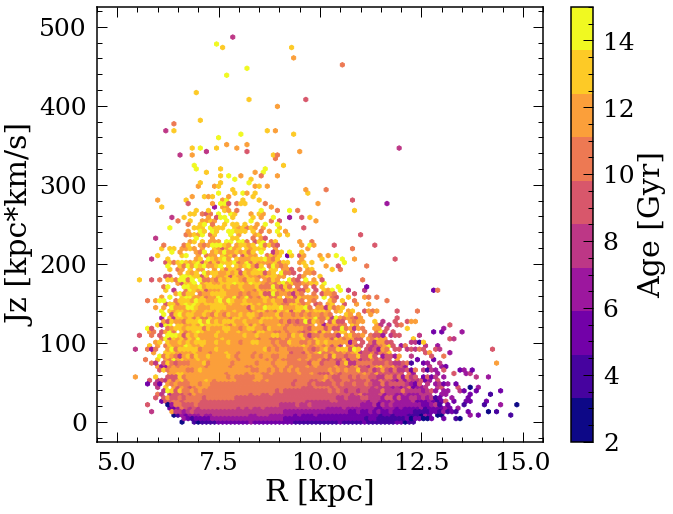

In [1061]:
plt.figure(figsize=(10,8))
plt.hexbin(sub['R'], sub['JZ'], C= sub['AGE'], 
           extent=(5,15,0,500),vmin=2, vmax=15,
          cmap=plt.get_cmap('plasma',10),mincnt=1)
plt.xlabel('R [kpc]')
plt.ylabel('Jz [kpc*km/s]')
cb = plt.colorbar()
cb.set_label('Age [Gyr]')

In [1063]:
from astropy.table import Table
sub = Table.read('subgiant_fullparam_update.fits', format='fits')
sub = sub.to_pandas()
sub_rbir = pd.read_csv('RbirLAMOST.csv')
sub_rbir.columns

sub_rbir = sub_rbir.rename(columns={'          rb': 'Rb', 
                                    '          rb_err': 'Rb_err',
                                   '       specid':'specid'})
sub['SPECID'] = [str(i.decode(encoding="utf-8").split()[0]) for i in sub['SPECID']]
sub_rbir['specid'] = [str(i.split()[0]) for i in sub_rbir['specid']]

sub = pd.merge(sub, 
               sub_rbir[['specid', 'Rb', 'Rb_err']], 
               left_on='SPECID', right_on='specid', how='inner')
#sub

Text(0, 0.5, 'Rb-R [kpc]')

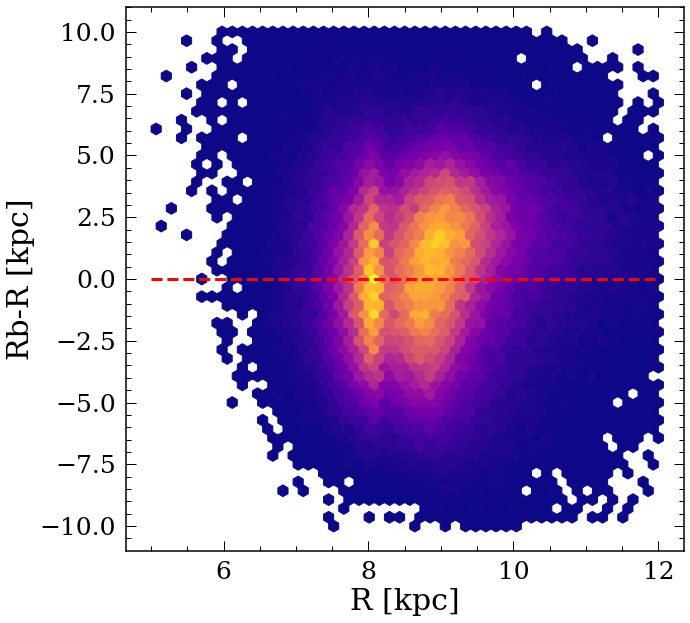

In [1095]:
plt.hexbin(sub['R'], sub['Rb']-sub['R_GUIDING'], extent=(5,12,-10,10),
           cmap='plasma', mincnt=1, gridsize=50)
plt.plot([5,12],[0,0],'r--',linewidth=3)
plt.xlabel('R [kpc]')
plt.ylabel('Rb-R [kpc]')